### Read one final image to know what is each band

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates
import rasterio

In [66]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

#### Análise de uma imagem e suas bandas

In [67]:
# Open the .tif image file
with rasterio.open('tif_files_final/S2_MSIL1C_20221007T104931_samp_mask_C2RCC_mathbands.tif') as dataset:
    # # Get the number of bands in the image
    # num_bands = dataset.count
    
    # # Iterate over each band
    # for band in range(1, num_bands + 1):
    #     # Read the band data
    #     band_data = dataset.read(band)
        
    #     # Get the band name
    #     band_name = band_labels[band - 1]
        
    #     # Plot the band data
    #     plt.imshow(band_data, cmap='gray')
    #     plt.title(f'Band {band}: {band_name}')
    #     plt.colorbar()
    #     plt.show()

    print(dataset.read(38).mean())
    

0.061763924


### Análise das bandas e da variação da radiância após a correção

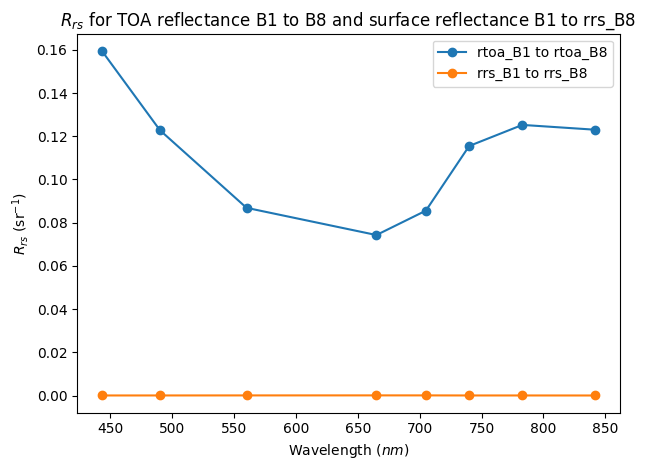

In [68]:
# Open the geotiff file
with rasterio.open('S2_MSIL1C_20230118T110401_samp_mask_C2RCC_mathbands.tif') as dataset:
    # Read the bands B1, B2, B3, B4, B5, B6, B7, and B8
    band1 = dataset.read(band_indices['rtoa_B1'])
    band2 = dataset.read(band_indices['rtoa_B2'])
    band3 = dataset.read(band_indices['rtoa_B3'])
    band4 = dataset.read(band_indices['rtoa_B4'])
    band5 = dataset.read(band_indices['rtoa_B5'])
    band6 = dataset.read(band_indices['rtoa_B6'])
    band7 = dataset.read(band_indices['rtoa_B7'])
    band8 = dataset.read(band_indices['rtoa_B8'])

    # Calculate the mean of pixel values for each band
    mean_band1 = band1.mean()
    mean_band2 = band2.mean()
    mean_band3 = band3.mean()
    mean_band4 = band4.mean()
    mean_band5 = band5.mean()
    mean_band6 = band6.mean()
    mean_band7 = band7.mean()
    mean_band8 = band8.mean()

    # Plot the mean values
    wavelengths = [443, 490, 560, 665, 705, 740, 783, 842]
    mean_values = [mean_band1, mean_band2, mean_band3, mean_band4, mean_band5, mean_band6, mean_band7, mean_band8]

    plt.plot(wavelengths, mean_values, marker='o', label='rtoa_B1 to rtoa_B8')
    
    # Read the bands rrs_B1 to rrs_B8
    rrs_band1 = dataset.read(band_indices['rrs_B1'])
    rrs_band2 = dataset.read(band_indices['rrs_B2'])
    rrs_band3 = dataset.read(band_indices['rrs_B3'])
    rrs_band4 = dataset.read(band_indices['rrs_B4'])
    rrs_band5 = dataset.read(band_indices['rrs_B5'])
    rrs_band6 = dataset.read(band_indices['rrs_B6'])
    rrs_band7 = dataset.read(band_indices['rrs_B7'])
    rrs_band8 = dataset.read(band_indices['rrs_B8A'])

    # Calculate the mean of pixel values for each rrs band
    mean_rrs_band1 = rrs_band1.mean()
    mean_rrs_band2 = rrs_band2.mean()
    mean_rrs_band3 = rrs_band3.mean()
    mean_rrs_band4 = rrs_band4.mean()
    mean_rrs_band5 = rrs_band5.mean()
    mean_rrs_band6 = rrs_band6.mean()
    mean_rrs_band7 = rrs_band7.mean()
    mean_rrs_band8 = rrs_band8.mean()

    # Plot the mean values for rrs bands
    mean_rrs_values = [mean_rrs_band1, mean_rrs_band2, mean_rrs_band3, mean_rrs_band4, mean_rrs_band5, mean_rrs_band6, mean_rrs_band7, mean_rrs_band8]
    
    plt.plot(wavelengths, mean_rrs_values, marker='o', label='rrs_B1 to rrs_B8')

    # # Read the bands rrs_B1 to rrs_B8
    # rrs_band1 = dataset.read(band_indices['rpath_B1'])
    # rrs_band2 = dataset.read(band_indices['rpath_B2'])
    # rrs_band3 = dataset.read(band_indices['rpath_B3'])
    # rrs_band4 = dataset.read(band_indices['rpath_B4'])
    # rrs_band5 = dataset.read(band_indices['rpath_B5'])
    # rrs_band6 = dataset.read(band_indices['rpath_B6'])
    # rrs_band7 = dataset.read(band_indices['rpath_B7'])
    # rrs_band8 = dataset.read(band_indices['rpath_B8A'])

    # # Calculate the mean of pixel values for each rrs band
    # mean_rpath_band1 = rrs_band1.mean()
    # mean_rpath_band2 = rrs_band2.mean()
    # mean_rpath_band3 = rrs_band3.mean()
    # mean_rpath_band4 = rrs_band4.mean()
    # mean_rpath_band5 = rrs_band5.mean()
    # mean_rpath_band6 = rrs_band6.mean()
    # mean_rpath_band7 = rrs_band7.mean()
    # mean_rpath_band8 = rrs_band8.mean()

    # # Plot the mean values for rrs bands
    # mean_rpath_values = [mean_rpath_band1, mean_rpath_band2, mean_rpath_band3, mean_rpath_band4, mean_rpath_band5, mean_rpath_band6, mean_rpath_band7, mean_rpath_band8]
    
    # plt.plot(wavelengths, mean_rpath_values, marker='o', label='rpath_B1 to rpath_B8')
    

    plt.xlabel('Wavelength ($nm$)')
    plt.ylabel('$R_{rs}$ (sr$^{-1}$)')
    plt.title('$R_{rs}$ for TOA reflectance B1 to B8 and surface reflectance B1 to rrs_B8')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Data processing

### Load and cleaning data

In [69]:
import pandas as pd

# Read the Excel file
excel_file = pd.ExcelFile('results_consolidate_for_pandas.xlsx')

# Get the names of all tabs in the Excel file
sheet_names = excel_file.sheet_names

# Create an empty dictionary to store the dataframes
dataframes = {}

# Iterate over each tab
for sheet_name in sheet_names:
    # Read the tab as a dataframe
    df = excel_file.parse(sheet_name)
    
    # Store the dataframe in the dictionary
    dataframes[sheet_name] = df

# Access the dataframes by their tab names
for sheet_name, df in dataframes.items():
    print(f"Dataframe for tab '{sheet_name}':")
    display(df)
    print()


Dataframe for tab 'results_initial':


,Date,windows5x5_kd_z90max_mean,windows5x5_3_bands_model_chl_conc_mean,windows5x5_empirical_2_bands_equation1_mean,windows5x5_empirical_2_bands_equation2_mean,windows5x5_empirical_3_bands_equation1_mean,windows5x5_empirical_3_bands_equation3_mean,windows5x5_conc_chl_mean,windows3x3_3_bands_model_chl_conc_mean,windows3x3_empirical_2_bands_equation1_mean,...,3_bands_model_chl_conc,empirical_2_bands_equation1,empirical_2_bands_equation2,empirical_3_bands_equation1,empirical_3_bands_equation3,conc_chl,Chl (C2RCC Adjusted All Pix),Chla without Oz (C2RCC),Chl (C2X-COMPLEX-Nets All Pix),Chl in loco REAL
0,2022-10-07 10:49:31,1.206965,12.847613,22.033922,13.875828,15.885210,13.487042,14.481098,12.829199,22.074558,...,12.8323,21.6171,13.6341,15.8202,13.4365,14.9729,8.391555,15.1681,101.7633,8.51000
1,2022-10-22 10:50:09,4.918787,6.138085,8.341957,4.913167,11.634617,7.542959,4.760775,5.016477,6.885368,...,9.7746,13.1632,8.8410,13.7407,10.4544,11.8520,7.332913,12.5772,76.8449,4.71375
2,2022-11-01 10:51:09,2.298946,8.155785,14.995783,9.021809,13.208697,9.649691,7.826222,7.404113,14.266416,...,8.8066,15.6070,9.5131,13.5431,10.1320,10.6505,6.890000,12.8600,49.6400,4.30500
3,2022-11-04 11:01:29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,12.6166,21.6068,13.4892,15.7100,13.3089,11.4901,7.200000,13.5800,76.0600,9.72500
4,2023-01-18 11:04:01,0.811337,18.216927,29.984156,18.477802,18.669619,17.925224,6.110522,17.345070,28.695522,...,17.5928,27.7247,17.6331,18.2696,17.2904,8.3385,5.990000,12.8700,32.7400,0.22000
5,2023-02-07 11:02:21,1.181622,12.577086,21.283950,13.366044,15.681020,13.224243,19.587223,13.341068,23.119913,...,13.0090,21.0181,13.4839,15.8450,13.4893,17.3361,9.130000,16.4000,22.2200,1.14000
6,2023-02-09 10:51:59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2023-02-14 10:51:41,3.099400,6.484349,11.885307,6.636937,12.125772,8.209411,4.240960,6.714031,12.254485,...,5.3036,8.2816,4.4165,11.2335,7.0179,3.3422,3.530000,4.6700,44.7800,4.71625
8,2023-02-27 11:00:11,0.857706,18.584301,29.296751,18.689785,18.844263,18.151117,8.166728,18.648410,29.907589,...,16.6592,27.1199,17.0995,17.8589,16.5868,13.0126,7.740000,16.4100,46.4200,7.93250
9,2023-04-03 10:56:29,1.425691,12.075270,20.713058,13.092575,15.448322,12.836637,21.963083,12.677329,21.928070,...,9.3848,15.2483,9.6068,13.7630,10.4519,16.6730,8.930000,15.9500,20.3800,8.58000



Dataframe for tab 'results_final':


,Date,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma
0,2022-10-07 10:49:31,11.363131,1.194454,11.394294,2.075915,10.0543,4.9180
1,2022-10-22 10:50:09,NaN,NaN,NaN,NaN,8.9381,4.6267
2,2022-11-01 10:51:09,9.471119,2.557038,9.333033,4.237271,6.9454,5.4899
3,2022-11-04 11:01:29,NaN,0.000000,13.798728,2.446890,7.9442,6.1450
4,2023-01-18 11:04:01,5.915650,4.918062,6.500003,5.882575,5.8767,5.3206
5,2023-02-07 11:02:21,11.409929,1.973134,11.999173,3.076847,12.0182,4.4585
6,2023-02-09 10:51:59,NaN,NaN,NaN,NaN,NaN,NaN
7,2023-02-14 10:51:41,5.278747,2.397119,4.430862,2.393104,2.8740,2.0489
8,2023-02-27 11:00:11,6.899830,2.421804,7.112814,3.282846,8.8938,5.6287
9,2023-04-03 10:56:29,13.913920,3.389864,13.319674,2.930308,10.2803,5.3384



Dataframe for tab 'results_validation':


,Date,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma
0,2023-10-05,9.784766,2.393852,10.021576,1.982935,9.8346,4.8119
1,2023-10-07,10.364924,3.342311,13.159447,3.875402,10.3247,6.3304
2,2023-10-17,12.719359,3.550704,9.634494,5.101158,8.2507,5.9364
3,2023-11-19,10.231260,3.785084,8.836949,4.869211,7.9150,5.4839
4,2023-12-06,0.225038,0.146777,0.208491,0.149733,0.2348,0.1915
5,2023-12-16,0.984444,0.892209,0.628259,0.760695,0.7228,0.9470
6,2024-01-05,7.446182,3.353092,5.843303,3.610125,5.0567,4.1353



Dataframe for tab 'data_loco_validation':


,time,chlorophylle A
0,2023-10-04 00:16:19,41.46
1,2023-10-04 00:31:19,72.39
2,2023-10-04 00:46:19,45.35
3,2023-10-04 01:01:19,45.34
4,2023-10-04 01:16:19,34.19
...,...,...
8497,2024-01-05 22:46:28,0.14
8498,2024-01-05 23:01:28,0.48
8499,2024-01-05 23:16:28,0.62
8500,2024-01-05 23:31:28,0.09



Dataframe for tab 'data_loco':


,time,chlorophylle A
0,2022-09-30 09:31:00,10.18
1,2022-09-30 09:46:00,10.61
2,2022-09-30 10:01:00,9.56
3,2022-09-30 10:16:00,7.93
4,2022-09-30 10:31:00,12.47
...,...,...
31923,2023-10-03 07:01:00,68.80
31924,2023-10-03 07:16:00,58.34
31925,2023-10-03 07:31:00,60.49
31926,2023-10-03 07:46:00,49.99



Dataframe for tab 'meteo':


,Date,Temperature,Pressure,Ozone
0,2022-10-07 10:49:31,17.740,1002.9475,279.259583
1,2022-10-22 10:50:09,19.884,993.8275,261.562775
2,2022-11-01 10:51:09,16.368,998.8075,287.823151
3,2022-11-04 11:01:29,12.344,992.3275,287.823151
4,2023-01-18 11:04:01,4.968,982.7150,250.000000
5,2023-02-07 11:02:21,4.696,1016.4850,265.382355
6,2023-02-14 10:51:41,7.264,1011.1000,227.686096
7,2023-02-27 11:00:11,5.184,1005.6425,161.950439
8,2023-04-03 10:56:29,9.692,1006.4725,300.000000
9,2023-04-05 10:50:31,11.548,1001.8400,378.380219



Dataframe for tab 'vimeo_data_sensor':


,date,time,depth,totChl
0,19.09.2022,12:39:21,0.42,26.65
1,19.09.2022,12:39:24,0.41,25.90
2,19.09.2022,12:39:27,0.42,24.35
3,19.09.2022,12:39:30,0.44,25.74
4,19.09.2022,12:39:32,0.44,27.10
...,...,...,...,...
2104,12.06.2023,10:20:55,5.03,56.16
2105,12.06.2023,10:20:58,5.04,58.30
2106,12.06.2023,10:21:01,5.03,60.31
2107,12.06.2023,10:21:03,5.03,60.38



Dataframe for tab 'laboratory_data':


,Date,Chla Conc,Secchi_m
0,2022-10-27,31.47,1.00
1,2022-11-17,27.85,1.90
2,2022-12-13,2.22,5.00
3,2023-01-04,1.14,5.20
4,2023-02-09,4.08,5.00
5,2023-03-13,122.03,NaN
6,2023-04-13,1.94,NaN
7,2023-06-12,10.47,2.60
8,2023-07-21,70.21,0.75
9,2023-08-24,11.42,1.20


In [70]:
# Read the Excel file
df_loco = dataframes['data_loco']

#Convert the 'time' column to datetime
df_loco['time'] = pd.to_datetime(df_loco['time'])

#Set the 'time' column as the index
df_loco.set_index('time', inplace=True)

# Create dataframe for sensor data
df_vimeo = dataframes['vimeo_data_sensor']

#Convert the 'date' column to datetime
df_vimeo['date'] = pd.to_datetime(df_vimeo['date'])

#Set the 'time' column as the index
df_vimeo.set_index('date', inplace=True)

# Create dataframe for laboratory data
df_datalab = dataframes['laboratory_data']

#Convert the 'Date' column to datetime
df_datalab['Date'] = pd.to_datetime(df_datalab['Date'])

#Set the 'Date' column as the index
df_datalab.set_index('Date', inplace=True)

# Create dataframe for vimeo data with depth between 1 and 2 meters
depth_between_1_and_2 = df_vimeo[(df_vimeo['depth'] >= 1.3) & (df_vimeo['depth'] <= 1.7)]


C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\3427084913.py:14: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_vimeo['date'] = pd.to_datetime(df_vimeo['date'])


In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean_secchi = filtered_df2['Secchi_m'].resample('D').mean()
    
    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))
    
    # Plot chlorophylle-A concentration on the first y-axis
    ax1.plot(daily_mean1.index, daily_mean1, marker='o', label='Chlorophylle A - In Situ (Mean)')
    ax1.plot(daily_mean4.index, daily_mean4, marker='o', label='Chlorophylle A - In Situ (Median)')
    ax1.plot(daily_mean2.index, daily_mean2, marker='o', label='Chlorophylle A - Laboratory')
    ax1.plot(daily_mean3.index, daily_mean3, marker='o', label='Chlorophylle A - Vimeo all depths')
    ax1.plot(daily_mean5.index, daily_mean5, marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    ax1.set_ylim(0)
    ax1.set_title('Time series of chlorophylle-A concentration by different methods')
    ax1.legend()
    
    # # Create a second y-axis for Secchi depth
    # ax2 = ax1.twinx()
    
    # # Plot Secchi depth on the second y-axis
    # ax2.bar(daily_mean_secchi.index, daily_mean_secchi, alpha=0.2, color='blue', label='Secchi depth')
    # ax2.set_ylabel('Secchi depth (m)')
    # ax2.set_ylim(0, 6)
    # ax2.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean_secchi = filtered_df2['Secchi_m'].resample('D').mean()
    
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
    
    # Plot chlorophylle-A concentration on the first subplot
    daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)', ax=ax1)
    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)', ax=ax1)
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory', ax=ax1)
    daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths', ax=ax1)
    daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths', ax=ax1)
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    ax1.set_ylim(0)
    ax1.set_xlabel('Date')
    ax1.set_title('Time series of chlorophylle-A concentration by different methods')
    ax1.legend()
    
    # Plot Secchi depth on the second subplot
    ax2.bar(daily_mean_secchi.index, daily_mean_secchi, alpha=0.2, color='blue', label='Secchi depth')
    ax2.set_ylabel('Secchi depth (m)')
    ax2.set_xlabel('Date')
    ax2.set_ylim(0)
    ax2.set_title('Time series of Secchi depth')
    ax2.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax2.xaxis.set_major_locator(mdates.MonthLocator())
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

Analise dos dados meteorólogicos

In [73]:
df_meteo = dataframes['meteo']
df_meteo

,Date,Temperature,Pressure,Ozone
0,2022-10-07 10:49:31,17.740,1002.9475,279.259583
1,2022-10-22 10:50:09,19.884,993.8275,261.562775
2,2022-11-01 10:51:09,16.368,998.8075,287.823151
3,2022-11-04 11:01:29,12.344,992.3275,287.823151
4,2023-01-18 11:04:01,4.968,982.7150,250.000000
5,2023-02-07 11:02:21,4.696,1016.4850,265.382355
6,2023-02-14 10:51:41,7.264,1011.1000,227.686096
7,2023-02-27 11:00:11,5.184,1005.6425,161.950439
8,2023-04-03 10:56:29,9.692,1006.4725,300.000000
9,2023-04-05 10:50:31,11.548,1001.8400,378.380219


In [74]:
# Read the dataframe
df_meteo = dataframes['meteo']

#Convert the 'time' column to datetime
df_meteo['Date'] = pd.to_datetime(df_meteo['Date'])

#Set the 'time' column as the index
df_meteo.set_index('Date', inplace=True)

# Display the dataframe
df_meteo

,Temperature,Pressure,Ozone
Date,,,
2022-10-07 10:49:31,17.740,1002.9475,279.259583
2022-10-22 10:50:09,19.884,993.8275,261.562775
2022-11-01 10:51:09,16.368,998.8075,287.823151
2022-11-04 11:01:29,12.344,992.3275,287.823151
2023-01-18 11:04:01,4.968,982.7150,250.000000
2023-02-07 11:02:21,4.696,1016.4850,265.382355
2023-02-14 10:51:41,7.264,1011.1000,227.686096
2023-02-27 11:00:11,5.184,1005.6425,161.950439
2023-04-03 10:56:29,9.692,1006.4725,300.000000


In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-10-01'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-09-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_meteo.loc[start_date:end_date]
    
    # Resample the data to daily frequency and calculate the mean for each day
    temperature = filtered_df['Temperature'].resample('D').mean().dropna()
    ozone = filtered_df['Ozone'].resample('D').mean().dropna()
    pressure = filtered_df['Pressure'].resample('D').mean().dropna()

    fig, axes = plt.subplots(3, 1, figsize=(20, 15))
    
    axes[0].plot(temperature.index, temperature.values, marker='^', linestyle='solid', color='red', linewidth=2)
    axes[0].set_ylabel('Temperature ($^{\circ}C$)')
    axes[0].set_xlabel('Date')
    axes[0].set_title('Temperature')
    
    axes[1].plot(ozone,linestyle='solid',  marker='o', color='green', linewidth=2)
    axes[1].set_ylabel('Ozone ($DU$)')
    axes[1].set_xlabel('Date')
    axes[1].set_title('Ozone')
    
    axes[2].plot(pressure, linestyle='solid', marker='s', color='blue', linewidth=2)
    axes[2].set_ylabel('Air Pressure ($hPa$)')
    axes[2].set_xlabel('Date')
    axes[2].set_title('Air Pressure')
    
    # Format x-axis ticks as months (mm/yyyy)
    for ax in axes:
        ax.xaxis.set_major_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()
    plt.savefig('results_images/meteo.png')

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2022-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-09-30 00:00:00'), description='End Date', step=1)

Output()

#### Mean data of ozone and pressure for use in the report

In [76]:
ozone = df_meteo['Ozone'].resample('D').mean().dropna()
display(ozone)
print(ozone.mean())

Date
2022-10-07    279.259583
2022-10-22    261.562775
2022-11-01    287.823151
2022-11-04    287.823151
2023-01-18    250.000000
2023-02-07    265.382355
2023-02-14    227.686096
2023-02-27    161.950439
2023-04-03    300.000000
2023-04-05    378.380219
2023-04-08    357.013184
2023-05-03    352.213623
2023-05-20    350.569885
2023-05-25    344.975952
2023-05-28    360.705872
2023-06-02    335.737518
2023-06-04    339.699921
2023-06-07    357.505157
2023-06-14    354.186310
2023-08-21    297.653030
2023-09-02    317.626312
2023-09-07    271.778412
2023-09-10    267.492920
2023-09-15    287.311768
2023-09-25    258.814514
Name: Ozone, dtype: float64

302.12608589999996


In [77]:
pressure = df_meteo['Pressure'].resample('D').mean().dropna()
display(pressure)
print(pressure.mean())


Date
2022-10-07    1002.9475
2022-10-22     993.8275
2022-11-01     998.8075
2022-11-04     992.3275
2023-01-18     982.7150
2023-02-07    1016.4850
2023-02-14    1011.1000
2023-02-27    1005.6425
2023-04-03    1006.4725
2023-04-05    1001.8400
2023-04-08    1004.5750
2023-05-03    1001.2425
2023-05-20     999.3150
2023-05-25    1005.7775
2023-05-28     998.7325
2023-06-02     999.7550
2023-06-04     999.5225
2023-06-07     997.9875
2023-06-14     995.8575
2023-08-21    1004.0550
2023-09-02    1001.0750
2023-09-07     998.1875
2023-09-10     997.5600
2023-09-15     994.5700
2023-09-25    1003.7325
Name: Pressure, dtype: float64

1000.5644


### Reading all .tif files and plotting in subplot

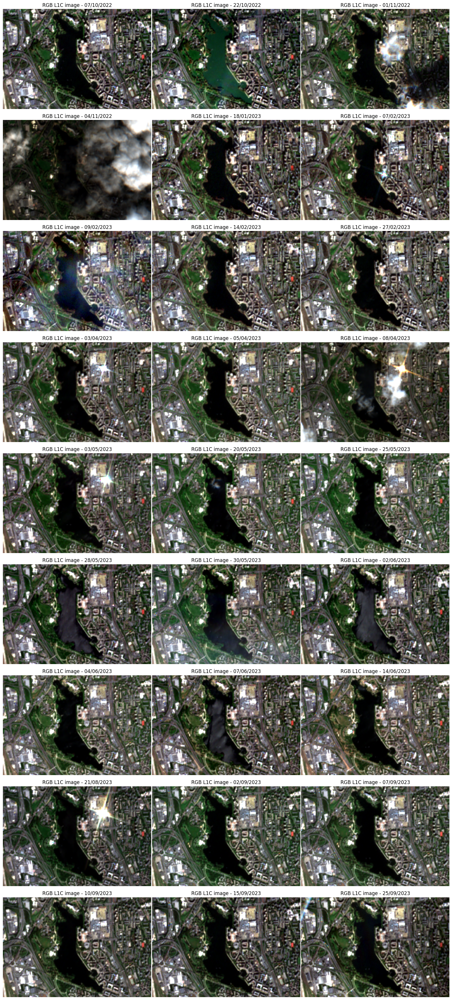

In [78]:
import os
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

directory = 'tif_subset_files/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[5]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Number of columns in the plot
num_colunas = 3

# Calculate the number of lines in the plot
num_linhas = (len(arquivos_tif) + num_colunas - 1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 5 * num_linhas))
fig.subplots_adjust(wspace=0.005, hspace=0.0005,)

def stretch(band, lower_percent=2, higher_percent=98):
    a = 0 # min value
    b = 255 # max value
    c = np.percentile(band, lower_percent)
    d = np.percentile(band, higher_percent)
    t = a + (band - c) * (b - a) / (d - c)
    t[t<a] = a
    t[t>b] = b
    return t

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        rgb = src.read([4, 3, 2])

        # Normalize the bands using histogram stretching
        for band in range(rgb.shape[0]):
            rgb[band] = stretch(rgb[band])

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        # Plot the RGB image on the subplot
        axs[linha, coluna].imshow(rgb.transpose((1, 2, 0)) / 255)  # Divide by 255 to normalize to 0-1
        axs[linha, coluna].set_title(f'RGB L1C image - {date.strftime("%d/%m/%Y")}')
        axs[linha, coluna].axis('off')
        
# Remove all axes from the subplots
for ax in axs.flat:
    ax.axis('off')

# Exibir a figura
plt.show()

### Análise das bandas e da variação da radiância após a correção

In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import os
import sys

In [80]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

### Análise das bandas e da variação da radiância após a correção

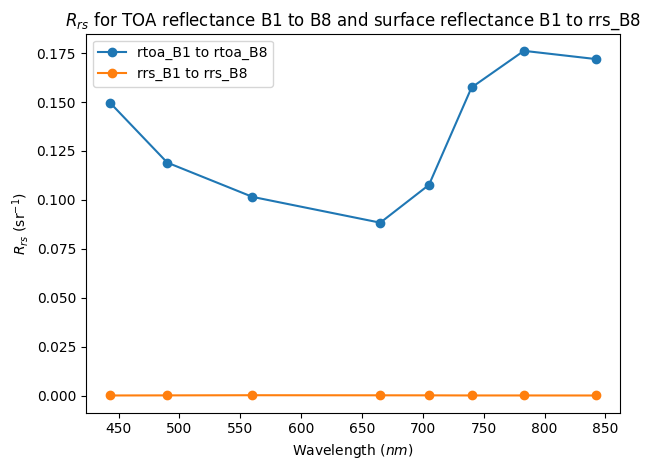

In [81]:
# Open the geotiff file
with rasterio.open('tif_files/S2_MSIL1C_20221007T104931_samp_mask_C2RCC_mathbands.tif') as dataset:
    # Read the bands B1, B2, B3, B4, B5, B6, B7, and B8
    band1 = dataset.read(band_indices['rtoa_B1'])
    band2 = dataset.read(band_indices['rtoa_B2'])
    band3 = dataset.read(band_indices['rtoa_B3'])
    band4 = dataset.read(band_indices['rtoa_B4'])
    band5 = dataset.read(band_indices['rtoa_B5'])
    band6 = dataset.read(band_indices['rtoa_B6'])
    band7 = dataset.read(band_indices['rtoa_B7'])
    band8 = dataset.read(band_indices['rtoa_B8'])

    # Calculate the mean of pixel values for each band
    mean_band1 = band1.mean()
    mean_band2 = band2.mean()
    mean_band3 = band3.mean()
    mean_band4 = band4.mean()
    mean_band5 = band5.mean()
    mean_band6 = band6.mean()
    mean_band7 = band7.mean()
    mean_band8 = band8.mean()

    # Plot the mean values
    wavelengths = [443, 490, 560, 665, 705, 740, 783, 842]
    mean_values = [mean_band1, mean_band2, mean_band3, mean_band4, mean_band5, mean_band6, mean_band7, mean_band8]

    plt.plot(wavelengths, mean_values, marker='o', label='rtoa_B1 to rtoa_B8')
    
    # Read the bands rrs_B1 to rrs_B8
    rpath_band1 = dataset.read(band_indices['rrs_B1'])
    rrs_band2 = dataset.read(band_indices['rrs_B2'])
    rrs_band3 = dataset.read(band_indices['rrs_B3'])
    rrs_band4 = dataset.read(band_indices['rrs_B4'])
    rrs_band5 = dataset.read(band_indices['rrs_B5'])
    rrs_band6 = dataset.read(band_indices['rrs_B6'])
    rrs_band7 = dataset.read(band_indices['rrs_B7'])
    rrs_band8 = dataset.read(band_indices['rrs_B8A'])

    # Calculate the mean of pixel values for each rrs band
    mean_rrs_band1 = rrs_band1.mean()
    mean_rrs_band2 = rrs_band2.mean()
    mean_rrs_band3 = rrs_band3.mean()
    mean_rrs_band4 = rrs_band4.mean()
    mean_rrs_band5 = rrs_band5.mean()
    mean_rrs_band6 = rrs_band6.mean()
    mean_rrs_band7 = rrs_band7.mean()
    mean_rrs_band8 = rrs_band8.mean()

    # Plot the mean values for rrs bands
    mean_rrs_values = [mean_rrs_band1, mean_rrs_band2, mean_rrs_band3, mean_rrs_band4, mean_rrs_band5, mean_rrs_band6, mean_rrs_band7, mean_rrs_band8]
    
    plt.plot(wavelengths, mean_rrs_values, marker='o', label='rrs_B1 to rrs_B8')

    # # Read the bands rrs_B1 to rrs_B8
    # rrs_band1 = dataset.read(band_indices['rpath_B1'])
    # rrs_band2 = dataset.read(band_indices['rpath_B2'])
    # rrs_band3 = dataset.read(band_indices['rpath_B3'])
    # rrs_band4 = dataset.read(band_indices['rpath_B4'])
    # rrs_band5 = dataset.read(band_indices['rpath_B5'])
    # rrs_band6 = dataset.read(band_indices['rpath_B6'])
    # rrs_band7 = dataset.read(band_indices['rpath_B7'])
    # rrs_band8 = dataset.read(band_indices['rpath_B8A'])

    # # Calculate the mean of pixel values for each rrs band
    # mean_rpath_band1 = rrs_band1.mean()
    # mean_rpath_band2 = rrs_band2.mean()
    # mean_rpath_band3 = rrs_band3.mean()
    # mean_rpath_band4 = rrs_band4.mean()
    # mean_rpath_band5 = rrs_band5.mean()
    # mean_rpath_band6 = rrs_band6.mean()
    # mean_rpath_band7 = rrs_band7.mean()
    # mean_rpath_band8 = rrs_band8.mean()

    # # Plot the mean values for rrs bands
    # mean_rpath_values = [mean_rpath_band1, mean_rpath_band2, mean_rpath_band3, mean_rpath_band4, mean_rpath_band5, mean_rpath_band6, mean_rpath_band7, mean_rpath_band8]
    
    # plt.plot(wavelengths, mean_rpath_values, marker='o', label='rpath_B1 to rpath_B8')
    

    plt.xlabel('Wavelength ($nm$)')
    plt.ylabel('$R_{rs}$ (sr$^{-1}$)')
    plt.title('$R_{rs}$ for TOA reflectance B1 to B8 and surface reflectance B1 to rrs_B8')
    plt.legend()

    plt.tight_layout()
    plt.show()

### Plot Spectral schema

Analysis of the reflectance values of the resampled L1C images in Subplots individually

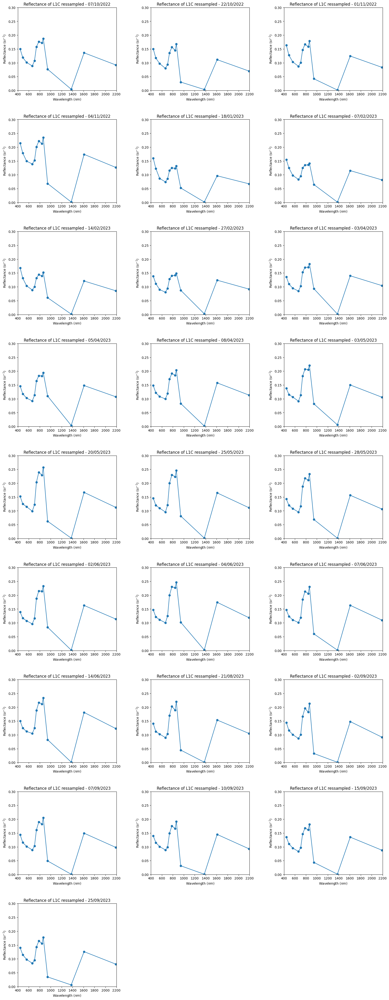

In [82]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[3]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Number of columns in the plot
num_colunas = 3

# Calculate the number of lines in the plot
num_linhas = (len(arquivos_tif) + num_colunas - 1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 6 * num_linhas))
fig.subplots_adjust(wspace=0.35, hspace=0.35)

# Lista de bandas para Rtoa
band_indices_new = { 'B1': band_indices['rtoa_B1'], 'B2': band_indices['rtoa_B2'], 'B3': band_indices['rtoa_B3'], 'B4': band_indices['rtoa_B4'], 'B5': band_indices['rtoa_B5'], \
                 'B6': band_indices['rtoa_B6'], 'B7': band_indices['rtoa_B7'], 'B8': band_indices['rtoa_B8'], 'B8A': band_indices['rtoa_B8A'], 'B9': band_indices['rtoa_B9'], \
                 'B10': band_indices['rtoa_B10'], 'B11': band_indices['rtoa_B11'], 'B12': band_indices['rtoa_B12'] }

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [443, 490, 560, 665, 705, 740, 783, 842, 865, 945, 1375, 1610, 2190]

        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        axs[linha, coluna].plot(wavelengths, rrs_values, marker='o')
        axs[linha, coluna].set_xlabel('Wavelength ($nm$)')
        axs[linha, coluna].set_ylabel('Reflectance (sr$^{-1}$)')
        axs[linha, coluna].set_title(f'Reflectance of L1C ressampled - {date.strftime("%d/%m/%Y")}')


# Limiting the y-axis and x-axis
for ax in axs.flat:
    ax.set_ylim(0, 0.3)
    ax.set_xlim(400, 2200)

# Remove all axes from the empty subplots
for i in range(len(arquivos_tif), num_linhas * num_colunas):
    axs.flatten()[i].axis('off')

# Exibir a figura
plt.show()

Analysis of the reflectance values of the resampled L1C images in one plot

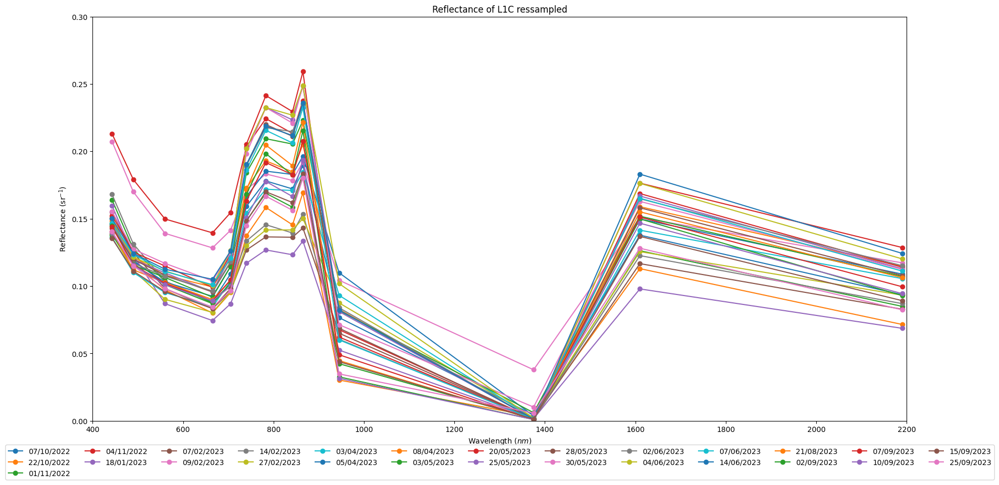

In [83]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Configuring the single plot
fig, ax = plt.subplots(figsize=(20, 10))

# List of bands for Reflectance TOA
band_indices_new = { 'B1': band_indices['rtoa_B1'], 'B2': band_indices['rtoa_B2'], 'B3': band_indices['rtoa_B3'], 'B4': band_indices['rtoa_B4'], 'B5': band_indices['rtoa_B5'], \
                 'B6': band_indices['rtoa_B6'], 'B7': band_indices['rtoa_B7'], 'B8': band_indices['rtoa_B8'], 'B8A': band_indices['rtoa_B8A'], 'B9': band_indices['rtoa_B9'], \
                 'B10': band_indices['rtoa_B10'], 'B11': band_indices['rtoa_B11'], 'B12': band_indices['rtoa_B12'] }

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [443, 490, 560, 665, 705, 740, 783, 842, 865, 945, 1375, 1610, 2190]

        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)

        # Identify which band has the highest/minimum value - Help for the report
        # print(rrs_values[3], 'for ', date.strftime("%d/%m/%Y"))

    ax.plot(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Reflectance (sr$^{-1}$)')
ax.set_title('Reflectance of L1C ressampled')

# Set y-axis and x-axis limits
ax.set_ylim(0, 0.3)
ax.set_xlim(400, 2200)

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)




# Exibir a figura
plt.show()

### Analyse masks - For the report

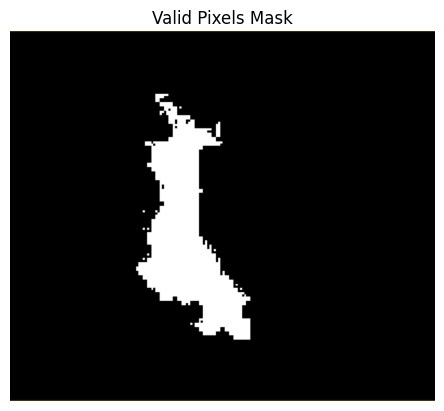

In [84]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read the PNG image
image_path = 'results_images\image of the mask.png'
image = mpimg.imread(image_path)

# Plot the image
plt.imshow(image)
plt.title('Valid Pixels Mask')
plt.axis('off')
plt.show()


### Analysing C2RCC outputs

In [85]:
# Load the output indices again

# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

Analise do Rrs para o pós C2RCC

C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\110641712.py:47: RuntimeWarning: Mean of empty slice.
  mean_rrs_band = rrs_band.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


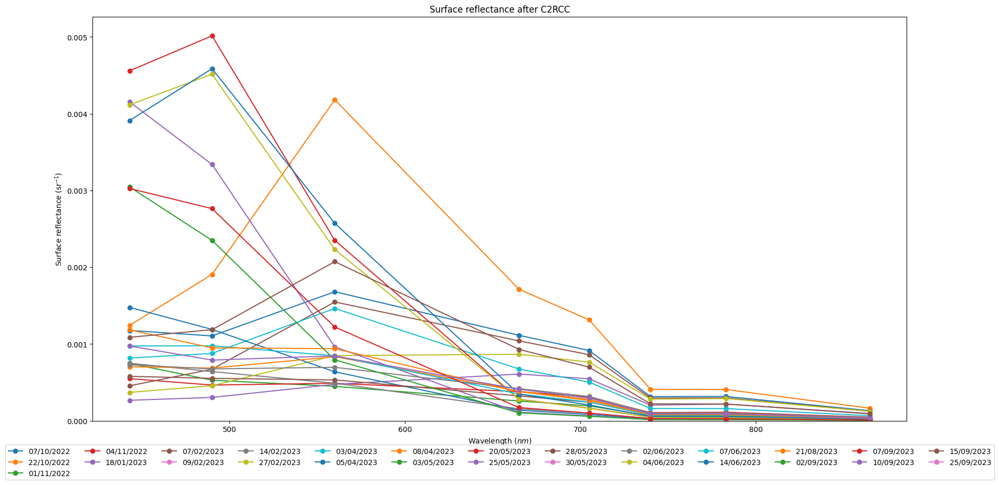

In [86]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Configuring the single plot
fig, ax = plt.subplots(figsize=(20, 10))

# List of bands for Reflectance TOA
band_indices_new = { 'B1': band_indices['rrs_B1'], 'B2': band_indices['rrs_B2'], 'B3': band_indices['rrs_B3'], 'B4': band_indices['rrs_B4'], 'B5': band_indices['rrs_B5'], \
                 'B6': band_indices['rrs_B6'], 'B7': band_indices['rrs_B7'], 'B8A': band_indices['rrs_B8A']}

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [443, 490, 560, 665, 705, 740, 783,  865]
        std_rrs_band = []
        rrs_values = []

        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            std_rrs_band.append(rrs_band.std())  # Calculate the standard deviation
            rrs_values.append(mean_rrs_band)

        # Plot the standard deviation as error bars parameter yerr=std_rrs_band
        ax.errorbar(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Surface reflectance (sr$^{-1}$)')
ax.set_title('Surface reflectance after C2RCC')
ax.set_ylim(0)

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)

# Display the figure
plt.show()

C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\4105925117.py:47: RuntimeWarning: Mean of empty slice.
  mean_rrs_band = rrs_band.mean()


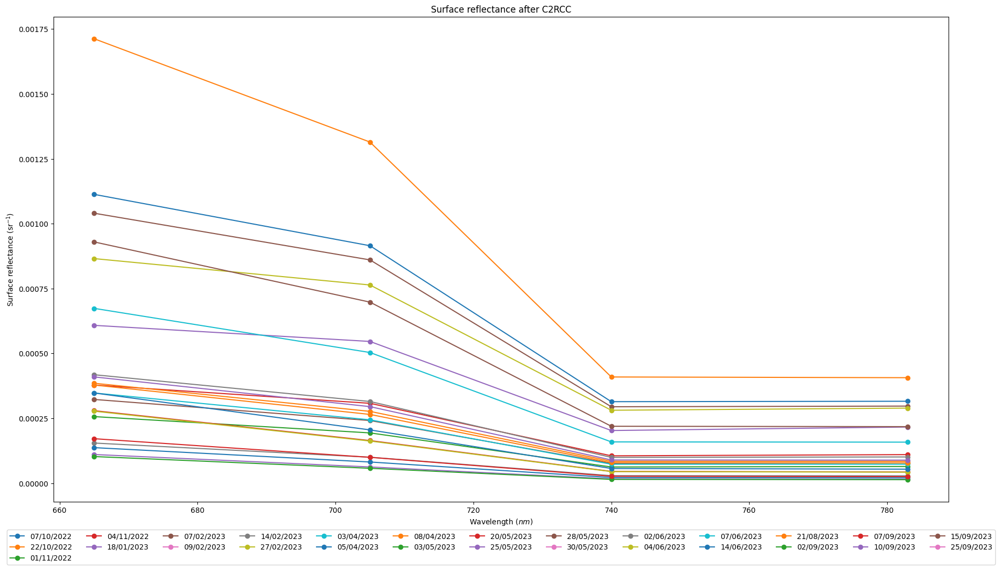

In [87]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Configuring the single plot
fig, ax = plt.subplots(figsize=(22, 12))

# List of bands for Reflectance TOA
band_indices_new = { 'B4': band_indices['rrs_B4'], 'B5': band_indices['rrs_B5'], \
                 'B6': band_indices['rrs_B6'], 'B7': band_indices['rrs_B7']}

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [ 665, 705, 740, 783]
        std_rrs_band = []
        rrs_values = []

        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            std_rrs_band.append(rrs_band.std())  # Calculate the standard deviation
            rrs_values.append(mean_rrs_band)

        # Plot the standard deviation as error bars
        ax.errorbar(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Surface reflectance (sr$^{-1}$)')
ax.set_title('Surface reflectance after C2RCC')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)

# Display the figure
plt.show()

## Analysis using exported data from SNAP - C2RCC after adjusting

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates
import rasterio

# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

### Data processing

Load and clean data

In [89]:
import pandas as pd

# Read the Excel file
excel_file = pd.ExcelFile('results_consolidate_for_pandas.xlsx')

# Get the names of all tabs in the Excel file
sheet_names = excel_file.sheet_names

# Create an empty dictionary to store the dataframes
dataframes = {}

# Iterate over each tab
for sheet_name in sheet_names:
    # Read the tab as a dataframe
    df = excel_file.parse(sheet_name)
    
    # Store the dataframe in the dictionary
    dataframes[sheet_name] = df

# Access the dataframes by their tab names
for sheet_name, df in dataframes.items():
    print(f"Dataframe for tab '{sheet_name}':")


Dataframe for tab 'results_initial':
Dataframe for tab 'results_final':
Dataframe for tab 'results_validation':
Dataframe for tab 'data_loco_validation':
Dataframe for tab 'data_loco':
Dataframe for tab 'meteo':
Dataframe for tab 'vimeo_data_sensor':
Dataframe for tab 'laboratory_data':


In [90]:
# Read the Excel files for final data results

# Reset df_c2rcc dataframe if exists
if 'df_c2rcc' in locals():
    del df_c2rcc

# Read the Excel file
df_c2rcc = dataframes['results_final']

# If column 'Date' exists
if 'Date' in df_c2rcc.columns:
    # Convert the 'Date' column to datetime
    df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])
    # Set the 'Date' column as the index
    df_c2rcc.set_index('Date', inplace=True)


# If the row is completely empty, drop it and save the drop in other dataframe
df_c2rcc = df_c2rcc.dropna(how='all')

# Read the Excel file
df_loco = dataframes['data_loco']

if 'time' in df_loco.columns:
    df_loco.set_index('time', inplace=True)





In [91]:

display(df_c2rcc)
display(df_loco)

,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma
Date,,,,,,
2022-10-07 10:49:31,11.363131,1.194454,11.394294,2.075915,10.0543,4.9180
2022-10-22 10:50:09,NaN,NaN,NaN,NaN,8.9381,4.6267
2022-11-01 10:51:09,9.471119,2.557038,9.333033,4.237271,6.9454,5.4899
2022-11-04 11:01:29,NaN,0.000000,13.798728,2.446890,7.9442,6.1450
2023-01-18 11:04:01,5.915650,4.918062,6.500003,5.882575,5.8767,5.3206
2023-02-07 11:02:21,11.409929,1.973134,11.999173,3.076847,12.0182,4.4585
2023-02-14 10:51:41,5.278747,2.397119,4.430862,2.393104,2.8740,2.0489
2023-02-27 11:00:11,6.899830,2.421804,7.112814,3.282846,8.8938,5.6287
2023-04-03 10:56:29,13.913920,3.389864,13.319674,2.930308,10.2803,5.3384


,chlorophylle A
time,
2022-09-30 09:31:00,10.18
2022-09-30 09:46:00,10.61
2022-09-30 10:01:00,9.56
2022-09-30 10:16:00,7.93
2022-09-30 10:31:00,12.47
...,...
2023-10-03 07:01:00,68.80
2023-10-03 07:16:00,58.34
2023-10-03 07:31:00,60.49


In [92]:
# If df_c2rcc and df_loco its not indexed by 'Date' and 'time' respectively, set the index
if df_c2rcc.index.name != 'Date':
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)


In [93]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]
    
    # Reset index for filtered_df2
    filtered_df2.reset_index(inplace=True)

    dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21']
    for date in dates_to_remove:
        filtered_df2 = filtered_df2.drop(filtered_df2[filtered_df2['Date'] == date].index)

    # Setting index again for filtered_df2
    filtered_df2.set_index('Date', inplace=True)

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['conc_chl_mean_windows_3x3'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean_windows_5x5'].resample('D').mean()
    daily_mean4 = filtered_df2['conc_chl_mean'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean2_unc = filtered_df2['conc_chl_sigma_windows_3x3'].resample('D').mean()
    daily_mean3_unc = filtered_df2['conc_chl_sigma_windows_5x5'].resample('D').mean()
    daily_mean4_unc = filtered_df2['conc_chl_sigma'].resample('D').mean()

    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, yerr=daily_mean1_unc, marker='o', label='Chlorophylle A - In Situ (Median)')
    ax1.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean2_unc, marker='o', label='Chlorophylle A - C2RCC (3x3)')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (5x5)')
    ax1.errorbar(daily_mean4.index, daily_mean4, yerr=daily_mean4_unc, marker='o', label='Chlorophylle A - C2RCC (All pixels)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=17)
    ax1.set_xlabel('Date', fontsize=17)
    # Setting font size for values in axes
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods', fontsize=20)
    ax1.legend(fontsize=14)
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)


DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

### Calculating statistics for each metrics adjusting the in loco data by their lower and upper bounds

In [94]:
### Calculating statistics for each metrics adjusting the in loco data by their lower and upper bounds
# Set to 'time' be the index if it is not
if df_loco.index.name != 'time':
    # Convert colum time in datetime
    df_loco['time'] = pd.to_datetime(df_loco['time'])
    df_loco.set_index('time', inplace=True)
    
teste = df_loco['chlorophylle A'].resample('D').std()
# Calculate upper_bound and lower_bound using quartiles of each day
upper_bound = df_loco['chlorophylle A'].resample('D').quantile(0.75) + 1.5 * teste
lower_bound = df_loco['chlorophylle A'].resample('D').quantile(0.25) - 1.5 * teste

# Transform lower_bound and upper_bound in one dataframe
upper_bound = pd.DataFrame(upper_bound)
lower_bound = pd.DataFrame(lower_bound)
upper_bound.reset_index(inplace=True)
lower_bound.reset_index(inplace=True)
# Rename the columns
upper_bound.columns = ['date', 'upper_bound']
lower_bound.columns = ['date', 'lower_bound']

bounds = pd.merge(upper_bound, lower_bound, on='date')

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

# Excract the date YYYY-MM-DD for df_loco['time']
df_loco['date'] = df_loco['time'].dt.date
df_loco['date'] = pd.to_datetime(df_loco['date'])

# Merge df_loco with bounds by date
df_loco = pd.merge(df_loco, bounds, on='date')

display(df_loco)

# Drop values in df_loco that aren't in the range of bounds
df_loco = df_loco[(df_loco['chlorophylle A'] >= df_loco['lower_bound']) & (df_loco['chlorophylle A'] <= df_loco['upper_bound'])]




,time,chlorophylle A,date,upper_bound,lower_bound
0,2022-09-30 09:31:00,10.18,2022-09-30,13.415148,2.049852
1,2022-09-30 09:46:00,10.61,2022-09-30,13.415148,2.049852
2,2022-09-30 10:01:00,9.56,2022-09-30,13.415148,2.049852
3,2022-09-30 10:16:00,7.93,2022-09-30,13.415148,2.049852
4,2022-09-30 10:31:00,12.47,2022-09-30,13.415148,2.049852
...,...,...,...,...,...
31923,2023-10-03 07:01:00,68.80,2023-10-03,75.567690,44.902310
31924,2023-10-03 07:16:00,58.34,2023-10-03,75.567690,44.902310
31925,2023-10-03 07:31:00,60.49,2023-10-03,75.567690,44.902310
31926,2023-10-03 07:46:00,49.99,2023-10-03,75.567690,44.902310


In [95]:
from datetime import timedelta

# Remove column chlorophyllle A from c2rcc but only if exists
if 'chlorophylle A' in df_c2rcc.columns:
    df_c2rcc.drop(columns=['chlorophylle A'], inplace=True)

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

# Create a new column with the closest value of chlorophyllle A from in situ data

def encontrar_valor_proximo(x, df, janela_temporal=2):
    data_alvo = x['Date']
    valor_alvo = x['conc_chl_mean']

    janela_superior = data_alvo + timedelta(days=janela_temporal)
    janela_inferior = data_alvo - timedelta(days=janela_temporal)

    dados_no_intervalo = df[(df['time'] >= janela_inferior) & (df['time'] <= janela_superior)]

    if not dados_no_intervalo.empty:
       
        # Calcular a diferença nos valores
        dados_no_intervalo['dif_values'] = abs(dados_no_intervalo['chlorophylle A'] - valor_alvo)
        
        linha_mais_proxima = dados_no_intervalo.loc[dados_no_intervalo['dif_values'].idxmin()]
        
        return linha_mais_proxima['chlorophylle A']
    else:
        return None

df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)

# display the columns chlorophyllle A and conc_chl
display(df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean']])

C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\2292732887.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)


,chlorophylle A - Adjusted,conc_chl_mean
0,10.05,10.0543
1,6.40,8.9381
2,6.96,6.9454
3,7.94,7.9442
4,0.77,5.8767
5,10.18,12.0182
6,2.99,2.8740
7,8.90,8.8938
8,9.50,10.2803
9,2.08,2.0556


#### Scatter plots and metrics for each extraction method

For conc_chl calculated for all the lake

,chlorophylle A - Adjusted,conc_chl_mean,Date
0,10.05,10.0543,2022-10-07 10:49:31
2,6.96,6.9454,2022-11-01 10:51:09
3,7.94,7.9442,2022-11-04 11:01:29
6,2.99,2.8740,2023-02-14 10:51:41
7,8.90,8.8938,2023-02-27 11:00:11
8,9.50,10.2803,2023-04-03 10:56:29
9,2.08,2.0556,2023-04-05 10:50:31
11,1.70,0.6171,2023-05-20 10:46:29
12,7.76,0.4611,2023-05-25 10:50:31
13,7.48,7.4886,2023-05-30 10:46:29


Intercept: [1.69441641]
Coefficient: [[0.80435173]]


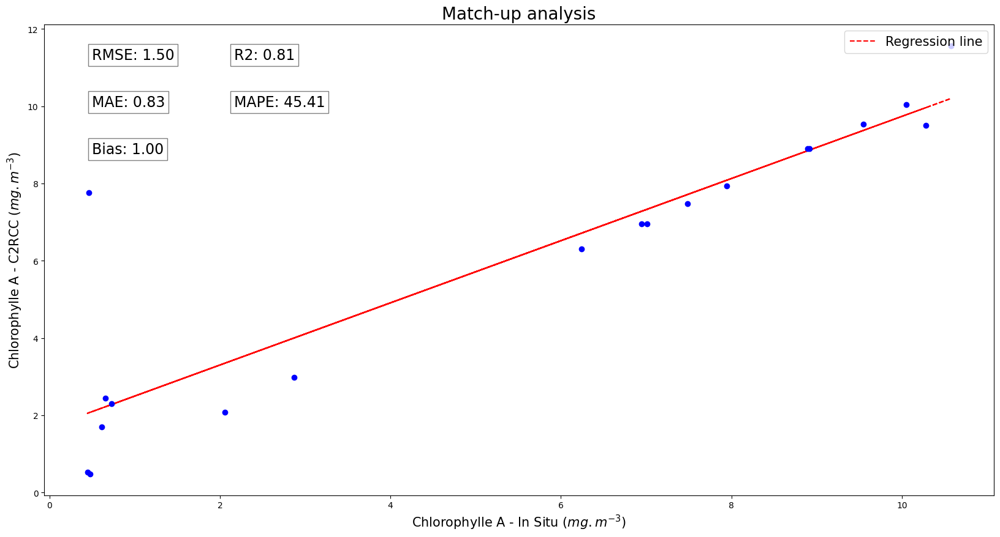

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [96]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# Drop rows that have the dates: 2022-10-22 10:50:09, 2023-01-18 11:04:01, 2023-04-08 10:56:21
dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21']
for date in dates_to_remove:
    df_c2rcc = df_c2rcc.drop(df_c2rcc[df_c2rcc['Date'] == date].index)

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean', 'Date']].dropna()
display(df_c2rcc2)
# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
# print('$$R^{2}$$:', model.score(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']]))
# print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])) ** 0.5)
# print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])))
# print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean']]) - df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100)
# print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean'], model.predict(df_c2rcc2[['conc_chl_mean']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

# Plot the graphic comparing the values of chlorophyllle A and conc_chl

# Setting index for c2rcc and df_loco if its not
if df_c2rcc.index.name != 'Date':   
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)
    
# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['chlorophylle A - Adjusted'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean3_unc = filtered_df2['conc_chl_sigma'].resample('D').mean()

    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, marker='o', label='Chlorophylle A - In Situ (Median)')
    ax1.errorbar(daily_mean2.index, daily_mean2, marker='o', label='Chlorophylle A - In situ adjusted')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (All pixels)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=17)
    ax1.set_xlabel('Date', fontsize=17)
    # Setting font size for values in axes
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods', fontsize=20)
    ax1.legend(fontsize=14)
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

# Reset index of df_c2rcc and df_loco
df_c2rcc.reset_index(inplace=True)
df_loco.reset_index(inplace=True)


Calculation for windows 5x5

,Date,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma,chlorophylle A - Adjusted
0,2022-10-07 10:49:31,11.363131,1.194454,11.394294,2.075915,10.0543,4.9180,10.05
1,2022-11-01 10:51:09,9.471119,2.557038,9.333033,4.237271,6.9454,5.4899,6.96
2,2022-11-04 11:01:29,NaN,0.000000,13.798728,2.446890,7.9442,6.1450,7.94
3,2023-02-14 10:51:41,5.278747,2.397119,4.430862,2.393104,2.8740,2.0489,2.99
4,2023-02-27 11:00:11,6.899830,2.421804,7.112814,3.282846,8.8938,5.6287,8.90
5,2023-04-03 10:56:29,13.913920,3.389864,13.319674,2.930308,10.2803,5.3384,9.50
6,2023-04-05 10:50:31,1.681173,0.369453,2.109381,1.056433,2.0556,1.7481,2.08
7,2023-05-20 10:46:29,0.809154,0.209672,0.779681,0.220284,0.6171,0.3481,1.70
8,2023-05-25 10:50:31,0.665112,0.144003,0.651485,0.120573,0.4611,0.4450,7.76
9,2023-05-30 10:46:29,6.164752,3.611279,5.942648,4.397751,7.4886,5.5569,7.48


Intercept: [2.24360448]
Coefficient: [[0.62703042]]


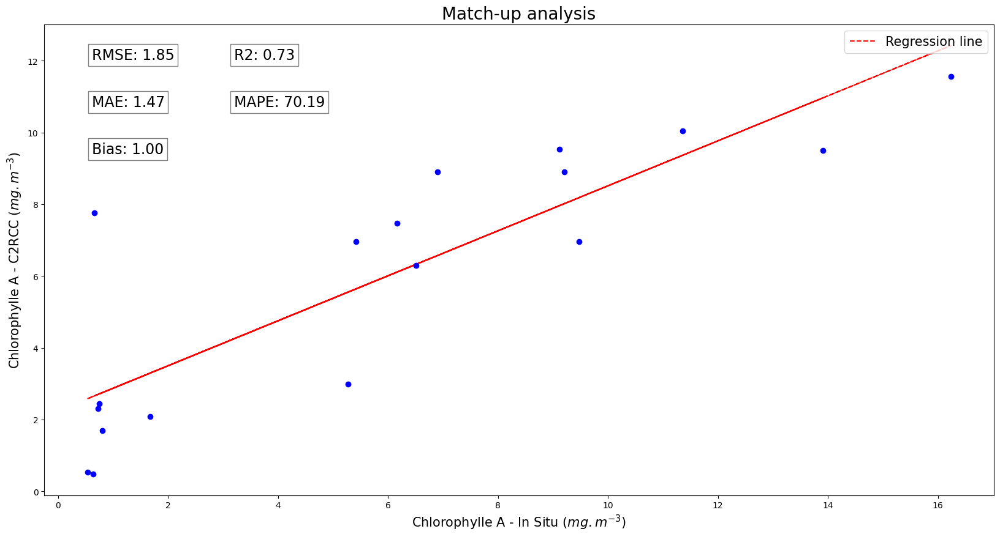

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [97]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# Drop rows that have the dates: 2022-10-22 10:50:09, 2023-01-18 11:04:01, 2023-04-08 10:56:21
dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21']
for date in dates_to_remove:
    df_c2rcc = df_c2rcc.drop(df_c2rcc[df_c2rcc['Date'] == date].index)
display(df_c2rcc)
# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_3x3']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_3x3']], df_c2rcc2[['chlorophylle A - Adjusted']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_3x3'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
# print('$$R^{2}$$:', model.score(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']]))
# print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])) ** 0.5)
# print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])))
# print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean']]) - df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100)
# print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean_windows_3x3'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean_windows_3x3'], model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_3x3"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

# Plot the graphic comparing the values of chlorophyllle A and conc_chl

# Setting index for c2rcc and df_loco if its not
if df_c2rcc.index.name != 'Date':   
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)
    
# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['chlorophylle A - Adjusted'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean_windows_3x3'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean3_unc = filtered_df2['conc_chl_sigma_windows_3x3'].resample('D').mean()

    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, marker='o', label='Chlorophylle A - In Situ (Median)')
    ax1.errorbar(daily_mean2.index, daily_mean2, marker='o', label='Chlorophylle A - In situ adjusted')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (3x3 window)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=17)
    ax1.set_xlabel('Date', fontsize=17)
    # Setting font size for values in axes
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods', fontsize=20)
    ax1.legend(fontsize=14)
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

# Reset index of df_c2rcc and df_loco
df_c2rcc.reset_index(inplace=True)
df_loco.reset_index(inplace=True)


,chlorophylle A - Adjusted,conc_chl_mean_windows_5x5
0,10.05,11.394294
1,6.96,9.333033
2,7.94,13.798728
3,2.99,4.430862
4,8.90,7.112814
5,9.50,13.319674
6,2.08,2.109381
7,1.70,0.779681
8,7.76,0.651485
9,7.48,5.942648


Intercept: [2.31736602]
Coefficient: [[0.59348406]]


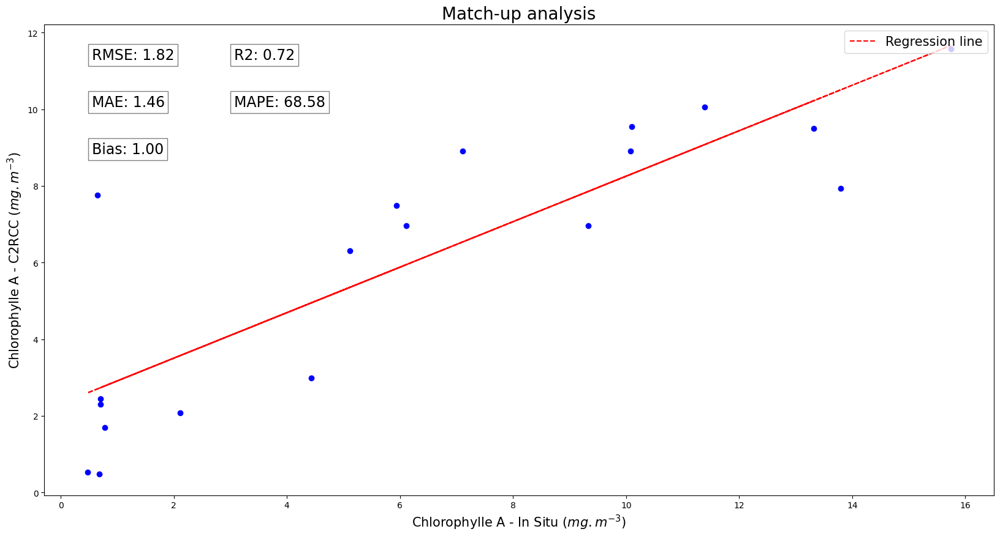

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [98]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# Drop rows that have the dates: 2022-10-22 10:50:09, 2023-01-18 11:04:01, 2023-04-08 10:56:21
dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21']
for date in dates_to_remove:
    df_c2rcc = df_c2rcc.drop(df_c2rcc[df_c2rcc['Date'] == date].index)

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_5x5']].dropna()
display(df_c2rcc2)
# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_5x5']], df_c2rcc2[['chlorophylle A - Adjusted']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_5x5'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
# print('$$R^{2}$$:', model.score(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']]))
# print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])) ** 0.5)
# print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])))
# print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean']]) - df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100)
# print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean_windows_5x5'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean_windows_5x5'], model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_5x5"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

# Plot the graphic comparing the values of chlorophyllle A and conc_chl

# Setting index for c2rcc and df_loco if its not
if df_c2rcc.index.name != 'Date':   
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)
    
# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['chlorophylle A - Adjusted'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean_windows_5x5'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean3_unc = filtered_df2['conc_chl_sigma_windows_5x5'].resample('D').mean()

    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, marker='o', label='Chlorophylle A - In Situ (Median)')
    ax1.errorbar(daily_mean2.index, daily_mean2, marker='o', label='Chlorophylle A - In situ adjusted')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (5x5 window)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=17)
    ax1.set_xlabel('Date', fontsize=17)
    # Setting font size for values in axes
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods', fontsize=20)
    ax1.legend(fontsize=14)
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

# Reset index of df_c2rcc and df_loco
df_c2rcc.reset_index(inplace=True)
df_loco.reset_index(inplace=True)


In [99]:
df_c2rcc

,Date,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma,chlorophylle A - Adjusted
0,2022-10-07 10:49:31,11.363131,1.194454,11.394294,2.075915,10.0543,4.9180,10.05
1,2022-11-01 10:51:09,9.471119,2.557038,9.333033,4.237271,6.9454,5.4899,6.96
2,2022-11-04 11:01:29,NaN,0.000000,13.798728,2.446890,7.9442,6.1450,7.94
3,2023-02-14 10:51:41,5.278747,2.397119,4.430862,2.393104,2.8740,2.0489,2.99
4,2023-02-27 11:00:11,6.899830,2.421804,7.112814,3.282846,8.8938,5.6287,8.90
5,2023-04-03 10:56:29,13.913920,3.389864,13.319674,2.930308,10.2803,5.3384,9.50
6,2023-04-05 10:50:31,1.681173,0.369453,2.109381,1.056433,2.0556,1.7481,2.08
7,2023-05-20 10:46:29,0.809154,0.209672,0.779681,0.220284,0.6171,0.3481,1.70
8,2023-05-25 10:50:31,0.665112,0.144003,0.651485,0.120573,0.4611,0.4450,7.76
9,2023-05-30 10:46:29,6.164752,3.611279,5.942648,4.397751,7.4886,5.5569,7.48


In [100]:
df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean']]

,chlorophylle A - Adjusted,conc_chl_mean
0,10.05,10.0543
1,6.96,6.9454
2,7.94,7.9442
3,2.99,2.8740
4,8.90,8.8938
5,9.50,10.2803
6,2.08,2.0556
7,1.70,0.6171
8,7.76,0.4611
9,7.48,7.4886


Alguns dos valores estão bem deslocados (22/10/2022 10:50, 18/1/2023 11:04, 8/4/2023 10:56) - Remover das imagens

#### Consolidation of all Scatter plotsfor each extraction method

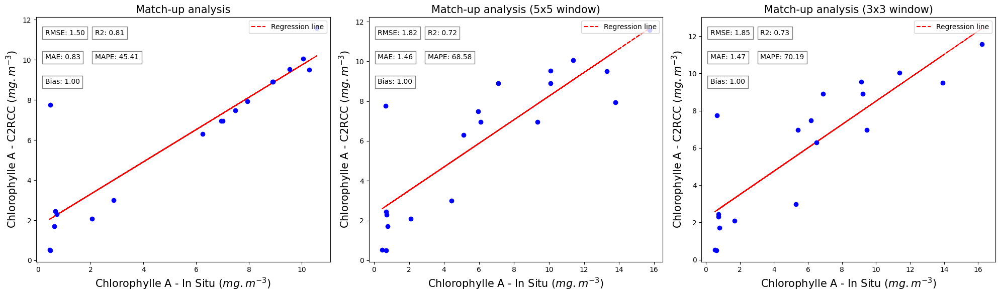

In [101]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Assuming you have df_c2rcc dataframe available

# Drop rows that have the dates: 2022-10-22 10:50:09, 2023-01-18 11:04:01, 2023-04-08 10:56:21
dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21']
for date in dates_to_remove:
    df_c2rcc = df_c2rcc.drop(df_c2rcc[df_c2rcc['Date'] == date].index)

# Plot 1
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean', 'Date']].dropna()
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']])
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])
fig, ax = plt.subplots(1, 3, figsize=(20, 6))
ax[0].errorbar(df_c2rcc2['conc_chl_mean'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax[0].plot(df_c2rcc2['conc_chl_mean'], model.predict(df_c2rcc2[['conc_chl_mean']]), ls='--', color='red', label='Regression line')
ax[0].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
ax[0].set_ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
ax[0].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])) ** 0.5:.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])):.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].set_title('Match-up analysis', fontsize=15)
ax[0].legend(fontsize=10, loc='upper right')

# Plot 2
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_5x5']].dropna()
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_5x5']], df_c2rcc2[['chlorophylle A - Adjusted']])
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_5x5'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])
ax[1].errorbar(df_c2rcc2['conc_chl_mean_windows_5x5'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax[1].plot(df_c2rcc2['conc_chl_mean_windows_5x5'], model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']]), ls='--', color='red', label='Regression line')
ax[1].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
ax[1].set_ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
ax[1].set_title('Match-up analysis (5x5 window)', fontsize=15)
ax[1].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])) ** 0.5:.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_5x5"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])):.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].legend(fontsize=10, loc='upper right')

# Plot 3
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_3x3']].dropna()
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_3x3']], df_c2rcc2[['chlorophylle A - Adjusted']])
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_3x3'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])
ax[2].errorbar(df_c2rcc2['conc_chl_mean_windows_3x3'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax[2].plot(df_c2rcc2['conc_chl_mean_windows_3x3'], model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']]), ls='--', color='red', label='Regression line')
ax[2].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
ax[2].set_ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
ax[2].set_title('Match-up analysis (3x3 window)', fontsize=15)
ax[2].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])) ** 0.5:.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_3x3"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])):.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].legend(fontsize=10, loc='upper right')

plt.tight_layout()
plt.show()


Consolidating the metrics in one table

In [102]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_initial = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl_mean',
               'conc_chl_mean_windows_3x3',
               'conc_chl_mean_windows_5x5'
               ]:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', column]].dropna()

    model.fit(df_c2rcc2[[column]], df_c2rcc2[['chlorophylle A - Adjusted']])
    
    # Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
    df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
    df_c2rcc2[f'log_metric'] = np.log10(df_c2rcc2[column])
    model2 = LinearRegression()
    model2.fit(df_c2rcc2[['log_metric']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(df_c2rcc2[[column]])

    # Cálculo do R²
    r2 = model.score(df_c2rcc2[[column]], df_c2rcc2[['chlorophylle A - Adjusted']])

    # Calculation of the Root Mean Square Error (RMSE)
    rmse = mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], predicted_values) ** 0.5

    # Calculation of the Mean Absolute Error (MAE)
    mae = mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], predicted_values)
    
    # Calculation of the Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((predicted_values- df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100

    # Calculation of the Bias
    bias = 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[[f'log_metric']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values)))

    # Append the results to the DataFrame
    results_df_initial = pd.concat([results_df_initial, pd.DataFrame([[column, r2, rmse, mae, mape,bias]], columns=['Metric', 'R²', 'RMSE', 'MAE', 'MAPE', 'Bias'])], ignore_index=True)

# Display the results DataFrame
display(results_df_initial)

,Metric,R²,RMSE,MAE,MAPE,Bias
0,conc_chl_mean,0.813126,1.502584,0.825835,45.405061,1.0
1,conc_chl_mean_windows_3x3,0.727956,1.846794,1.474195,70.186787,1.0
2,conc_chl_mean_windows_5x5,0.724541,1.824288,1.455351,68.582919,1.0


Plotting clorophyll-a concentration map based on TIF files

{Timestamp('2022-10-07 10:49:31'): 'tif_files_final/S2_MSIL1C_20221007T104931_samp_mask_C2RCC_mathbands.tif', Timestamp('2022-10-22 10:50:09'): 'tif_files_final/S2_MSIL1C_20221022T105009_samp_mask_C2RCC_mathbands.tif', Timestamp('2022-11-01 10:51:09'): 'tif_files_final/S2_MSIL1C_20221101T105109_samp_mask_C2RCC_mathbands.tif', Timestamp('2022-11-04 11:01:29'): 'tif_files_final/S2_MSIL1C_20221104T110129_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-01-18 11:04:01'): 'tif_files_final/S2_MSIL1C_20230118T110401_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-02-07 11:02:21'): 'tif_files_final/S2_MSIL1C_20230207T110221_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-02-09 10:51:09'): 'tif_files_final/S2_MSIL1C_20230209T105109_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-02-14 10:51:41'): 'tif_files_final/S2_MSIL1C_20230214T105141_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-02-27 11:00:11'): 'tif_files_final/S2_MSIL1C_20230227T110011_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-04

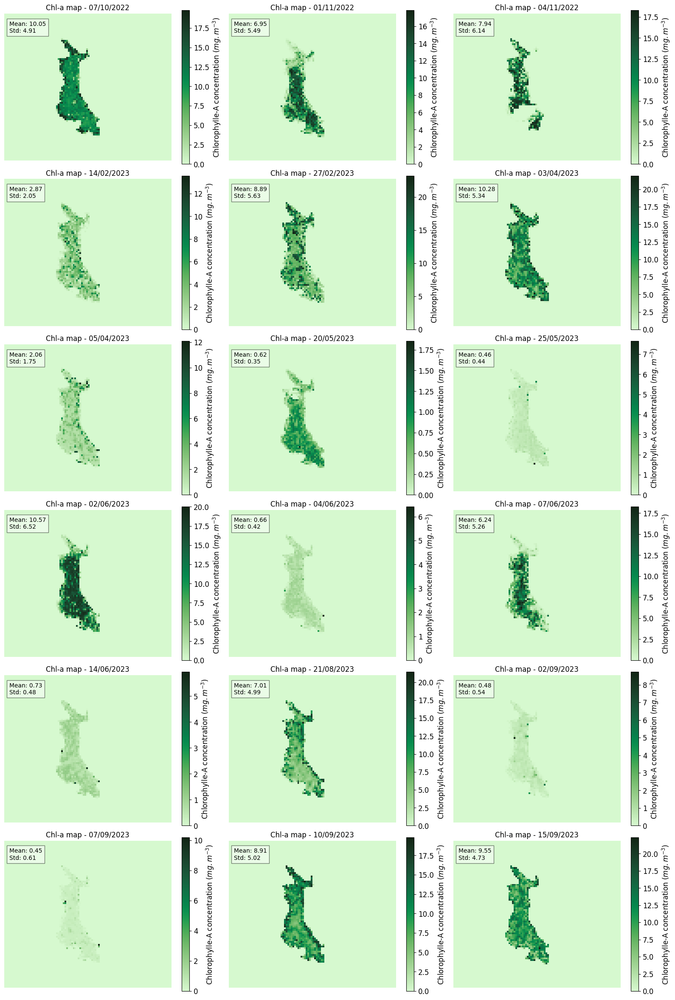

In [103]:
# Drop rows that have the dates: 2022-10-22 10:50:09, 2023-01-18 11:04:01, 2023-04-08 10:56:21
dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21', '2023-05-28 10:56:21']
# Convert dates_to_remove to datetime format
dates_to_remove = pd.to_datetime(dates_to_remove)

import os
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cmocean.cm as cmo

directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))
print(arquivos_tif_dict)

# Copy of the dictionary
arquivos_tif_dict_final = arquivos_tif_dict.copy()

# Read the band 50 of each .tif file, if the maximum value is 0, the image is removed from the dictionary
for date, arquivo_tif in arquivos_tif_dict.items():
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        conc_chl = src.read(50)

        if conc_chl.max() == 0:
            del arquivos_tif_dict_final[date]
        elif date in dates_to_remove:
            del arquivos_tif_dict_final[date]
        

# Number of columns in the plot
num_colunas = 3

num_linhas = (len(arquivos_tif_dict_final) + num_colunas-1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 5 * num_linhas))
fig.subplots_adjust(wspace=0.075, hspace=0.075,)

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict_final.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        conc_chl = src.read(50)
        #Calculate mean of conc_chl desconsidering 0 values
        conc_chl_mean = conc_chl_mean = np.mean(conc_chl[conc_chl != 0 & ~np.isnan(conc_chl)])

        if conc_chl.max() == 0:
           continue

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        # Adding a color bar
        # Reading algae colormap (https://matplotlib.org/cmocean/) and ploting it
        
        algae = cmocean.cm.algae
        cbar = fig.colorbar(axs[linha, coluna].imshow(conc_chl, cmap=algae, interpolation = 'nearest'))
        cbar.ax.tick_params(labelsize=12)
        cbar.ax.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=12)
        axs[linha, coluna].set_title(f'Chl-a map - {date.strftime("%d/%m/%Y")}')
        axs[linha, coluna].text(0.03, 0.95, f'Mean: {conc_chl_mean:.2f}\nStd: {np.std(conc_chl[conc_chl != 0 & ~np.isnan(conc_chl)]):.2f}', transform=axs[linha, coluna].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

        
# Remove all axes from the subplots
for ax in axs.flat:
    ax.axis('off')

# Exibir a figura
plt.show()

## Analysis using directly information from TIF files

In [104]:
# Load the output indices again

# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

In [105]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Initialize an empty dataframe
df_c2rcc = pd.DataFrame()
# List of bands for Reflectance TOA
band_indices_new = {'conc_chl': band_indices['conc_chl'], 'unc_chl': band_indices['unc_chl'], 'Chlorophyll index 3-bands': band_indices['3_bands_model_chl_conc'], \
                    'Empirical 2-bands - Equation 1': band_indices['empirical_2_bands_equation1'], 'Empirical 2-bands - Equation 2': band_indices['empirical_2_bands_equation2'], \
                    'Empirical 3-bands - Equation 1': band_indices['empirical_3_bands_equation1'], 'Empirical 3-bands - Equation 3': band_indices['empirical_3_bands_equation3'], \
                    'Rrs_B4': band_indices['rrs_B4'], 'Rrs_B5': band_indices['rrs_B5'], \
                    'Rrs_B6': band_indices['rrs_B6'], 'Rrs_B7': band_indices['rrs_B7'], 'iop_apig': band_indices['iop_apig'], 'unc_apig': band_indices['unc_apig']}

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]

            # Classsification of the bands with no values
            if rrs_band.size == 0:
                rrs_values.append(np.nan)
                rrs_values.append(np.nan)
                continue
            
            # Testing filtering outliers
            # Filtering outliers quartile 1 and 3
            q1 = np.percentile(rrs_band, 25)
            q3 = np.percentile(rrs_band, 75)
            iqr = q3 - q1
            rrs_band = rrs_band[(rrs_band > q1 - 1.5 * iqr) & (rrs_band < q3 + 1.5 * iqr)]
    
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)
            
            # Testing with median
            #median_rrs_band = np.median(rrs_band)
            #rrs_values.append(median_rrs_band)

            if not band_name in ['conc_chl', 'unc_chl', 'iop_apig', 'unc_apig']:
                error_rrs_band = rrs_band.std()
                rrs_values.append(error_rrs_band)

        # Create a dictionary with the date and mean values of each band
        data = {'Date': date, 'conc_chl': rrs_values[0], 'unc_chl': rrs_values[1], 'Chlorophyll index 3-bands': rrs_values[2], \
                'unc_Chlorophyll index 3-bands':rrs_values[3], \
                'Empirical 2-bands - Equation 1': rrs_values[4], 'unc_Empirical 2-bands - Equation 1': rrs_values[5],\
                'Empirical 2-bands - Equation 2': rrs_values[6], 'unc_Empirical 2-bands - Equation 2': rrs_values[7], \
                'Empirical 3-bands - Equation 1': rrs_values[8], 'unc_Empirical 3-bands - Equation 1': rrs_values[9],\
                'Empirical 3-bands - Equation 3': rrs_values[10], 'unc_Empirical 3-bands - Equation 3': rrs_values[11], \
                'Rrs_B4':  rrs_values[12], 'unc_Rrs_B4':  rrs_values[13], \
                'Rrs_B5':  rrs_values[14], 'unc_Rrs_B5':  rrs_values[15], \
                'Rrs_B6':  rrs_values[16], 'unc_Rrs_B6':  rrs_values[17], \
                'Rrs_B7':  rrs_values[18], 'unc_Rrs_B7':  rrs_values[19], \
                'iop_apig':  rrs_values[20], 'unc_apig':  rrs_values[21]
                }
        
        # Append the dictionary as a new row to the dataframe
        df_c2rcc = pd.concat([df_c2rcc, pd.DataFrame(data, index=[0])], ignore_index=True)

# Remove the images that didn't pass the quality control
df_c2rcc.dropna(inplace=True)

df_c2rcc.head()

,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,...,Rrs_B4,unc_Rrs_B4,Rrs_B5,unc_Rrs_B5,Rrs_B6,unc_Rrs_B6,Rrs_B7,unc_Rrs_B7,iop_apig,unc_apig
0,2022-10-07 10:49:31,11.214553,2.909214,12.541950,2.274960,21.271889,3.743306,13.549539,2.257267,15.727753,...,0.001109,0.000759,0.000908,0.000645,0.000312,0.000227,0.000313,0.000227,0.734191,0.122907
1,2022-10-22 10:50:09,8.938086,2.195822,9.295813,3.489191,12.535722,6.145957,8.315886,4.550666,13.465254,...,0.001702,0.001312,0.001305,0.001111,0.000406,0.000367,0.000404,0.000368,0.585942,0.089602
2,2022-11-01 10:51:09,6.945407,1.769931,8.123481,2.859937,13.878401,6.154062,8.364190,4.167254,13.062543,...,0.000222,0.000139,0.000168,0.000115,0.000054,0.000039,0.000056,0.000041,0.451235,0.071464
3,2022-11-04 11:01:29,7.944211,2.124547,10.625534,4.529142,17.908114,7.452090,11.082954,5.099267,14.501300,...,0.000336,0.000187,0.000273,0.000171,0.000092,0.000062,0.000097,0.000066,0.538964,0.090128
4,2023-01-18 11:04:01,5.876657,1.898810,17.030870,4.413559,26.496967,6.497723,17.306337,3.385897,18.053244,...,0.000549,0.000285,0.000485,0.000274,0.000176,0.000107,0.000191,0.000115,0.369674,0.075279


In [106]:
# Setting index for df_c2rcc and df_loco if its not
if df_c2rcc.index.name != 'Date':   
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)


import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]

    # Remove the dates that are bad for the analysis
    dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']
    filtered_df7 = filtered_df6[~filtered_df6.index.isin(dates_to_remove)]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()


    # Resample the data to daily frequency and calculate the mean for each day  
    daily_mean2= filtered_df7['conc_chl'].resample('D').mean().dropna()
    
    daily_mean3= filtered_df7['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean3_unc= filtered_df7['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean4= filtered_df7['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean4_unc= filtered_df7['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean5= filtered_df7['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean5_unc= filtered_df7['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean6= filtered_df7['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean6_unc= filtered_df7['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean7= filtered_df7['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean7_unc= filtered_df7['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Plotting the data with low transparency
    daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)', alpha=0.5)

    # Ploting data with bigger points
    ax.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean3_unc , ls= '', markersize = 7, marker='s', label='Analytical model (C2RCC)')
    ax.errorbar(daily_mean2.index, daily_mean3, yerr=daily_mean3_unc , ls= '', markersize = 7, marker='s', label='Chlorophyll index 3-bands')
    ax.errorbar(daily_mean2.index, daily_mean4, yerr=daily_mean4_unc , ls= '', markersize = 7, marker='s', label='Empirical 2-bands - Equation 1')
    ax.errorbar(daily_mean2.index, daily_mean5, yerr=daily_mean5_unc , ls= '', markersize = 7, marker='s', label='Empirical 2-bands - Equation 2')
    ax.errorbar(daily_mean2.index, daily_mean6, yerr=daily_mean6_unc , ls= '', markersize = 7, marker='s', label='Empirical 3-bands - Equation 1')
    ax.errorbar(daily_mean2.index, daily_mean7, yerr=daily_mean7_unc , ls= '', markersize = 7, marker='s', label='Empirical 3-bands - Equation 3')
    
    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)




DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

#### Fazendo o ajuste para as comparações de R^2 dos modelos previstos

In [107]:
from datetime import timedelta

# Remove column chlorophyllle A from c2rcc but only if exists
if 'chlorophylle A' in df_c2rcc.columns:
    df_c2rcc.drop(columns=['chlorophylle A'], inplace=True)

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)
# Remove the dates that are bad for the analysis
    
# Drop rows that have the dates: 2022-10-22 10:50:09, 2023-01-18 11:04:01, 2023-04-08 10:56:21
dates_to_remove = ['2022-10-22 10:50:09', '2023-01-18 11:04:01', '2023-04-08 10:56:21', '2023-02-07 11:02:21']
#dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']

df_c2rcc = df_c2rcc[~df_c2rcc['Date'].isin(dates_to_remove)]


# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

# Create a new column with the closest value of chlorophyllle A from in situ data

def encontrar_valor_proximo(x, df, column = 'conc_chl', janela_temporal=2):
    data_alvo = x['Date']
    valor_alvo = x[column]

    janela_superior = data_alvo + timedelta(days=janela_temporal)
    janela_inferior = data_alvo - timedelta(days=janela_temporal)

    dados_no_intervalo = df[(df['time'] >= janela_inferior) & (df['time'] <= janela_superior)]

    if not dados_no_intervalo.empty:
       
        # Calcular a diferença nos valores
        dados_no_intervalo['dif_values'] = abs(dados_no_intervalo['chlorophylle A'] - valor_alvo)
        
        # Encontrar a linha com a menor diferença nos valores
        linha_mais_proxima = dados_no_intervalo.loc[dados_no_intervalo['dif_values'].idxmin()]
        
        return linha_mais_proxima['chlorophylle A']
    else:
        return None

df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'conc_chl'), axis=1)

First test - Comparing the firsts results (All columns without 'final' in the name) with the Chlorophylle A adjusted column (Column adjusted onyl considering conc_chl)

In [108]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Create a DataFrame to store the results
results_df_final = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl',
       'Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1', 'Empirical 2-bands - Equation 2',
        'Empirical 3-bands - Equation 1', 'Empirical 3-bands - Equation 3']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    chl_column_adjusted = 'chlorophylle A - Adjusted'

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    df_c2rcc2 = df_c2rcc[[chl_column_adjusted, column]].dropna()

    model.fit(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])
    
    ## Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
    # df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted']).dropna()
    # df_c2rcc2['log_metric'] = np.log10(df_c2rcc2[column]).dropna()
    # model2 = LinearRegression()
    # model2.fit(df_c2rcc2[['log_metric']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(df_c2rcc2[[column]])

    # Cálculo do R²
    r2 = model.score(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])

    # Calculation of the Root Mean Square Error (RMSE)
    rmse = mean_squared_error(df_c2rcc2[[chl_column_adjusted]], predicted_values) ** 0.5

    # Calculation of the Mean Absolute Error (MAE)
    mae = mean_absolute_error(df_c2rcc2[[chl_column_adjusted]], predicted_values)
    
    # Calculation of the Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((predicted_values- df_c2rcc2[[chl_column_adjusted]]) / df_c2rcc2[[chl_column_adjusted]])) * 100

    # # Calculation of the Bias
    # bias = 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[[f'log_metric']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values)))

    # Append the results to the DataFrame
    results_df_final= pd.concat([results_df_final, pd.DataFrame([[column, r2, rmse, mae, mape]], columns=['Metric', 'R²', 'RMSE', 'MAE', 'MAPE'])], ignore_index=True)

# Display the results DataFrame
display(results_df_final)

,Metric,R²,RMSE,MAE,MAPE
0,conc_chl,0.822015,1.516771,0.844327,48.086632
1,Chlorophyll index 3-bands,0.594248,2.290120,1.844183,95.605087
2,Empirical 2-bands - Equation 1,0.561551,2.380605,2.020626,91.199175
3,Empirical 2-bands - Equation 2,0.603579,2.263632,1.858714,84.534891
4,Empirical 3-bands - Equation 1,0.606611,2.254960,1.821129,90.129947
5,Empirical 3-bands - Equation 3,0.586322,2.312380,1.898396,94.436507


#### Trying fitting data

Fit data with initial values (Considering only chlorophylle A adjusted by conc_chl)

In [109]:
import scipy.optimize as opt

# Define the functions for each equation
def equation_1(X, a, b):
    rrs_B4, rrs_B5, rrs_B6 = X
    return a * ((1 / rrs_B4 - 1 / rrs_B5) / (1 / rrs_B6 - 1 / rrs_B5)) + b

def equation_2(X, a,b):
    rrs_B4, rrs_B6 = X
    return a * (rrs_B6 / rrs_B4) + b

def equation_3(X, a,b,c):
    rrs_B4, rrs_B5 = X
    return a * ((rrs_B5 / rrs_B4) ** 2) + b * (rrs_B5 / rrs_B4) + c

def equation_4(X, a,b):
    rrs_B4, rrs_B5, rrs_B6 = X
    return a * ((1 / rrs_B4 - 1 / rrs_B5) * rrs_B6) + b

def equation_5(X, a,b,c):
    rrs_B4, rrs_B5, rrs_B6 = X
    return a * (((1 / rrs_B4 - 1 / rrs_B5) * rrs_B6) ** 2) + b * ((1 / rrs_B4 - 1 / rrs_B5) * rrs_B6) + c

# Define the function for equation 7
def equation_6(iop_apig, a,b):
    return a * (iop_apig ** b)

# Define the initial values for the parameters
p1= 161.24, 28.04
p2= 136.3, -16.2
p3= 25.28, 14.85, -15.18
p4= 117.42, 23.174
p5= 315.5, 215.95, 25.66
p6= 14, 0.75

# Use non-linear least squares to fit the functions to the data
popt_1, pcov_1 = opt.curve_fit(equation_1, (df_c2rcc['Rrs_B4'],df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), df_c2rcc['chlorophylle A - Adjusted'], p1)
popt_2, pcov_2 = opt.curve_fit(equation_2, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B6']) , df_c2rcc['chlorophylle A - Adjusted'], p2)
popt_3, pcov_3 = opt.curve_fit(equation_3, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5']), df_c2rcc['chlorophylle A - Adjusted'], p3)
popt_4, pcov_4 = opt.curve_fit(equation_4, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), df_c2rcc['chlorophylle A - Adjusted'], p4)
popt_5, pcov_5 = opt.curve_fit(equation_5, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), df_c2rcc['chlorophylle A - Adjusted'], p5)
popt_6, pcov_6 = opt.curve_fit(equation_6, df_c2rcc['iop_apig'], df_c2rcc['chlorophylle A - Adjusted'], p6)

# Print the parameters
print("Equation 1:", popt_1)
print("Equation 2:", popt_2)
print("Equation 3:", popt_3)
print("Equation 4:", popt_4)
print("Equation 5:", popt_5)
print("Equation 6:", popt_6)

# Print pcov
print("pcov_1:", np.linalg.cond(pcov_1), np.diag(pcov_1))
print("pcov_2:", np.linalg.cond(pcov_2), np.diag(pcov_2))
print("pcov_3:", np.linalg.cond(pcov_3), np.diag(pcov_3))
print("pcov_4:", np.linalg.cond(pcov_4), np.diag(pcov_4))
print("pcov_5:", np.linalg.cond(pcov_5), np.diag(pcov_5))
print("pcov_6:", np.linalg.cond(pcov_6), np.diag(pcov_6))


popt_2 = [54.59130268, -31.12563482]

# Create new columns with the calculated values of chlorophyllle A
df_c2rcc['Chlorophyll index 3-bands adjusted'] = equation_1((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), *popt_1)
df_c2rcc['Empirical 2-bands - Equation 1 adjusted'] = equation_2((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5']), *popt_2)
df_c2rcc['Empirical 2-bands - Equation 2 adjusted'] = equation_3((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5']), *popt_3)
df_c2rcc['Empirical 3-bands - Equation 1 adjusted'] = equation_4((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), *popt_4)
df_c2rcc['Empirical 3-bands - Equation 3 adjusted'] = equation_5((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), *popt_5)
df_c2rcc['conc_chl adjusted'] = equation_6(df_c2rcc['iop_apig'], *popt_6)




Equation 1: [114.60735688  20.90541159]
Equation 2: [54.01564322 -5.07149998]
Equation 3: [-72.55713963 130.07340136 -48.21312964]
Equation 4: [137.47587628  18.66603906]
Equation 5: [-2.29949590e+03 -2.63909430e+02  2.19828023e+00]
Equation 6: [11.38810934  0.46863526]
pcov_1: 1672.8837150864736 [457.5145161    7.98708734]
pcov_2: 420.8631330270274 [122.88433262   5.51083921]
pcov_3: 70988.02526928074 [3454.49782203 6657.48484028  776.37634643]
pcov_4: 2340.656834003779 [638.25660942   5.66679277]
pcov_5: 5508686.969702003 [1.23119976e+06 3.80480182e+04 6.78908425e+01]
pcov_6: 226.1508480152531 [1.0473411  0.01031758]


In [110]:
# Setting index for df_c2rcc and df_loco if its not
if df_c2rcc.index.name != 'Date':   
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)


import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]

    # Remove the dates that are bad for the analysis
    dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']
    filtered_df7 = filtered_df6[~filtered_df6.index.isin(dates_to_remove)]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()


    # Resample the data to daily frequency and calculate the mean for each day  
    daily_mean2= filtered_df7['conc_chl adjusted'].resample('D').mean().dropna()
    
    daily_mean3= filtered_df7['Chlorophyll index 3-bands adjusted'].resample('D').mean().dropna()
    daily_mean3_unc= filtered_df7['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean4= filtered_df7['Empirical 2-bands - Equation 1 adjusted'].resample('D').mean().dropna()
    daily_mean4_unc= filtered_df7['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean5= filtered_df7['Empirical 2-bands - Equation 2 adjusted'].resample('D').mean().dropna()
    daily_mean5_unc= filtered_df7['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean6= filtered_df7['Empirical 3-bands - Equation 1 adjusted'].resample('D').mean().dropna()
    daily_mean6_unc= filtered_df7['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean7= filtered_df7['Empirical 3-bands - Equation 3 adjusted'].resample('D').mean().dropna()
    daily_mean7_unc= filtered_df7['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Plotting the data with low transparency
    daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)', alpha=0.5)

    # Ploting data with bigger points
    ax.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean3_unc , ls= '', markersize = 7, marker='s', label='Analytical model (C2RCC)')
    ax.errorbar(daily_mean2.index, daily_mean3, yerr=daily_mean3_unc , ls= '', markersize = 7, marker='s', label='Chlorophyll index 3-bands')
    ax.errorbar(daily_mean2.index, daily_mean4, yerr=daily_mean4_unc , ls= '', markersize = 7, marker='s', label='Empirical 2-bands - Equation 1')
    ax.errorbar(daily_mean2.index, daily_mean5, yerr=daily_mean5_unc , ls= '', markersize = 7, marker='s', label='Empirical 2-bands - Equation 2')
    ax.errorbar(daily_mean2.index, daily_mean6, yerr=daily_mean6_unc , ls= '', markersize = 7, marker='s', label='Empirical 3-bands - Equation 1')
    ax.errorbar(daily_mean2.index, daily_mean7, yerr=daily_mean7_unc , ls= '', markersize = 7, marker='s', label='Empirical 3-bands - Equation 3')
    
    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets anSecond test - Comparing the firsts results (All columns without 'final' in the name) with the Chlorophylle A adjusted column for each of them (Adjusting the value according the column)d the output
display(start_date_widget, end_date_widget, output)




DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

1. Fit data with chlorophyll A adjusted by each of first bio-optical model adjustment values

2. Second test - Comparing the firsts results (All columns without 'final' in the name) with the Chlorophylle A adjusted column for each of them (Adjusting the value according the column)

In [111]:
from datetime import timedelta

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)



df_c2rcc['chlorophylle A - Adjusted conc_chl'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'conc_chl adjusted'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Chlorophyll index 3-bands'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Chlorophyll index 3-bands adjusted'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 2-bands - Equation 1'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 2-bands - Equation 1 adjusted'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 2-bands - Equation 2'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 2-bands - Equation 2 adjusted'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 3-bands - Equation 1'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 3-bands - Equation 1 adjusted'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 3-bands - Equation 3'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 3-bands - Equation 3 adjusted'), axis=1)


# display the columns chlorophyllle A and conc_chl
display(df_c2rcc[['chlorophylle A - Adjusted', 'chlorophylle A - Adjusted conc_chl', 'chlorophylle A - Adjusted Chlorophyll index 3-bands', 'chlorophylle A - Adjusted Empirical 2-bands - Equation 1', 'chlorophylle A - Adjusted Empirical 2-bands - Equation 2', 'chlorophylle A - Adjusted Empirical 3-bands - Equation 1', 'chlorophylle A - Adjusted Empirical 3-bands - Equation 3']])


,chlorophylle A - Adjusted,chlorophylle A - Adjusted conc_chl,chlorophylle A - Adjusted Chlorophyll index 3-bands,chlorophylle A - Adjusted Empirical 2-bands - Equation 1,chlorophylle A - Adjusted Empirical 2-bands - Equation 2,chlorophylle A - Adjusted Empirical 3-bands - Equation 1,chlorophylle A - Adjusted Empirical 3-bands - Equation 3
0,11.21,9.84,10.10,13.59,9.65,10.15,9.72
1,6.96,7.84,7.59,10.10,8.63,7.82,8.66
2,7.94,8.52,9.98,13.31,9.59,9.98,9.70
3,2.68,4.15,4.65,3.67,5.17,4.63,5.17
4,8.90,8.90,12.48,16.69,10.06,12.34,9.43
5,9.50,9.50,7.26,9.10,8.24,7.38,8.39
6,1.71,3.05,3.72,1.71,2.61,3.43,3.20
7,1.70,1.70,2.68,1.70,3.06,2.86,2.16
8,7.76,7.76,7.76,7.76,7.76,7.76,7.76
9,7.47,8.16,6.81,8.45,7.96,6.98,8.02


In [112]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Create a DataFrame to store the results
results_df_final = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl',
       'Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1', 'Empirical 2-bands - Equation 2',
        'Empirical 3-bands - Equation 1', 'Empirical 3-bands - Equation 3']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    chl_column_adjusted = 'chlorophylle A - Adjusted ' + column

    column = column + ' adjusted'

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    df_c2rcc2 = df_c2rcc[[chl_column_adjusted, column]].dropna()

    model.fit(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])
    
    ## Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
    # df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted']).dropna()
    # df_c2rcc2['log_metric'] = np.log10(df_c2rcc2[column]).dropna()
    # model2 = LinearRegression()
    # model2.fit(df_c2rcc2[['log_metric']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(df_c2rcc2[[column]])

    # Cálculo do R²
    r2 = model.score(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])

    # Calculation of the Root Mean Square Error (RMSE)
    rmse = mean_squared_error(df_c2rcc2[[chl_column_adjusted]], predicted_values) ** 0.5

    # Calculation of the Mean Absolute Error (MAE)
    mae = mean_absolute_error(df_c2rcc2[[chl_column_adjusted]], predicted_values)
    
    # Calculation of the Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((predicted_values- df_c2rcc2[[chl_column_adjusted]]) / df_c2rcc2[[chl_column_adjusted]])) * 100

    # # Calculation of the Bias
    # bias = 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[[f'log_metric']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values)))

    # Append the results to the DataFrame
    results_df_final= pd.concat([results_df_final, pd.DataFrame([[column, r2, rmse, mae, mape]], columns=['Metric', 'R²', 'RMSE', 'MAE', 'MAPE'])], ignore_index=True)

# Display the results DataFrame
display(results_df_final)

,Metric,R²,RMSE,MAE,MAPE
0,conc_chl adjusted,0.819058,1.333797,0.675006,21.941850
1,Chlorophyll index 3-bands adjusted,0.861196,1.037493,0.529163,10.684193
2,Empirical 2-bands - Equation 1 adjusted,0.863920,1.708207,0.973734,53.413278
3,Empirical 2-bands - Equation 2 adjusted,0.770873,1.318324,0.707360,17.593781
4,Empirical 3-bands - Equation 1 adjusted,0.848147,1.085895,0.559278,11.344608
5,Empirical 3-bands - Equation 3 adjusted,0.814277,1.245249,0.645928,15.844210


In [113]:
import scipy.optimize as opt

# Define the functions for each equation
def equation_1(X, a, b):
    rrs_B4, rrs_B5, rrs_B6 = X
    return a * ((1 / rrs_B4 - 1 / rrs_B5) / (1 / rrs_B6 - 1 / rrs_B5)) + b

def equation_2(X, a,b):
    rrs_B4, rrs_B6 = X
    return a * (rrs_B6 / rrs_B4) + b

def equation_3(X, a,b,c):
    rrs_B4, rrs_B5 = X
    return a * ((rrs_B5 / rrs_B4) ** 2) + b * (rrs_B5 / rrs_B4) + c

def equation_4(X, a,b):
    rrs_B4, rrs_B5, rrs_B6 = X
    return a * ((1 / rrs_B4 - 1 / rrs_B5) * rrs_B6) + b

def equation_5(X, a,b,c):
    rrs_B4, rrs_B5, rrs_B6 = X
    return a * (((1 / rrs_B4 - 1 / rrs_B5) * rrs_B6) ** 2) + b * ((1 / rrs_B4 - 1 / rrs_B5) * rrs_B6) + c

# Define the function for equation 7
def equation_6(iop_apig, a,b):
    return a * (iop_apig ** b)

# Define the initial values for the parameters
p1= popt_1[0], popt_1[1]
p2= popt_2[0], popt_2[1]
p3= popt_3[0], popt_3[1], popt_3[2]
p4= popt_4[0], popt_4[1]
p5= popt_5[0], popt_5[1], popt_5[2]
p6= popt_6[0], popt_6[1]

# Use non-linear least squares to fit the functions to the data
popt_1, pcov_1 = opt.curve_fit(equation_1, (df_c2rcc['Rrs_B4'],df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), df_c2rcc['chlorophylle A - Adjusted Chlorophyll index 3-bands'], p1)
popt_2, pcov_2 = opt.curve_fit(equation_2, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B6']) , df_c2rcc['chlorophylle A - Adjusted Empirical 2-bands - Equation 1'], p2)
popt_3, pcov_3 = opt.curve_fit(equation_3, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5']), df_c2rcc['chlorophylle A - Adjusted Empirical 2-bands - Equation 2'], p3)
popt_4, pcov_4 = opt.curve_fit(equation_4, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), df_c2rcc['chlorophylle A - Adjusted Empirical 3-bands - Equation 1'], p4)
popt_5, pcov_5 = opt.curve_fit(equation_5, (df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), df_c2rcc['chlorophylle A - Adjusted Empirical 3-bands - Equation 3'], p5)
popt_6, pcov_6 = opt.curve_fit(equation_6, df_c2rcc['iop_apig'], df_c2rcc['chlorophylle A - Adjusted conc_chl'], p6)

# Print the parameters
print("Equation 1:", popt_1)
print("Equation 2:", popt_2)
print("Equation 3:", popt_3)
print("Equation 4:", popt_4)
print("Equation 5:", popt_5)
print("Equation 6:", popt_6)

# Print pcov
print("pcov_1:", np.linalg.cond(pcov_1), np.diag(pcov_1))
print("pcov_2:", np.linalg.cond(pcov_2), np.diag(pcov_2))
print("pcov_3:", np.linalg.cond(pcov_3), np.diag(pcov_3))
print("pcov_4:", np.linalg.cond(pcov_4), np.diag(pcov_4))
print("pcov_5:", np.linalg.cond(pcov_5), np.diag(pcov_5))
print("pcov_6:", np.linalg.cond(pcov_6), np.diag(pcov_6))

# Need to adjust the scale of p_opt2 (see in the plot without this for understand)
popt_2 = [85.36018452, -55.68011838]

# Create new columns with the calculated values of chlorophyllle A
df_c2rcc['Chlorophyll index 3-bands adjusted final'] = equation_1((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), *popt_1)
df_c2rcc['Empirical 2-bands - Equation 1 adjusted final'] = equation_2((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5']), *popt_2)
df_c2rcc['Empirical 2-bands - Equation 2 adjusted final'] = equation_3((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5']), *popt_3)
df_c2rcc['Empirical 3-bands - Equation 1 adjusted final'] = equation_4((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), *popt_4)
df_c2rcc['Empirical 3-bands - Equation 3 adjusted final'] = equation_5((df_c2rcc['Rrs_B4'], df_c2rcc['Rrs_B5'], df_c2rcc['Rrs_B6']), *popt_5)
df_c2rcc['conc_chl adjusted final'] = equation_6(df_c2rcc['iop_apig'], *popt_6)




Equation 1: [103.94669572  19.78937792]
Equation 2: [ 85.36504045 -10.69427457]
Equation 3: [-24.15464553  58.28404867 -21.92868647]
Equation 4: [123.11977644  17.63209693]
Equation 5: [-1710.08862627  -178.45132003     5.16439874]
Equation 6: [10.43695005  0.33848762]
pcov_1: 1672.8837031091448 [102.44096837   1.78836939]
pcov_2: 420.8631357085211 [59.92248185  2.68726824]
pcov_3: 70988.08531461359 [1361.1781249  2623.2532734   305.91609813]
pcov_4: 2340.656858871935 [159.64600593   1.41742492]
pcov_5: 5508687.230182754 [5.08731131e+05 1.57214218e+04 2.80524608e+01]
pcov_6: 272.62488045679817 [0.4822512  0.00333629]


In [114]:
print(popt_1,'\n', popt_2,'\n', popt_3,'\n', popt_4,'\n', popt_5,'\n', popt_6)

[103.94669572  19.78937792] 
 [85.36018452, -55.68011838] 
 [-24.15464553  58.28404867 -21.92868647] 
 [123.11977644  17.63209693] 
 [-1710.08862627  -178.45132003     5.16439874] 
 [10.43695005  0.33848762]


In [115]:
# Setting index for df_c2rcc and df_loco if its not
if df_c2rcc.index.name != 'Date':   
    df_c2rcc.set_index('Date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)


import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-10-1'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]

    # Remove the dates that are bad for the analysis
    dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']
    filtered_df7 = filtered_df6[~filtered_df6.index.isin(dates_to_remove)]
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()


    # Resample the data to daily frequency and calculate the mean for each day  
    daily_mean2= filtered_df7['conc_chl adjusted'].resample('D').mean().dropna()
    
    daily_mean3= filtered_df7['Chlorophyll index 3-bands adjusted final'].resample('D').mean().dropna()
    daily_mean3_unc= filtered_df7['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean4= filtered_df7['Empirical 2-bands - Equation 1 adjusted final'].resample('D').mean().dropna()
    daily_mean4_unc= filtered_df7['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean5= filtered_df7['Empirical 2-bands - Equation 2 adjusted final'].resample('D').mean().dropna()
    daily_mean5_unc= filtered_df7['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean6= filtered_df7['Empirical 3-bands - Equation 1 adjusted final'].resample('D').mean().dropna()
    daily_mean6_unc= filtered_df7['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean7= filtered_df7['Empirical 3-bands - Equation 3 adjusted final'].resample('D').mean().dropna()
    daily_mean7_unc= filtered_df7['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Plotting the data with low transparency
    # daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)', alpha=0.5)
    ax.errorbar(daily_mean1.index, daily_mean1, yerr=daily_mean1_unc/2 , markersize = 7, marker='o', label='Chlorophylle A - In Situ (Median)', alpha=0.5)

    # Ploting data with bigger points
    ax.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean3_unc , ls= '', markersize = 7, marker='s', label='Analytical model (C2RCC)')
    ax.errorbar(daily_mean2.index, daily_mean3, yerr=daily_mean3_unc , ls= '', markersize = 7, marker='s', label='Chlorophyll index 3-bands final')
    ax.errorbar(daily_mean2.index, daily_mean4, yerr=daily_mean4_unc , ls= '', markersize = 7, marker='s', label='Empirical 2-bands - Equation 1 final')
    ax.errorbar(daily_mean2.index, daily_mean5, yerr=daily_mean5_unc , ls= '', markersize = 7, marker='s', label='Empirical 2-bands - Equation 2 final')
    ax.errorbar(daily_mean2.index, daily_mean6, yerr=daily_mean6_unc , ls= '', markersize = 7, marker='s', label='Empirical 3-bands - Equation 1 final')
    ax.errorbar(daily_mean2.index, daily_mean7, yerr=daily_mean7_unc , ls= '', markersize = 7, marker='s', label='Empirical 3-bands - Equation 3 final')
    
    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)




DatePicker(value=Timestamp('2022-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

Final test - Adjusting again the parameters considering the Chlorophyll A adjusted for each equation

In [116]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Create a DataFrame to store the results
results_df_final = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl',
       'Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1', 'Empirical 2-bands - Equation 2',
        'Empirical 3-bands - Equation 1', 'Empirical 3-bands - Equation 3']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    chl_column_adjusted = 'chlorophylle A - Adjusted ' + column

    column = column + ' adjusted final'

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    df_c2rcc2 = df_c2rcc[[chl_column_adjusted, column]].dropna()

    model.fit(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])
    
    ## Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
    # df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted']).dropna()
    # df_c2rcc2['log_metric'] = np.log10(df_c2rcc2[column]).dropna()
    # model2 = LinearRegression()
    # model2.fit(df_c2rcc2[['log_metric']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(df_c2rcc2[[column]])

    # Cálculo do R²
    r2 = model.score(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])

    # Calculation of the Root Mean Square Error (RMSE)
    rmse = mean_squared_error(df_c2rcc2[[chl_column_adjusted]], predicted_values) ** 0.5

    # Calculation of the Mean Absolute Error (MAE)
    mae = mean_absolute_error(df_c2rcc2[[chl_column_adjusted]], predicted_values)
    
    # Calculation of the Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((predicted_values- df_c2rcc2[[chl_column_adjusted]]) / df_c2rcc2[[chl_column_adjusted]])) * 100

    # # Calculation of the Bias
    # bias = 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[[f'log_metric']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values)))

    # Append the results to the DataFrame
    results_df_final= pd.concat([results_df_final, pd.DataFrame([[column, r2, rmse, mae, mape]], columns=['Metric', 'R²', 'RMSE', 'MAE', 'MAPE'])], ignore_index=True)

# Display the results DataFrame
display(results_df_final)

,Metric,R²,RMSE,MAE,MAPE
0,conc_chl adjusted final,0.808970,1.370474,0.731878,22.182176
1,Chlorophyll index 3-bands adjusted final,0.861196,1.037493,0.529163,10.684193
2,Empirical 2-bands - Equation 1 adjusted final,0.863920,1.708207,0.973734,53.413278
3,Empirical 2-bands - Equation 2 adjusted final,0.783702,1.280885,0.718159,18.595028
4,Empirical 3-bands - Equation 1 adjusted final,0.848147,1.085895,0.559278,11.344608
5,Empirical 3-bands - Equation 3 adjusted final,0.816066,1.239238,0.643879,16.017359


See in a table each data

In [117]:
df_c2rcc.columns

Index(['conc_chl', 'unc_chl', 'Chlorophyll index 3-bands',
       'unc_Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1',
       'unc_Empirical 2-bands - Equation 1', 'Empirical 2-bands - Equation 2',
       'unc_Empirical 2-bands - Equation 2', 'Empirical 3-bands - Equation 1',
       'unc_Empirical 3-bands - Equation 1', 'Empirical 3-bands - Equation 3',
       'unc_Empirical 3-bands - Equation 3', 'Rrs_B4', 'unc_Rrs_B4', 'Rrs_B5',
       'unc_Rrs_B5', 'Rrs_B6', 'unc_Rrs_B6', 'Rrs_B7', 'unc_Rrs_B7',
       'iop_apig', 'unc_apig', 'chlorophylle A - Adjusted',
       'Chlorophyll index 3-bands adjusted',
       'Empirical 2-bands - Equation 1 adjusted',
       'Empirical 2-bands - Equation 2 adjusted',
       'Empirical 3-bands - Equation 1 adjusted',
       'Empirical 3-bands - Equation 3 adjusted', 'conc_chl adjusted',
       'chlorophylle A - Adjusted conc_chl',
       'chlorophylle A - Adjusted Chlorophyll index 3-bands',
       'chlorophylle A - Adjusted Empirical 2-ban

Plotting each scatter plot

0 0
0 1
1 0
1 1
2 0
2 1


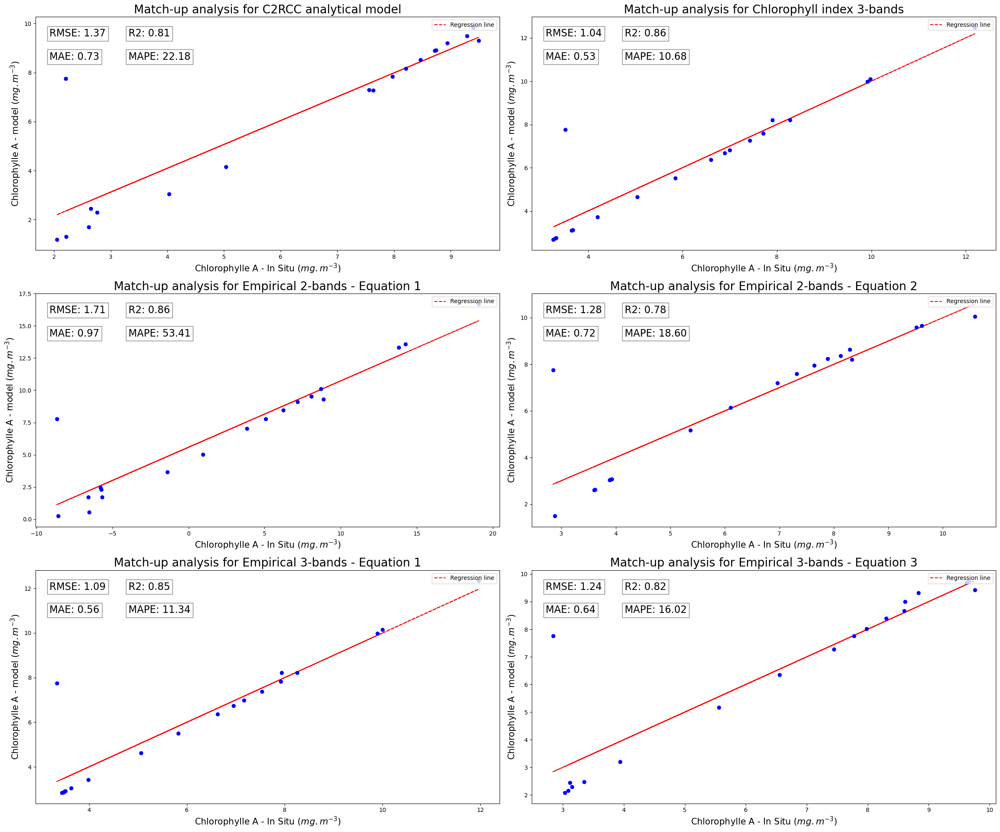

In [118]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Transforming the index of df_c2rcc into 'Date' again
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

fig, ax = plt.subplots(3, 2, figsize=(24,20))

i, j = 0, 0

# Loop through the columns and perform the analysis
for column in [ 'conc_chl', 'Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1', 'Empirical 2-bands - Equation 2',
        'Empirical 3-bands - Equation 1', 'Empirical 3-bands - Equation 3']:
    j = j + 1
    if j == 3:
        j = 1
        i = i + 1
    print(i, j-1)
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    chl_column_adjusted = 'chlorophylle A - Adjusted ' + column

    column = column + ' adjusted final'

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    df_c2rcc2 = df_c2rcc[[chl_column_adjusted, column, 'Date']].dropna()
    model.fit(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])
    
    # # Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
    # log_chla = 'log_' + chl_column_adjusted
    # log_column = 'log_' + column

    # df_c2rcc2[log_chla] = np.log10(df_c2rcc2[chl_column_adjusted]).dropna()
    # df_c2rcc2[log_column] = np.log10(df_c2rcc2[column]).dropna()
    # model2 = LinearRegression()
    # model2.fit(df_c2rcc2[[log_column]], df_c2rcc2[[log_chla]])


    ax[i, j -1].errorbar(df_c2rcc2[column], df_c2rcc2[chl_column_adjusted], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
    ax[i, j -1].plot(df_c2rcc2[column], model.predict(df_c2rcc2[[column]]), ls='--', color='red', label='Regression line')
    ax[i, j -1].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
    ax[i, j -1].set_ylabel('Chlorophylle A - model ($mg.m^{-3}$)', fontsize=15)
    ax[i, j -1].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[[chl_column_adjusted]], model.predict(df_c2rcc2[[column]])) ** 0.5:.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    ax[i, j -1].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[[column]],df_c2rcc2[[chl_column_adjusted]]):.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    ax[i, j -1].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[[chl_column_adjusted]], model.predict(df_c2rcc2[[column]])):.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    ax[i, j -1].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[[column]]) - df_c2rcc2[[chl_column_adjusted]]) / df_c2rcc2[[chl_column_adjusted]])) * 100:.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    #ax[i, j -1].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[[log_column]]).T - df_c2rcc2[[log_chla]].values))):.2f}', transform=ax[i, j -1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    if column == 'conc_chl adjusted final':
        ax[i, j -1].set_title('Match-up analysis for C2RCC analytical model', fontsize=20)
    else:
        ax[i, j -1].set_title('Match-up analysis for ' + column.replace(' adjusted final', ''), fontsize=20)
    ax[i, j -1].legend(fontsize=10, loc='upper right')

# hide axis without values
#ax[2, 1].axis('off')

plt.tight_layout()
plt.show()



In an attempt to improve the results, we can remove the images that had more noise in the visible spectrum:

Removal of the following dates: 04/11/2022, 08/04/2023, 28/05/2023, 02/06/2023, in addition to the date 09/02/2023 already removed by quality validation.

### Windows results - Ajustar depois com os dados obtidos pelo SNAP - TBD

In [119]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Initialize an empty dataframe
df_windows_results = pd.DataFrame()
# List of bands for Reflectance TOA
band_indices_new = {'conc_chl': band_indices['conc_chl'], 'unc_chl': band_indices['unc_chl'], 'Chlorophyll index 3-bands': band_indices['3_bands_model_chl_conc'], \
                    'Empirical 2-bands - Equation 1': band_indices['empirical_2_bands_equation1'], 'Empirical 2-bands - Equation 2': band_indices['empirical_2_bands_equation2'], \
                    'Empirical 3-bands - Equation 1': band_indices['empirical_3_bands_equation1'], 'Empirical 3-bands - Equation 3': band_indices['empirical_3_bands_equation3'], \
                    'Rrs_B4': band_indices['rrs_B4'], 'Rrs_B5': band_indices['rrs_B5'], \
                    'Rrs_B6': band_indices['rrs_B6'], 'Rrs_B7': band_indices['rrs_B7']}

# Define the sensor location
sensor_latitude = 48.7744444
sensor_longitude = 2.4525

# Define the window size
window_size_3x3 = 3
window_size_5x5 = 5

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]

            # Classification of the bands with no values
            if rrs_band.size == 0:
                rrs_values.append(np.nan)
                rrs_values.append(np.nan)
                continue

            # Calculate the row and column indices of the sensor location
            col, row = src.index(sensor_longitude, sensor_latitude)

            # Extract the window around the sensor location
            window_3x3 = rrs_band[max(0, row - window_size_3x3):min(len(rrs_band), row + window_size_3x3 + 1)]
            window_5x5 = rrs_band[max(0, row - window_size_5x5):min(len(rrs_band), row + window_size_5x5 + 1)]

            # Calculate the mean values of the windows
            mean_rrs_band_3x3 = window_3x3.mean()
            mean_rrs_band_5x5 = window_5x5.mean()

            rrs_values.append(mean_rrs_band_3x3)
            rrs_values.append(mean_rrs_band_5x5)

            if not band_name in ['conc_chl', 'unc_chl']:
                error_rrs_band_3x3 = window_3x3.std()
                error_rrs_band_5x5 = window_5x5.std()

                rrs_values.append(error_rrs_band_3x3)
                rrs_values.append(error_rrs_band_5x5)

        # Create a dictionary with the date and mean values of each band
        data = {'Date': date, 'conc_chl': rrs_values[0], 'unc_chl': rrs_values[1], 'Chlorophyll index 3-bands': rrs_values[2], \
                'unc_Chlorophyll index 3-bands':rrs_values[3], \
                'Empirical 2-bands - Equation 1': rrs_values[4], 'unc_Empirical 2-bands - Equation 1': rrs_values[5],\
                'Empirical 2-bands - Equation 2': rrs_values[6], 'unc_Empirical 2-bands - Equation 2': rrs_values[7], \
                'Empirical 3-bands - Equation 1': rrs_values[8], 'unc_Empirical 3-bands - Equation 1': rrs_values[9],\
                'Empirical 3-bands - Equation 3': rrs_values[10], 'unc_Empirical 3-bands - Equation 3': rrs_values[11], \
                'Rrs_B4':  rrs_values[12], 'Rrs_B5':  rrs_values[13], \
                'Rrs_B6':  rrs_values[14], 'Rrs_B7':  rrs_values[15]
                }

        # Append the dictionary as a new row to the dataframe
        df_windows_results = pd.concat([df_windows_results, pd.DataFrame(data, index=[0])], ignore_index=True)

# Remove the images that didn't pass the quality control
df_windows_results.dropna(inplace=True)

# Print the dataframe
display(df_windows_results)


C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\3784230140.py:65: RuntimeWarning: Mean of empty slice.
  mean_rrs_band_3x3 = window_3x3.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\3784230140.py:66: RuntimeWarning: Mean of empty slice.
  mean_rrs_band_5x5 = window_5x5.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered

,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,Empirical 3-bands - Equation 3,unc_Empirical 3-bands - Equation 3,Rrs_B4,Rrs_B5,Rrs_B6,Rrs_B7


### Comparing the results of Copernicus Browser Scripts using L1C images

In [120]:
import pandas as pd

consolitaded_df = pd.read_csv('C:/Users/arthu/Documents/GitHub/remote_sensing_lac_creteil/images_scripts_test/results_final_bands.csv')
consolitaded_df['date'] = pd.to_datetime(consolitaded_df['date'], format = '%Y-%m-%d')

#Set the 'time' column as the index
consolitaded_df.set_index('date', inplace=True)

# Merge with in loco data

consolitaded_df = pd.merge_asof(consolitaded_df, df_loco, right_index = True, left_index = True,  direction='nearest')

consolitaded_df.drop(columns=['Unnamed: 2'], inplace=True)
consolitaded_df.dropna(inplace=True)

# drop row max_error = 0
consolitaded_df = consolitaded_df[consolitaded_df['max_error'] != 0]

display(consolitaded_df)

,name,Band,average,max_error,maximum,median,minimum,p80_threshold,p85_threshold,p90_threshold,sigma,total,chlorophylle A,date,upper_bound,lower_bound
date,,,,,,,,,,,,,,,,
2022-10-07,world,NDCIv,4.2149,0.0326,5.0689,4.3181,-27.5770,4.4813,4.5140,4.5792,1.3213,2573.0,13.81,2022-10-07,13.990038,6.444962
2022-10-22,world,NDCIv,5.3311,0.0309,6.8928,5.3474,-24.0150,5.5329,5.5947,5.6565,0.7462,2575.0,5.70,2022-10-22,6.415490,3.824510
2022-11-01,world,NDCIv,2.4357,0.0389,4.5806,2.6767,-34.2735,3.1819,3.2984,3.4150,2.0557,2694.0,3.13,2022-11-01,5.812332,2.010168
2022-11-04,world,NDCIv,3.1827,0.0592,4.5652,3.3821,-54.5891,3.8553,3.9736,4.0919,1.9165,1308.0,6.14,2022-11-04,13.873211,5.334289
2023-01-18,world,NDCIv,2.1816,0.0408,4.9125,2.4261,-35.8482,3.1598,3.3636,3.5266,2.3364,2972.0,0.40,2023-01-18,0.951871,-0.231871
2023-02-07,world,NDCIv,1.7387,0.0467,4.9316,2.0336,-41.8101,2.8282,2.9684,3.2489,2.7374,2991.0,1.34,2023-02-07,2.469237,0.428263
2023-02-14,world,NDCIv,2.2270,0.0301,4.8071,2.4312,-25.2678,2.9725,3.1530,3.3334,1.9438,2977.0,5.32,2023-02-14,12.288084,-1.635584
2023-02-27,world,NDCIv,2.4194,0.0774,5.2490,2.9255,-72.2009,3.5451,3.6225,3.7774,3.6874,2941.0,10.55,2023-02-27,16.768985,5.168515
2023-04-03,world,NDCIv,2.2807,0.0667,4.7394,2.7396,-61.9215,3.2729,3.4062,3.6062,3.2354,2835.0,8.24,2023-04-02,13.946706,-0.461706


In [121]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_browser = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['average']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(consolitaded_df[['chlorophylle A']], consolitaded_df[column])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(consolitaded_df[['chlorophylle A']])

    # Cálculo do R²
    r2 = r2_score(consolitaded_df[column], predicted_values)

    # Cálculo do Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((consolitaded_df[column] - predicted_values) / consolitaded_df[column])) * 100

    # Cálculo do Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(consolitaded_df[column], predicted_values))

    # Cálculo do Mean Relative Difference (MRD)
    mrd = np.mean((consolitaded_df[column] - predicted_values) / consolitaded_df[column]) * 100

    # Append the results to the DataFrame
    results_df_browser = pd.concat([results_df_browser, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_browser)

,Metric,R²,MAPD,RMSD,MRD
0,average,0.098694,25.287709,0.824961,-8.908499


In [122]:
df_c2rcc

,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,...,chlorophylle A - Adjusted Empirical 2-bands - Equation 1,chlorophylle A - Adjusted Empirical 2-bands - Equation 2,chlorophylle A - Adjusted Empirical 3-bands - Equation 1,chlorophylle A - Adjusted Empirical 3-bands - Equation 3,Chlorophyll index 3-bands adjusted final,Empirical 2-bands - Equation 1 adjusted final,Empirical 2-bands - Equation 2 adjusted final,Empirical 3-bands - Equation 1 adjusted final,Empirical 3-bands - Equation 3 adjusted final,conc_chl adjusted final
0,2022-10-07 10:49:31,11.214553,2.909214,12.541950,2.274960,21.271889,3.743306,13.549539,2.257267,15.727753,...,13.59,9.65,10.15,9.72,9.978311,14.256784,9.609854,9.998818,9.654840,9.400514
1,2022-11-01 10:51:09,6.945407,1.769931,8.123481,2.859937,13.878401,6.154062,8.364190,4.167254,13.062543,...,10.10,8.63,7.82,8.66,7.706778,8.709534,8.292370,7.917348,8.598103,7.972477
2,2022-11-04 11:01:29,7.944211,2.124547,10.625534,4.529142,17.908114,7.452090,11.082954,5.099267,14.501300,...,13.31,9.59,9.98,9.70,9.914538,13.820977,9.513734,9.893014,9.624706,8.466619
3,2023-02-14 10:51:41,2.704644,0.637065,4.488944,0.904367,7.185325,3.851117,3.703949,2.587115,10.810676,...,3.67,5.17,4.63,5.17,5.043782,-1.392982,5.368884,5.064263,5.561351,5.030495
4,2023-02-27 11:00:11,8.893848,2.619902,16.219002,2.989211,26.171633,5.061547,16.785671,2.599536,17.659647,...,16.69,10.06,12.34,9.43,12.188626,19.051364,10.584202,11.960190,9.756045,8.718827
5,2023-04-03 10:56:29,10.280292,2.385181,8.353990,2.861850,13.344301,5.783123,8.277141,3.999756,13.134103,...,9.10,8.24,7.38,8.39,7.426344,7.157485,7.887228,7.538529,8.300638,9.285639
6,2023-04-05 10:50:31,1.645776,0.375393,3.790232,0.570619,3.790078,1.334164,1.421857,1.001643,10.068135,...,1.71,2.61,3.43,3.20,4.202548,-6.580425,3.604796,3.986936,3.936978,4.026507
7,2023-05-20 10:46:29,0.615553,0.211626,2.424787,0.316716,5.925028,0.708104,2.162088,0.383385,9.655871,...,1.70,3.06,2.86,2.16,3.255963,-5.681244,3.923362,3.482042,3.085587,2.613717
8,2023-05-25 10:50:31,0.426471,0.131139,2.858655,0.342188,3.124923,0.831078,0.650347,0.388405,9.566809,...,7.76,7.76,7.76,7.76,3.519837,-8.656827,2.848677,3.341795,2.838884,2.207379
9,2023-05-28 10:56:21,7.488639,1.893396,8.001108,3.204985,13.308736,5.759728,8.209415,4.243298,13.029528,...,8.45,7.96,6.98,8.02,7.000891,6.233162,7.638358,7.170486,7.980624,8.207258


In [123]:
# Indexing the if it is not
if consolitaded_df.index.name != 'date':
    consolitaded_df.set_index('date', inplace=True)
if df_loco.index.name != 'time':
    df_loco.set_index('time', inplace=True)
if df_datalab.index.name != 'Date':
    df_datalab.set_index('Date', inplace=True)
if df_c2rcc.index.name != 'Date':
    df_c2rcc.set_index('Date', inplace=True)


import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    filtered_df7 = consolitaded_df.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean12= filtered_df7['average'].resample('D').mean().dropna()
    daily_mean12_unc = filtered_df7['sigma'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))


    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, ls = '--', marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean12.index, daily_mean12, yerr=daily_mean12_unc, ls= '-.', marker='o', label='NDVIv')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

### Trying to analyse L2A images plotted like Copernicus Browser - TBD

### Trying to adjust the parameters of the models

In [124]:
"""

Models of calculation of chlorophyll concentration

1. 3_bands_model_chl_conc - 161.24*((1/ rrs_B4 - 1/ rrs_B5)/(1/ rrs_B6 - 1/ rrs_B5))+28.04
3. empirical_2_bands_equation1 - 136.3 * (rrs_B6/rrs_B4) - 16.2
4. empirical_2_bands_equation2 - 25.28*((rrs_B5/rrs_B4)*(rrs_B5/rrs_B4)) + 14.85 * (rrs_B5/rrs_B4) - 15.18
5. empirical_3_bands_equation1 - 117.42 * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + 23.174
6. empirical_3_bands_equation3 - 315.5 * (((1/rrs_B4 - 1/rrs_B5))*rrs_B6)*(((1/rrs_B4 - 1/rrs_B5))*rrs_B6)+ 215.95 * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + 25.66

"""

# Ordena ambos os DataFrames pelo índice (que agora é a coluna de datas 'time')
df_loco = df_loco.sort_index()
df_c2rcc = df_c2rcc.sort_index()

# Utiliza o método merge_asof para encontrar as datas mais próximas
result = pd.merge_asof(df_c2rcc, df_loco, right_index = True, left_index = True,  direction='nearest')


from scipy.optimize import curve_fit
import numpy as np

# Assuming df_c2rcc and df_loco DataFrames have been merged into 'result'

# Define the models
def three_bands_model_chl_conc(rrs_B4, rrs_B5, rrs_B6, a = 1, b = 1):
    return a * ((1/ rrs_B4 - 1/ rrs_B5)/(1/ rrs_B6 - 1/ rrs_B5)) + b

def empirical_2_bands_equation1(rrs_B6, rrs_B4, a, b):
    return a * (rrs_B6/rrs_B4) - b

def empirical_2_bands_equation2(rrs_B5, rrs_B4, a, b, c):
    return a*((rrs_B5/rrs_B4)*(rrs_B5/rrs_B4)) + b * (rrs_B5/rrs_B4) - c

def empirical_3_bands_equation1(rrs_B4, rrs_B5, rrs_B6, a, b):
    return a * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + b

def empirical_3_bands_equation3(rrs_B4, rrs_B5, rrs_B6, a, b, c):
    return a * (((1/rrs_B4 - 1/rrs_B5))*rrs_B6)*(((1/rrs_B4 - 1/rrs_B5))*rrs_B6)+ b * ((1/rrs_B4 - 1/rrs_B5))*rrs_B6 + c

# Extract data
rrs_B4 = result['Rrs_B4']
rrs_B5 = result['Rrs_B5']
rrs_B6 = result['Rrs_B6']
chlorophylle_A = result['chlorophylle A']

# Fit the models
popt_three_bands, _ = curve_fit(three_bands_model_chl_conc, (rrs_B4, rrs_B5, rrs_B6), chlorophylle_A)
popt_empirical_2_bands_1, _ = curve_fit(empirical_2_bands_equation1, (rrs_B6, rrs_B4), chlorophylle_A)
popt_empirical_2_bands_2, _ = curve_fit(empirical_2_bands_equation2, (rrs_B5, rrs_B4), chlorophylle_A)
popt_empirical_3_bands_1, _ = curve_fit(empirical_3_bands_equation1, (rrs_B4, rrs_B5, rrs_B6), chlorophylle_A)
popt_empirical_3_bands_3, _ = curve_fit(empirical_3_bands_equation3, (rrs_B4, rrs_B5, rrs_B6), chlorophylle_A)

# Print the optimized parameters
print('Optimized parameters for three_bands_model_chl_conc:', popt_three_bands)
print('Optimized parameters for empirical_2_bands_equation1:', popt_empirical_2_bands_1)
print('Optimized parameters for empirical_2_bands_equation2:', popt_empirical_2_bands_2)
print('Optimized parameters for empirical_3_bands_equation1:', popt_empirical_3_bands_1)
print('Optimized parameters for empirical_3_bands_equation3:', popt_empirical_3_bands_3)

C:\Users\arthu\AppData\Local\Temp\ipykernel_34772\2742609251.py:28: RuntimeWarning: divide by zero encountered in divide
  return a * ((1/ rrs_B4 - 1/ rrs_B5)/(1/ rrs_B6 - 1/ rrs_B5)) + b


TypeError: Improper input: func input vector length N=4 must not exceed func output vector length M=3

Plot graphics of each model

In [ ]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1',
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))




###  Plot the C2RCC data after processing

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean7= filtered_df6['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean7_unc = filtered_df6['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()

    daily_mean8= filtered_df6['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean8_unc = filtered_df6['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean9= filtered_df6['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean9_unc = filtered_df6['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()

    daily_mean10= filtered_df6['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean10_unc = filtered_df6['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean11= filtered_df6['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean11_unc = filtered_df6['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean_secchi = filtered_df2['Secchi_m'].resample('D').mean()
    

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', alpha = 0.5, label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, ls = '', markersize = 7, marker='s', label='Chlorophylle A - C2RCC') # Or ls ='--' for dashed lines
    
    #ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    # ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    # ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    # ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    # ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()

    
    # Create a second y-axis for Secchi depth
    ax2 = ax.twinx()
    
    # Plot Secchi depth on the second y-axis
    ax2.bar(daily_mean_secchi.index, daily_mean_secchi, alpha=0.2, color='blue', label='Secchi depth')
    ax2.set_ylabel('Secchi depth (m)')
    ax2.set_ylim(0, 6)
    ax2.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

### Análise do mês de maio a julho

In [ ]:
daily_mean6 = df_c2rcc['conc_chl'].resample('D').mean().dropna()
daily_mean6

Date
2022-10-07    12.639685
2022-10-22    11.492252
2022-11-01     8.879948
2022-11-04     9.507055
2023-01-18     7.477668
2023-02-07    16.193861
2023-02-14     2.370013
2023-02-27    11.119368
2023-04-03    14.697074
2023-04-05     1.058552
2023-04-08    11.075877
2023-05-03     2.716580
2023-05-20     0.293951
2023-05-25     0.176158
2023-05-28     9.378928
2023-05-30     0.147862
2023-06-02    14.173524
2023-06-04     0.312143
2023-06-07     7.381867
2023-06-14     0.347141
2023-08-21     8.389313
2023-09-02     0.176476
2023-09-07     0.143695
2023-09-10    12.387043
2023-09-15    13.140839
2023-09-25    23.802292
Name: conc_chl, dtype: float32

C:\Users\arthu\AppData\Local\Temp\ipykernel_16692\3224583764.py:49: RuntimeWarning: Mean of empty slice.
  mean_rrs_band = rrs_band.mean()
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\arthu\anaconda3\envs\remote_sensing\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


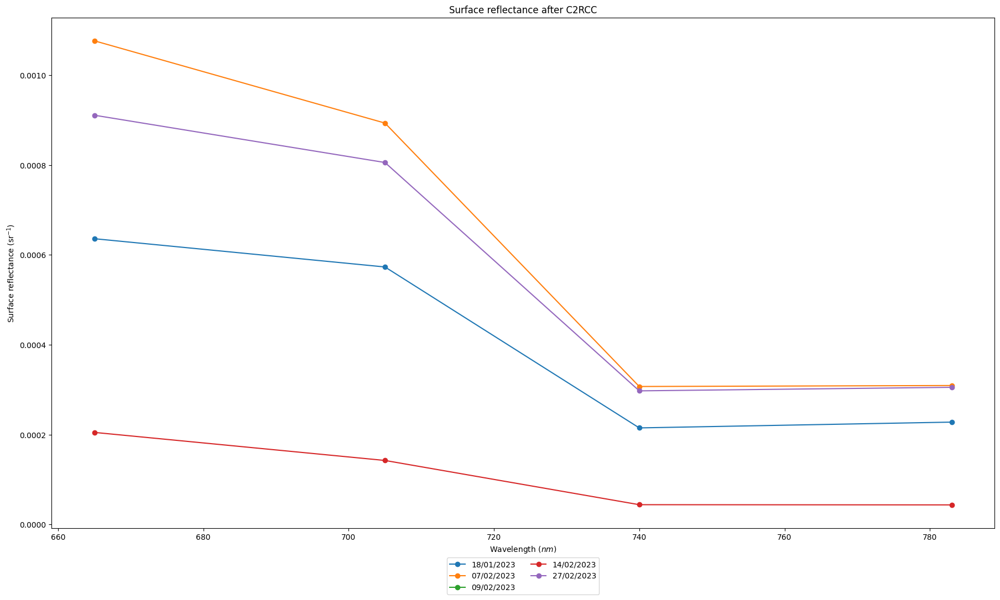

In [ ]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'tif_files_final/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

arquivos_tif_dict = {date: arquivo_tif for date, arquivo_tif in arquivos_tif_dict.items() if date.year == 2023 and date.month in [1,2]}

# Configuring the single plot
fig, ax = plt.subplots(figsize=(22, 12))

# List of bands for Reflectance TOA
band_indices_new = { 'B4': band_indices['rrs_B4'], 'B5': band_indices['rrs_B5'], \
                 'B6': band_indices['rrs_B6'], 'B7': band_indices['rrs_B7']}

# Initialize lists to store all reflectance values
all_rrs_values = []

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:

        wavelengths = [ 665, 705, 740, 783]
        std_rrs_band = []
        rrs_values = []

        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]
            mean_rrs_band = rrs_band.mean()
            std_rrs_band.append(rrs_band.std())  # Calculate the standard deviation
            rrs_values.append(mean_rrs_band)

        # Plot the standard deviation as error bars
        ax.errorbar(wavelengths, rrs_values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Wavelength ($nm$)')
ax.set_ylabel('Surface reflectance (sr$^{-1}$)')
ax.set_title('Surface reflectance after C2RCC')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(arquivos_tif_dict)/2)

# Display the figure
plt.show()

#### Explicações para a remoção das imagens:

25/05/2023 e 30/05/2023 tiverem efeitos que afetaram o sensor de captar corretamente os níveis de reflectância reais, sendo então excluidas da análise como outliers.

----- Obs: 22/10/2022 podemos ver que o lago ele está com grande presença de clorofila, que pode ser atestado no teste local, porém o sensor, como está mais na superfície, pega um valor subestimado.

As imagens do dia 07/02/2023, 03/04/2023, 08/04/2023 e 21/08/2023 devem ser excluidas devido ao ruído gerado pelo espalhamento.

As imagens no mês de fevereiro já sendo excluida a imagem 09/02/2023 pelos filtros do IdePix


In [ ]:
df_c2rcc

,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,Empirical 3-bands - Equation 3,unc_Empirical 3-bands - Equation 3,Rrs_B4,Rrs_B5,Rrs_B6,Rrs_B7,chlorophylle A
Date,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,12.639685,2.240423,11.419353,3.900975,21.211096,4.916850,13.505252,2.961804,15.665322,1.657321,12.171855,3.456735,0.001123,0.000791,0.000925,0.000679,9.83
2022-10-22 10:50:09,11.492252,1.654627,9.328502,3.633259,12.450475,6.345382,8.282675,4.702090,13.470339,2.233648,10.078918,3.117704,0.001719,0.001363,0.001302,0.001128,4.67
2022-11-01 10:51:09,8.879948,1.305668,7.995057,2.943731,13.525928,6.521349,8.125024,4.390642,12.974231,1.940370,9.352077,2.634387,0.000224,0.000153,0.000169,0.000126,4.13
2022-11-04 11:01:29,9.507055,1.485688,10.088268,4.665496,16.756624,8.203710,10.287064,5.565898,14.150022,2.783343,11.104476,3.949646,0.000314,0.000203,0.000254,0.000184,11.13
2023-01-18 11:04:01,7.477668,1.399750,16.576378,5.128100,26.537342,6.926394,17.269571,3.624295,18.017925,2.283104,16.733086,3.850916,0.000534,0.000318,0.000474,0.000307,0.15
2023-02-07 11:02:21,16.193861,2.275436,12.733088,3.144849,21.000359,5.140545,13.782638,3.048241,15.777712,1.778634,13.265790,2.699080,0.001059,0.000639,0.000877,0.000560,0.79
2023-02-14 10:51:41,2.370013,0.320445,4.629401,1.181029,6.803401,4.246818,3.521503,2.907795,10.810039,0.996923,6.410118,1.250267,0.000148,0.000085,0.000094,0.000060,5.36
2023-02-27 11:00:11,11.119368,1.873018,16.276752,3.196611,26.359098,5.251359,16.807116,2.795807,17.675684,1.666802,16.252468,2.659519,0.000862,0.000557,0.000759,0.000513,7.82
2023-04-03 10:56:29,14.697074,1.949671,8.704678,3.146333,13.688530,6.596522,8.541276,4.513333,13.319324,2.039306,9.830250,2.810930,0.000671,0.000435,0.000499,0.000345,6.32


In [ ]:
# Define the dates to be removed
dates_to_remove = ['2023-02-07 11:02:21', '2023-04-03 10:56:29', '2023-04-08 10:56:21', '2023-05-25 10:50:31', '2023-05-30 10:46:29', '2023-08-21 10:56:29']


# Tranform the dates to datetime format
dates_to_remove = [pd.to_datetime(date) for date in dates_to_remove]

# Remove the specified days from the dataframe, independent of the time
df_c2rcc_filtered = df_c2rcc[~df_c2rcc.index.isin(dates_to_remove)]

# Create a new DataFrame to store the results
results_df_filtered = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl','Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1',
               'Empirical 2-bands - Equation 2', 'Empirical 3-bands - Equation 1',
               'Empirical 3-bands - Equation 3']:
    
    # Create the linear regression model
    model = LinearRegression()

    # Fit the model using the 'chlorophylle A' column as the independent variable and the current column as the dependent variable
    model.fit(df_c2rcc_filtered[['chlorophylle A']], df_c2rcc_filtered[column])

    # Predict the values using the model
    predicted_values = model.predict(df_c2rcc_filtered[['chlorophylle A']])

    # Calculate R-squared
    r2 = r2_score(df_c2rcc_filtered[column], predicted_values)

    # Calculate Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((df_c2rcc_filtered[column] - predicted_values) / df_c2rcc_filtered[column])) * 100

    # Calculate Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(df_c2rcc_filtered[column], predicted_values))

    # Calculate Mean Relative Difference (MRD)
    mrd = np.mean((df_c2rcc_filtered[column] - predicted_values) / df_c2rcc_filtered[column]) * 100

    # Append the results to the DataFrame
    results_df_filtered = pd.concat([results_df_filtered, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_filtered)


,Metric,R²,MAPD,RMSD,MRD
0,conc_chl,0.228721,571.717736,5.697138,-542.555299
1,Chlorophyll index 3-bands,0.220273,49.728485,3.332213,-26.148756
2,Empirical 2-bands - Equation 1,0.199683,58.621964,5.839324,-33.050607
3,Empirical 2-bands - Equation 2,0.223511,104.171849,4.089622,-74.669384
4,Empirical 3-bands - Equation 1,0.224034,13.913410,2.064665,-2.599928
5,Empirical 3-bands - Equation 3,0.213900,28.884193,2.801079,-10.290123


In [ ]:
df_c2rcc_filtered

,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,Empirical 3-bands - Equation 3,unc_Empirical 3-bands - Equation 3,Rrs_B4,Rrs_B5,Rrs_B6,Rrs_B7,chlorophylle A
Date,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,12.639685,2.240423,11.419353,3.900975,21.211096,4.916850,13.505252,2.961804,15.665322,1.657321,12.171855,3.456735,0.001123,0.000791,0.000925,0.000679,9.83
2022-11-01 10:51:09,8.879948,1.305668,7.995057,2.943731,13.525928,6.521349,8.125024,4.390642,12.974231,1.940370,9.352077,2.634387,0.000224,0.000153,0.000169,0.000126,4.13
2022-11-04 11:01:29,9.507055,1.485688,10.088268,4.665496,16.756624,8.203710,10.287064,5.565898,14.150022,2.783343,11.104476,3.949646,0.000314,0.000203,0.000254,0.000184,11.13
2023-02-14 10:51:41,2.370013,0.320445,4.629401,1.181029,6.803401,4.246818,3.521503,2.907795,10.810039,0.996923,6.410118,1.250267,0.000148,0.000085,0.000094,0.000060,5.36
2023-02-27 11:00:11,11.119368,1.873018,16.276752,3.196611,26.359098,5.251359,16.807116,2.795807,17.675684,1.666802,16.252468,2.659519,0.000862,0.000557,0.000759,0.000513,7.82
2023-04-05 10:50:31,1.058552,0.141695,3.834559,0.643721,3.846885,1.444464,1.464515,1.068633,10.095224,0.393986,5.519803,0.486014,0.000122,0.000050,0.000070,0.000031,2.72
2023-05-03 10:56:19,2.716580,0.373806,4.840333,0.829959,5.311004,0.642236,2.801417,0.713207,10.691142,0.513575,6.257698,0.661365,0.000294,0.000139,0.000178,0.000087,8.38
2023-05-20 10:46:29,0.293951,0.065208,2.554587,0.464870,5.610142,1.106451,2.088366,0.484549,9.694802,0.136949,5.027952,0.167434,0.000267,0.000131,0.000156,0.000078,4.11
2023-05-28 10:56:21,9.378928,1.368726,7.932487,3.620760,12.732944,6.258388,7.786974,4.583531,12.877385,2.233876,9.237032,3.047184,0.000296,0.000154,0.000218,0.000130,8.09


### Read data from SNAP statistics and analyse the C2RCC adjusted

In [ ]:
results_initial = dataframes['results_1']


#Convert the 'time' column to datetime
results_initial['Date'] = pd.to_datetime(results_initial['Date'])

#Set the 'time' column as the index
results_initial.set_index('Date', inplace=True)

# Display the dataframe
results_initial

,windows5x5_kd_z90max_mean,windows5x5_3_bands_model_chl_conc_mean,windows5x5_empirical_2_bands_equation1_mean,windows5x5_empirical_2_bands_equation2_mean,windows5x5_empirical_3_bands_equation1_mean,windows5x5_empirical_3_bands_equation3_mean,windows5x5_conc_chl_mean,windows3x3_3_bands_model_chl_conc_mean,windows3x3_empirical_2_bands_equation1_mean,windows3x3_empirical_2_bands_equation2_mean,...,3_bands_model_chl_conc,empirical_2_bands_equation1,empirical_2_bands_equation2,empirical_3_bands_equation1,empirical_3_bands_equation3,conc_chl,Chl (C2RCC Adjusted All Pix),Chla without Oz (C2RCC),Chl (C2X-COMPLEX-Nets All Pix),Chl in loco REAL
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,1.206965,12.847613,22.033922,13.875828,15.885210,13.487042,14.481098,12.829199,22.074558,13.861522,...,12.8323,21.6171,13.6341,15.8202,13.4365,14.9729,8.391555,15.1681,101.7633,8.51000
2022-10-22 10:50:09,4.918787,6.138085,8.341957,4.913167,11.634617,7.542959,4.760775,5.016477,6.885368,3.693143,...,9.7746,13.1632,8.8410,13.7407,10.4544,11.8520,7.332913,12.5772,76.8449,4.71375
2022-11-01 10:51:09,2.298946,8.155785,14.995783,9.021809,13.208697,9.649691,7.826222,7.404113,14.266416,8.376152,...,8.8066,15.6070,9.5131,13.5431,10.1320,10.6505,6.890000,12.8600,49.6400,4.30500
2022-11-04 11:01:29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,12.6166,21.6068,13.4892,15.7100,13.3089,11.4901,7.200000,13.5800,76.0600,9.72500
2023-01-18 11:04:01,0.811337,18.216927,29.984156,18.477802,18.669619,17.925224,6.110522,17.345070,28.695522,17.750868,...,17.5928,27.7247,17.6331,18.2696,17.2904,8.3385,5.990000,12.8700,32.7400,0.22000
2023-02-07 11:02:21,1.181622,12.577086,21.283950,13.366044,15.681020,13.224243,19.587223,13.341068,23.119913,14.499175,...,13.0090,21.0181,13.4839,15.8450,13.4893,17.3361,9.130000,16.4000,22.2200,1.14000
2023-02-14 10:51:41,3.099400,6.484349,11.885307,6.636937,12.125772,8.209411,4.240960,6.714031,12.254485,6.850038,...,5.3036,8.2816,4.4165,11.2335,7.0179,3.3422,3.530000,4.6700,44.7800,4.71625
2023-02-27 11:00:11,0.857706,18.584301,29.296751,18.689785,18.844263,18.151117,8.166728,18.648410,29.907589,18.831007,...,16.6592,27.1199,17.0995,17.8589,16.5868,13.0126,7.740000,16.4100,46.4200,7.93250
2023-04-03 10:56:29,1.425691,12.075270,20.713058,13.092575,15.448322,12.836637,21.963083,12.677329,21.928070,13.775692,...,9.3848,15.2483,9.6068,13.7630,10.4519,16.6730,8.930000,15.9500,20.3800,8.58000


In [ ]:
results_initial.columns

Index(['windows5x5_kd_z90max_mean', 'windows5x5_3_bands_model_chl_conc_mean',
       'windows5x5_empirical_2_bands_equation1_mean',
       'windows5x5_empirical_2_bands_equation2_mean',
       'windows5x5_empirical_3_bands_equation1_mean',
       'windows5x5_empirical_3_bands_equation3_mean',
       'windows5x5_conc_chl_mean', 'windows3x3_3_bands_model_chl_conc_mean',
       'windows3x3_empirical_2_bands_equation1_mean',
       'windows3x3_empirical_2_bands_equation2_mean',
       'windows3x3_empirical_3_bands_equation1_mean',
       'windows3x3_empirical_3_bands_equation3_mean',
       'windows3x3_conc_chl_mean', '3_bands_model_chl_conc',
       'empirical_2_bands_equation1', 'empirical_2_bands_equation2',
       'empirical_3_bands_equation1', 'empirical_3_bands_equation3',
       'conc_chl', 'Chl (C2RCC Adjusted All Pix)', 'Chla without Oz (C2RCC)',
       'Chl (C2X-COMPLEX-Nets All Pix)', 'Chl in loco REAL'],
      dtype='object')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    filtered_df7 = results_initial.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()
    

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean12= filtered_df7['Chl (C2RCC Adjusted All Pix)'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, ls = '', marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean12.index, daily_mean12, marker='o', ls='', label='Chlorophylle A - C2RCC Adjusted')

    #ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    # ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    # ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    # ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    # ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

And the results of the statistics

In [ ]:
# Merge with in loco data
results_initial = pd.merge_asof(results_initial, df_loco, right_index = True, left_index = True,  direction='nearest')

In [ ]:
results_initial = results_initial.drop(pd.to_datetime('2022-11-04 11:01:29'))
results_initial = results_initial.drop(pd.to_datetime('2023-06-02 10:56:29'))
results_initial

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_initial = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['windows5x5_3_bands_model_chl_conc_mean',
       'windows5x5_empirical_2_bands_equation1_mean',
       'windows5x5_empirical_2_bands_equation2_mean',
       'windows5x5_empirical_3_bands_equation1_mean',
       'windows5x5_empirical_3_bands_equation3_mean',
       'windows5x5_conc_chl_mean', 'windows3x3_3_bands_model_chl_conc_mean',
       'windows3x3_empirical_2_bands_equation1_mean',
       'windows3x3_empirical_2_bands_equation2_mean',
       'windows3x3_empirical_3_bands_equation1_mean',
       'windows3x3_empirical_3_bands_equation3_mean',
       'windows3x3_conc_chl_mean', '3_bands_model_chl_conc',
       'empirical_2_bands_equation1', 'empirical_2_bands_equation2',
       'empirical_3_bands_equation1', 'empirical_3_bands_equation3',
       'conc_chl', 'Chl (C2RCC Adjusted All Pix)']:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(results_initial[['chlorophylle A']], results_initial[column])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(results_initial[['chlorophylle A']])

    # Cálculo do R²
    r2 = r2_score(results_initial[column], predicted_values)

    # Cálculo do Mean Absolute Percentage Difference (MAPD)
    mapd = np.mean(np.abs((results_initial[column] - predicted_values) / results_initial[column])) * 100

    # Cálculo do Root Mean Square Deviation (RMSD)
    rmsd = np.sqrt(mean_squared_error(results_initial[column], predicted_values))

    # Cálculo do Mean Relative Difference (MRD)
    mrd = np.mean((results_initial[column] - predicted_values) / results_initial[column]) * 100

    # Append the results to the DataFrame
    results_df_initial = pd.concat([results_df_initial, pd.DataFrame([[column, r2, mapd, rmsd, mrd]], columns=['Metric', 'R²', 'MAPD', 'RMSD', 'MRD'])], ignore_index=True)

# Display the results DataFrame
display(results_df_initial)

,Metric,R²,MAPD,RMSD,MRD
0,windows5x5_3_bands_model_chl_conc_mean,0.006807,65.571367,4.569175,-40.671603
1,windows5x5_empirical_2_bands_equation1_mean,0.006949,87.243799,7.985842,-58.900688
2,windows5x5_empirical_2_bands_equation2_mean,0.011280,184.919666,5.418393,-153.704561
3,windows5x5_empirical_3_bands_equation1_mean,0.008996,17.509842,2.732461,-4.285664
4,windows5x5_empirical_3_bands_equation3_mean,0.006578,38.205803,3.870962,-17.301035
5,windows5x5_conc_chl_mean,0.033148,747.982603,7.789042,-717.570160
6,windows3x3_3_bands_model_chl_conc_mean,0.005303,64.887569,4.552919,-39.459510
7,windows3x3_empirical_2_bands_equation1_mean,0.006652,99.336945,8.204180,-69.558397
8,windows3x3_empirical_2_bands_equation2_mean,0.010033,253.236588,5.539842,-220.485067
9,windows3x3_empirical_3_bands_equation1_mean,0.007553,17.945496,2.750475,-4.361262


Plot all windows 5x5 algoritms vs chl_inloco

### Bio-optical models plotted after C2RCC

In [ ]:
# Comparing to mean

import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean7= filtered_df6['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean7_unc = filtered_df6['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()

    daily_mean8= filtered_df6['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean8_unc = filtered_df6['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean9= filtered_df6['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean9_unc = filtered_df6['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()

    daily_mean10= filtered_df6['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean10_unc = filtered_df6['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean11= filtered_df6['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean11_unc = filtered_df6['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    #daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [ ]:
# Comparing to mean

import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean7= filtered_df6['Chlorophyll index 3-bands'].resample('D').mean().dropna()
    daily_mean7_unc = filtered_df6['unc_Chlorophyll index 3-bands'].resample('D').mean().dropna()

    daily_mean8= filtered_df6['Empirical 2-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean8_unc = filtered_df6['unc_Empirical 2-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean9= filtered_df6['Empirical 2-bands - Equation 2'].resample('D').mean().dropna()
    daily_mean9_unc = filtered_df6['unc_Empirical 2-bands - Equation 2'].resample('D').mean().dropna()

    daily_mean10= filtered_df6['Empirical 3-bands - Equation 1'].resample('D').mean().dropna()
    daily_mean10_unc = filtered_df6['unc_Empirical 3-bands - Equation 1'].resample('D').mean().dropna()

    daily_mean11= filtered_df6['Empirical 3-bands - Equation 3'].resample('D').mean().dropna()
    daily_mean11_unc = filtered_df6['unc_Empirical 3-bands - Equation 3'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))

    # Hidden the other plots
    #daily_mean1.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Mean)')
    #daily_mean3.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo all depths')
    #daily_mean5.plot(kind='line', marker='o', label='Chlorophylle A - Vimeo between 1 and 2 meters depths')

    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')
    daily_mean2.plot(kind='line', marker='o', label='Chlorophylle A - Laboratory')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Chlorophylle A - C2RCC')
    # ax.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Chlorophylle A - Chlorophyll index 3-bands')
    # ax.errorbar(daily_mean8.index, daily_mean8, yerr=daily_mean8_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 1')
    # ax.errorbar(daily_mean9.index, daily_mean9, yerr=daily_mean9_unc, marker='o', label='Chlorophylle A - Empirical 2-bands - Equation 2')
    # ax.errorbar(daily_mean10.index, daily_mean10, yerr=daily_mean10_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 1')
    # ax.errorbar(daily_mean11.index, daily_mean11, yerr=daily_mean11_unc, marker='o', label='Chlorophylle A - Empirical 3-bands - Equation 3')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

In [ ]:
# Plot the graph
fig, ax = plt.subplots(figsize=(50, 20))

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    # Get the date and mean values of each band
    date = row['Date']
    band_values = row.drop('Date')
    
    # Plot the band values
    ax.plot(band_values.index, band_values.values, marker='o', label=f'{date.strftime("%d/%m/%Y")}')

# Set x-axis and y-axis labels
ax.set_xlabel('Band')
ax.set_ylabel('Mean Value')
ax.set_title('Mean Value of Each Band')

# Place the legend below the plot
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(df))

# Display the figure
plt.show()

In [ ]:
results_initial = dataframes['results_1']


#Convert the 'time' column to datetime
results_initial['Date'] = pd.to_datetime(results_initial['Date'])

#Set the 'time' column as the index
results_initial.set_index('Date', inplace=True)

# Display the dataframe
results_initial

,windows5x5_kd_z90max_mean,windows5x5_3_bands_model_chl_conc_mean,windows5x5_empirical_2_bands_equation1_mean,windows5x5_empirical_2_bands_equation2_mean,windows5x5_empirical_3_bands_equation1_mean,windows5x5_empirical_3_bands_equation3_mean,windows5x5_conc_chl_mean,windows3x3_3_bands_model_chl_conc_mean,windows3x3_empirical_2_bands_equation1_mean,windows3x3_empirical_2_bands_equation2_mean,...,3_bands_model_chl_conc,empirical_2_bands_equation1,empirical_2_bands_equation2,empirical_3_bands_equation1,empirical_3_bands_equation3,conc_chl,Chl (C2RCC Adjusted All Pix),Chla without Oz (C2RCC),Chl (C2X-COMPLEX-Nets All Pix),Chl in loco REAL
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-07 10:49:31,1.206965,12.847613,22.033922,13.875828,15.885210,13.487042,14.481098,12.829199,22.074558,13.861522,...,12.8323,21.6171,13.6341,15.8202,13.4365,14.9729,8.391555,15.1681,101.7633,8.51000
2022-10-22 10:50:09,4.918787,6.138085,8.341957,4.913167,11.634617,7.542959,4.760775,5.016477,6.885368,3.693143,...,9.7746,13.1632,8.8410,13.7407,10.4544,11.8520,7.332913,12.5772,76.8449,4.71375
2022-11-01 10:51:09,2.298946,8.155785,14.995783,9.021809,13.208697,9.649691,7.826222,7.404113,14.266416,8.376152,...,8.8066,15.6070,9.5131,13.5431,10.1320,10.6505,6.890000,12.8600,49.6400,4.30500
2022-11-04 11:01:29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,12.6166,21.6068,13.4892,15.7100,13.3089,11.4901,7.200000,13.5800,76.0600,9.72500
2023-01-18 11:04:01,0.811337,18.216927,29.984156,18.477802,18.669619,17.925224,6.110522,17.345070,28.695522,17.750868,...,17.5928,27.7247,17.6331,18.2696,17.2904,8.3385,5.990000,12.8700,32.7400,0.22000
2023-02-07 11:02:21,1.181622,12.577086,21.283950,13.366044,15.681020,13.224243,19.587223,13.341068,23.119913,14.499175,...,13.0090,21.0181,13.4839,15.8450,13.4893,17.3361,9.130000,16.4000,22.2200,1.14000
2023-02-14 10:51:41,3.099400,6.484349,11.885307,6.636937,12.125772,8.209411,4.240960,6.714031,12.254485,6.850038,...,5.3036,8.2816,4.4165,11.2335,7.0179,3.3422,3.530000,4.6700,44.7800,4.71625
2023-02-27 11:00:11,0.857706,18.584301,29.296751,18.689785,18.844263,18.151117,8.166728,18.648410,29.907589,18.831007,...,16.6592,27.1199,17.0995,17.8589,16.5868,13.0126,7.740000,16.4100,46.4200,7.93250
2023-04-03 10:56:29,1.425691,12.075270,20.713058,13.092575,15.448322,12.836637,21.963083,12.677329,21.928070,13.775692,...,9.3848,15.2483,9.6068,13.7630,10.4519,16.6730,8.930000,15.9500,20.3800,8.58000


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Suponha que 'df' seja o seu DataFrame contendo os dados de clorofila

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2022-09-30'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2023-10-30'))

# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_datalab.loc[start_date:end_date]
    filtered_df3 = df_vimeo.loc[start_date:end_date]
    filtered_df5 = depth_between_1_and_2.loc[start_date:end_date]
    filtered_df6 = df_c2rcc.loc[start_date:end_date]
    filtered_df7 = consolitaded_df.loc[start_date:end_date]
    
    
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean4 = filtered_df['chlorophylle A'].resample('D').median()
    daily_mean2 = filtered_df2['Chla Conc'].resample('D').mean()
    daily_mean3 = filtered_df3['totChl'].resample('D').mean()
    daily_mean5 = filtered_df5['totChl'].resample('D').mean()

    # Plotting the data
    daily_mean6 = filtered_df6['conc_chl'].resample('D').mean().dropna()
    daily_mean6_unc = filtered_df6['unc_chl'].resample('D').mean().dropna()

    daily_mean12= filtered_df7['average'].resample('D').mean().dropna()
    daily_mean12_unc = filtered_df7['sigma'].resample('D').mean().dropna()

    
    # Resample the data to daily frequency and calculate the mean for each day
   
    
    # Configuring the single plot
    fig, ax = plt.subplots(figsize=(20, 10))


    daily_mean4.plot(kind='line', marker='o', label='Chlorophylle A - In Situ (Median)')

    # Ploting conc_chl and use unc_chl as error
    ax.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Chlorophylle A - C2RCC')
    ax.errorbar(daily_mean12.index, daily_mean12, yerr=daily_mean12_unc, marker='o', label='NDVIv')

    
    plt.ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)')
    plt.xlabel('Date')
    plt.ylim(0)
    plt.title('Time series of chlorophylle-A concentration by different methods')
    plt.legend()
    
    # Format x-axis ticks as months (mm/yyyy)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)

DatePicker(value=Timestamp('2022-09-30 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2023-10-30 00:00:00'), description='End Date', step=1)

Output()

## Analysis of validation images

Done: Analysis for the empirical model of C2RCC

TBD: Analysis for all the others bio-optical models

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates
import rasterio




In [ ]:
# Labeling bands

band_labels = [
        '3_bands_model_chl_conc',
        'pixel_classif_flags',
        'rtoa_B1', 
        'rtoa_B2',
        'rtoa_B3',
        'rtoa_B4',
        'rtoa_B5',
        'rtoa_B6',
        'rtoa_B7',
        'rtoa_B8',
        'rtoa_B8A',
        'rtoa_B9',
        'rtoa_B10',
        'rtoa_B11',
        'rtoa_B12',
        'rpath_B1',
        'rpath_B2',
        'rpath_B3',
        'rpath_B4',
        'rpath_B5',
        'rpath_B6',
        'rpath_B7',
        'rpath_B8A',
        'rrs_B1',
        'rrs_B2',
        'rrs_B3',
        'rrs_B4',
        'rrs_B5',
        'rrs_B6',
        'rrs_B7',
        'rrs_B8A',
        'rhown_B1',
        'rhown_B2',
        'rhown_B3',
        'rhown_B4',
        'rhown_B5',
        'rhown_B6',
        'iop_apig',
        'iop_adet',
        'iop_agelb',
        'iop_bpart',
        'iop_bwit',
        'iop_adg',
        'iop_atot',
        'iop_btot',
        'kd489',
        'kdmin',
        'kd_z90max',
        'conc_tsm',
        'conc_chl',
        'unc_apig',
        'unc_adet',
        'unc_agelb',
        'unc_bpart',
        'unc_bwit',
        'unc_adg',
        'unc_atot',
        'unc_btot',
        'unc_tsm',
        'unc_chl',
        'unc_kd489',
        'unc_kdmin',
        'unc_kd_z90max',
        'c2rcc_flags',
        'MCI',
        'empirical_2_bands_equation1',
        'empirical_2_bands_equation2',
        'empirical_3_bands_equation1',
        'empirical_3_bands_equation3'
    ]
# Create a list with indices of each band label
band_indices = dict(zip(band_labels, range(1, len(band_labels)+1)))

In [ ]:
dataset= rasterio.open('validation_images_tif/S2_MSIL1C_20231007T104829_samp_mask_C2RCC_mathbands.tif')
print(dataset.read(50))

# Calculate the mean values for band 50 desconsidering 0 values
mean_band_50 = dataset.read(50)
print(mean_band_50.mean())
mean_band_50 = mean_band_50[(mean_band_50 != 0) & (~np.isnan(mean_band_50))].mean()
print(mean_band_50)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
0.92688066
10.324746


In [ ]:
# Open the .tif image file

with rasterio.open('validation_images_tif/S2_MSIL1C_20231007T104829_samp_mask_C2RCC_mathbands.tif') as dataset:
    # Get the number of bands in the image
    num_bands = dataset.count
    
    # Iterate over each band
    for band in range(1, num_bands + 1):
        # Read the band data
        band_data = dataset.read(band)
        
        # Get the band name
        band_name = band_labels[band - 1]
        
        # Plot the band data
        plt.imshow(band_data, cmap='gray')
        plt.title(f'Band {band}: {band_name}')
        plt.colorbar()
        plt.show()

    print(dataset.read(0).mean())
    

# Data processing

### Load and cleaning data

In [ ]:
import pandas as pd

# Read the Excel file
excel_file = pd.ExcelFile('results_consolidate_for_pandas.xlsx')

# Get the names of all tabs in the Excel file
sheet_names = excel_file.sheet_names

# Create an empty dictionary to store the dataframes
dataframes = {}

# Iterate over each tab
for sheet_name in sheet_names:
    # Read the tab as a dataframe
    df = excel_file.parse(sheet_name)
    
    # Store the dataframe in the dictionary
    dataframes[sheet_name] = df

# Access the dataframes by their tab names
for sheet_name, df in dataframes.items():
    print(f"Dataframe for tab '{sheet_name}':")
    print()


Dataframe for tab 'results_initial':

Dataframe for tab 'results_final':

Dataframe for tab 'results_validation':

Dataframe for tab 'data_loco_validation':

Dataframe for tab 'data_loco':

Dataframe for tab 'meteo':

Dataframe for tab 'vimeo_data_sensor':

Dataframe for tab 'laboratory_data':



Plotting the data for the time stamp analised

In [ ]:
# Read the Excel file
df_loco = dataframes['data_loco_validation']

#Convert the 'time' column to datetime
df_loco['time'] = pd.to_datetime(df_loco['time'])

#Set the 'time' column as the index
df_loco.set_index('time', inplace=True)

# Read the Excel file
df_c2rcc = dataframes['results_validation']

# Dropping the date because of Cirrus_Ambiguos mask:
dates_to_remove = ['2023-10-05']
df_c2rcc = df_c2rcc[~df_c2rcc['Date'].isin(dates_to_remove)]

#Convert the 'time' column to datetime
df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])

#Set the 'time' column as the index
df_c2rcc.set_index('Date', inplace=True)

C:\Users\arthu\AppData\Local\Temp\ipykernel_22376\3245911120.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])


In [ ]:

display(df_c2rcc)

,conc_chl_mean_windows_3x3,conc_chl_sigma_windows_3x3,conc_chl_mean_windows_5x5,conc_chl_sigma_windows_5x5,conc_chl_mean,conc_chl_sigma
Date,,,,,,
2023-10-07,10.364924,3.342311,13.159447,3.875402,10.3247,6.3304
2023-10-17,12.719359,3.550704,9.634494,5.101158,8.2507,5.9364
2023-11-19,10.231260,3.785084,8.836949,4.869211,7.9150,5.4839
2023-12-06,0.225038,0.146777,0.208491,0.149733,0.2348,0.1915
2023-12-16,0.984444,0.892209,0.628259,0.760695,0.7228,0.9470
2024-01-05,7.446182,3.353092,5.843303,3.610125,5.0567,4.1353


### Plotting images

2023-10-05 10:59:11
2023-10-07 10:48:29
2023-10-17 10:49:39
2023-11-19 11:02:49
2023-12-06 10:53:39
2023-12-16 10:53:49
2024-01-05 10:53:39


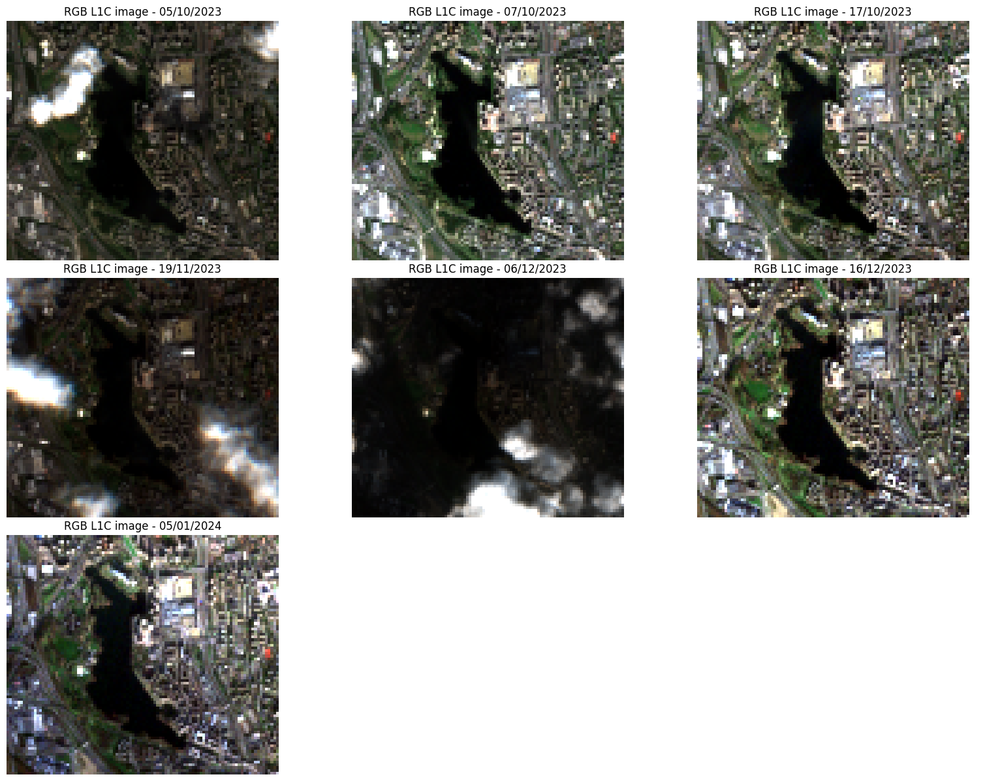

In [ ]:
import os
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

directory = 'validation_images_tif/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    print(date)
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Number of columns in the plot
num_colunas = 3

# Calculate the number of lines in the plot
num_linhas = (len(arquivos_tif) + num_colunas - 1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 5 * num_linhas))
fig.subplots_adjust(wspace=0.075, hspace=0.075,)

def stretch(band, lower_percent=2, higher_percent=98):
    a = 0 # min value
    b = 255 # max value
    c = np.percentile(band, lower_percent)
    d = np.percentile(band, higher_percent)
    t = a + (band - c) * (b - a) / (d - c)
    t[t<a] = a
    t[t>b] = b
    return t

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        rgb = src.read([6, 5, 4])

        # Normalize the bands using histogram stretching
        for band in range(rgb.shape[0]):
            rgb[band] = stretch(rgb[band])

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        # Plot the RGB image on the subplot
        axs[linha, coluna].imshow(rgb.transpose((1, 2, 0)) / 255)  # Divide by 255 to normalize to 0-1
        axs[linha, coluna].set_title(f'RGB L1C image - {date.strftime("%d/%m/%Y")}')
        axs[linha, coluna].axis('off')
        
# Remove all axes from the subplots
for ax in axs.flat:
    ax.axis('off')

# Exibir a figura
plt.show()

### Plotting C2RCC graphic

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2023-10-01'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2024-01-10'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # conc_chl_mean_windows_3x3	conc_chl_sigma_windows_3x3	conc_chl_mean_windows_5x5	conc_chl_sigma_windows_5x5	conc_chl_mean	conc_chl_sigma
  
    
    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean2 = filtered_df2['conc_chl_mean_windows_3x3'].resample('D').mean()
    daily_mean3 = filtered_df2['conc_chl_mean_windows_5x5'].resample('D').mean()
    daily_mean4 = filtered_df2['conc_chl_mean'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean2_unc = filtered_df2['conc_chl_sigma_windows_3x3'].resample('D').mean()
    daily_mean3_unc = filtered_df2['conc_chl_sigma_windows_5x5'].resample('D').mean()
    daily_mean4_unc = filtered_df2['conc_chl_sigma'].resample('D').mean()

    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, yerr=daily_mean1_unc, marker='o', label='Chlorophylle A - In Situ (Mean)')
    ax1.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean2_unc, marker='o', label='Chlorophylle A - C2RCC (3x3)')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophylle A - C2RCC (5x5)')
    ax1.errorbar(daily_mean4.index, daily_mean4, yerr=daily_mean4_unc, marker='o', label='Chlorophylle A - C2RCC (All pixels)')

    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=17)
    ax1.set_xlabel('Date', fontsize=17)
    # Setting font size for values in axes
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods', fontsize=20)
    ax1.legend(fontsize=14)
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2023-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2024-01-10 00:00:00'), description='End Date', step=1)

Output()

### Calculating statistics for each metrics adjusting the in loco data by their lower and upper bounds

In [ ]:
# Set to 'time' be the index if it is not
if df_loco.index.name != 'time':
    # Convert colum time in datetime
    df_loco['time'] = pd.to_datetime(df_loco['time'])
    df_loco.set_index('time', inplace=True)
    
teste = df_loco['chlorophylle A'].resample('D').std()
upper_bound = df_loco['chlorophylle A'].resample('D').mean() + df_loco['chlorophylle A'].resample('D').std()
lower_bound = df_loco['chlorophylle A'].resample('D').mean() - df_loco['chlorophylle A'].resample('D').std()


# Transform lower_bound and upper_bound in one dataframe
upper_bound = pd.DataFrame(upper_bound)
lower_bound = pd.DataFrame(lower_bound)
upper_bound.reset_index(inplace=True)
lower_bound.reset_index(inplace=True)
# Rename the columns
upper_bound.columns = ['date', 'upper_bound']
lower_bound.columns = ['date', 'lower_bound']

bounds = pd.merge(upper_bound, lower_bound, on='date')

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

# Excract the date YYYY-MM-DD for df_loco['time']
df_loco['date'] = df_loco['time'].dt.date
df_loco['date'] = pd.to_datetime(df_loco['date'])

# Merge df_loco with bounds by date
df_loco = pd.merge(df_loco, bounds, on='date')

display(df_loco)

# Drop values in df_loco that aren't in the range of bounds
df_loco = df_loco[(df_loco['chlorophylle A'] >= df_loco['lower_bound']) & (df_loco['chlorophylle A'] <= df_loco['upper_bound'])]



,time,chlorophylle A,date,upper_bound,lower_bound
0,2023-10-04 00:16:19,41.46,2023-10-04,41.900073,22.372400
1,2023-10-04 00:31:19,72.39,2023-10-04,41.900073,22.372400
2,2023-10-04 00:46:19,45.35,2023-10-04,41.900073,22.372400
3,2023-10-04 01:01:19,45.34,2023-10-04,41.900073,22.372400
4,2023-10-04 01:16:19,34.19,2023-10-04,41.900073,22.372400
...,...,...,...,...,...
8497,2024-01-05 22:46:28,0.14,2024-01-05,2.498061,0.806314
8498,2024-01-05 23:01:28,0.48,2024-01-05,2.498061,0.806314
8499,2024-01-05 23:16:28,0.62,2024-01-05,2.498061,0.806314
8500,2024-01-05 23:31:28,0.09,2024-01-05,2.498061,0.806314


Reseting index and calculating the nearest value for clorophyll A for each satellital data

In [ ]:
from datetime import timedelta

# Remove column chlorophyllle A from c2rcc but only if exists
if 'chlorophylle A' in df_c2rcc.columns:
    df_c2rcc.drop(columns=['chlorophylle A'], inplace=True)

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

# Create a new column with the closest value of chlorophyllle A from in situ data

def encontrar_valor_proximo(x, df, janela_temporal=0.3):
    data_alvo = x['Date']
    valor_alvo = x['conc_chl_mean']

    janela_superior = data_alvo + timedelta(days=janela_temporal)
    janela_inferior = data_alvo - timedelta(days=janela_temporal)

    dados_no_intervalo = df[(df['time'] >= janela_inferior) & (df['time'] <= janela_superior)]

    if not dados_no_intervalo.empty:
       
        # Calcular a diferença nos valores
        dados_no_intervalo['dif_values'] = abs(dados_no_intervalo['chlorophylle A'] - valor_alvo)
        
        linha_mais_proxima = dados_no_intervalo.loc[dados_no_intervalo['dif_values'].idxmin()]
        
        return linha_mais_proxima['chlorophylle A']
    else:
        return None

df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)

# display the columns chlorophyllle A and conc_chl
display(df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean']])

C:\Users\arthu\AppData\Local\Temp\ipykernel_22376\19219927.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c2rcc['chlorophylle A - Adjusted'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco), axis=1)


,chlorophylle A - Adjusted,conc_chl_mean
0,12.09,10.3247
1,7.34,8.2507
2,5.81,7.9150
3,0.82,0.2348
4,0.27,0.7228
5,2.46,5.0567


#### Calculation all methods scatter in one plot

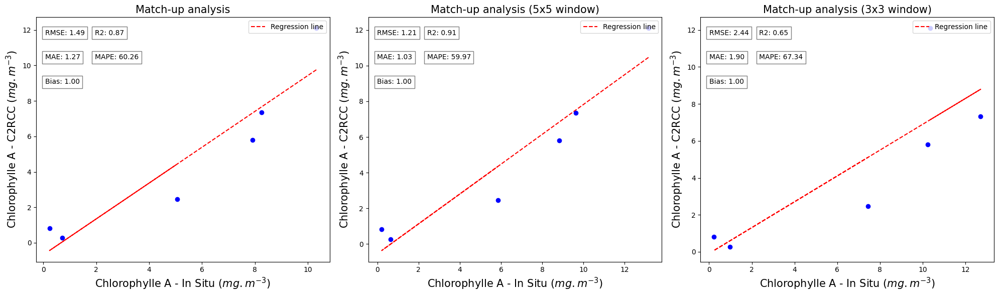

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Assuming you have df_c2rcc dataframe available

# Plot 1
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean', 'Date']].dropna()
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']])
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])
fig, ax = plt.subplots(1, 3, figsize=(20, 6))
ax[0].errorbar(df_c2rcc2['conc_chl_mean'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax[0].plot(df_c2rcc2['conc_chl_mean'], model.predict(df_c2rcc2[['conc_chl_mean']]), ls='--', color='red', label='Regression line')
ax[0].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
ax[0].set_ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
ax[0].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])) ** 0.5:.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])):.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[0].set_title('Match-up analysis', fontsize=15)
ax[0].legend(fontsize=10, loc='upper right')

# Plot 2
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_5x5']].dropna()
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_5x5']], df_c2rcc2[['chlorophylle A - Adjusted']])
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_5x5'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])
ax[1].errorbar(df_c2rcc2['conc_chl_mean_windows_5x5'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax[1].plot(df_c2rcc2['conc_chl_mean_windows_5x5'], model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']]), ls='--', color='red', label='Regression line')
ax[1].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
ax[1].set_ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
ax[1].set_title('Match-up analysis (5x5 window)', fontsize=15)
ax[1].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])) ** 0.5:.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_5x5"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])):.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[1].legend(fontsize=10, loc='upper right')

# Plot 3
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_3x3']].dropna()
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_3x3']], df_c2rcc2[['chlorophylle A - Adjusted']])
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_3x3'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])
ax[2].errorbar(df_c2rcc2['conc_chl_mean_windows_3x3'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax[2].plot(df_c2rcc2['conc_chl_mean_windows_3x3'], model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']]), ls='--', color='red', label='Regression line')
ax[2].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
ax[2].set_ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
ax[2].set_title('Match-up analysis (3x3 window)', fontsize=15)
ax[2].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])) ** 0.5:.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_3x3"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])):.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax[2].legend(fontsize=10, loc='upper right')

plt.tight_layout()
plt.show()


#### Calculation Scatter plot for each method

For conc_chl calculated for all pixels

Intercept: [-0.67211537]
Coefficient: [[1.00978296]]
R2: 0.8696097963962148
RMSE: 1.4921364012486407
MAE: 1.267890603679171
MAPE: 60.26275215628435
Bias: 0.9999999999999986


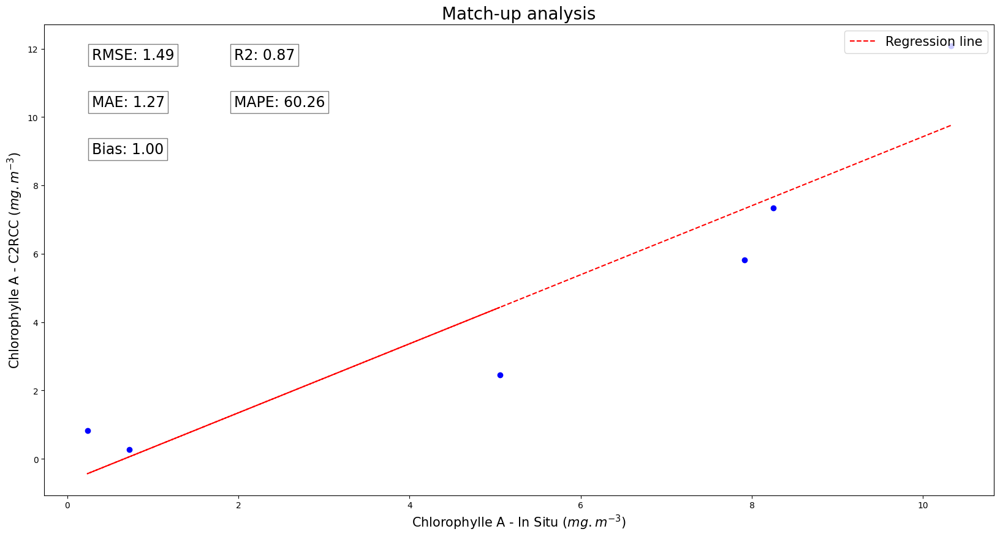

In [ ]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np


# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
print('R2:', model.score(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A - Adjusted']]))
print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])) ** 0.5)
print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean']])))
print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean']]) - df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100)
print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean'], model.predict(df_c2rcc2[['conc_chl_mean']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

For conc_chl calculated for 3x3 windows

Intercept: [-0.08599035]
Coefficient: [[0.69823921]]
R2: 0.6507987720030985
RMSE: 2.4418777894473505
MAE: 1.8958846613913287
MAPE: 67.34473395005392
Bias: 0.9999999999999999


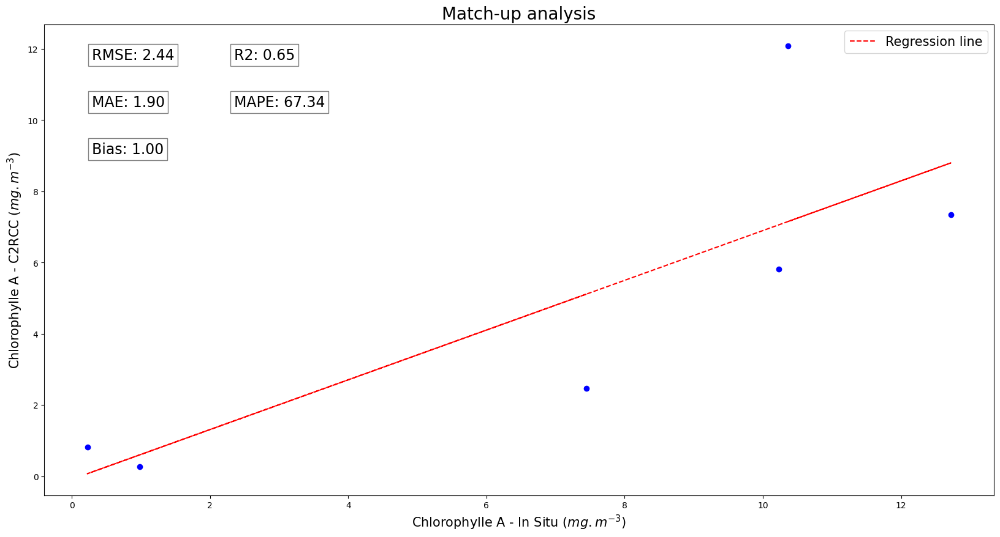

In [ ]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_3x3']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_3x3']], df_c2rcc2[['chlorophylle A - Adjusted']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_3x3'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
print('R2:', model.score(df_c2rcc2[['conc_chl_mean_windows_3x3']], df_c2rcc2[['chlorophylle A - Adjusted']]))
print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']])) ** 0.5)
print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']])))
print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']]) - df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100)
print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean_windows_3x3'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean_windows_3x3'], model.predict(df_c2rcc2[['conc_chl_mean_windows_3x3']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_3x3"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_3x3"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

For conc_chl calculated for 5x5 windows

Intercept: [-0.53873318]
Coefficient: [[0.83585516]]
R2: 0.9141056069893798
RMSE: 1.21106778280064
MAE: 1.0324688252412386
MAPE: 59.97313986119135
Bias: 1.0000000000000027


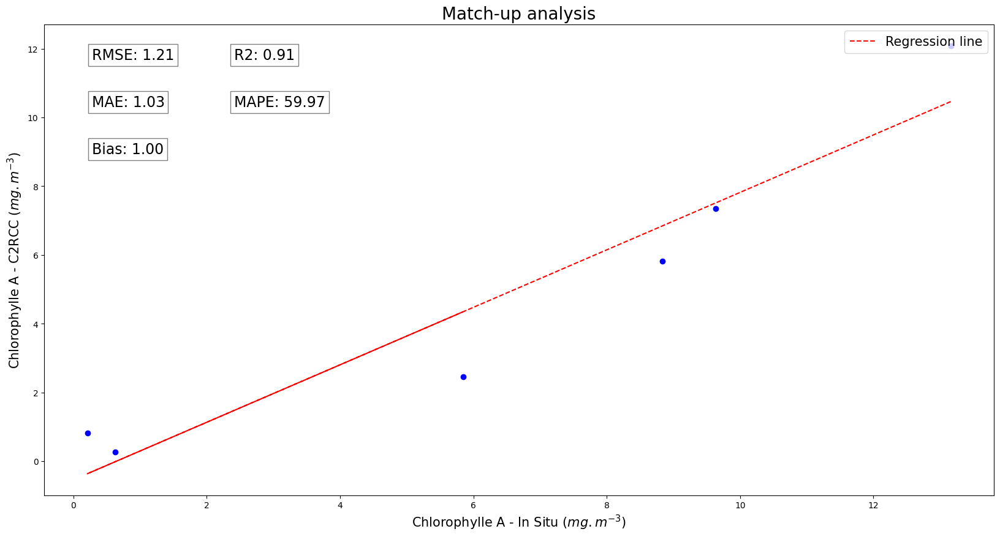

In [ ]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A - Adjusted', 'conc_chl_mean_windows_5x5']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean_windows_5x5']], df_c2rcc2[['chlorophylle A - Adjusted']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc2['chlorophylle A - Adjusted'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean_windows_5x5'])
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A - Adjusted']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
print('R2:', model.score(df_c2rcc2[['conc_chl_mean_windows_5x5']], df_c2rcc2[['chlorophylle A - Adjusted']]))
print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']])) ** 0.5)
print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A - Adjusted']], model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']])))
print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']]) - df_c2rcc2[['chlorophylle A - Adjusted']]) / df_c2rcc2[['chlorophylle A - Adjusted']])) * 100)
print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A - Adjusted']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean_windows_5x5'], df_c2rcc2['chlorophylle A - Adjusted'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean_windows_5x5'], model.predict(df_c2rcc2[['conc_chl_mean_windows_5x5']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean_windows_5x5"]],df_c2rcc2[["chlorophylle A - Adjusted"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A - Adjusted"]], model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean_windows_5x5"]]) - df_c2rcc2[["chlorophylle A - Adjusted"]]) / df_c2rcc2[["chlorophylle A - Adjusted"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A - Adjusted"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

#### Analysis whithout the adjust by uncertain for conc_chl for all pixels

In [ ]:
# Merge the chrlorophylle A column from in situ data to c2rcc data
df_c2rcc = pd.merge_asof(df_c2rcc, df_loco[['time', 'chlorophylle A']], left_on='Date', right_on='time', direction='nearest')

Intercept: [-0.63908585]
Coefficient: [[0.93200414]]
R2: 0.6478514569409136
RMSE: 2.6221847572073664
MAE: 2.2507024000327527
MAPE: 75.50379693158771
Bias: 1.0000000000000016


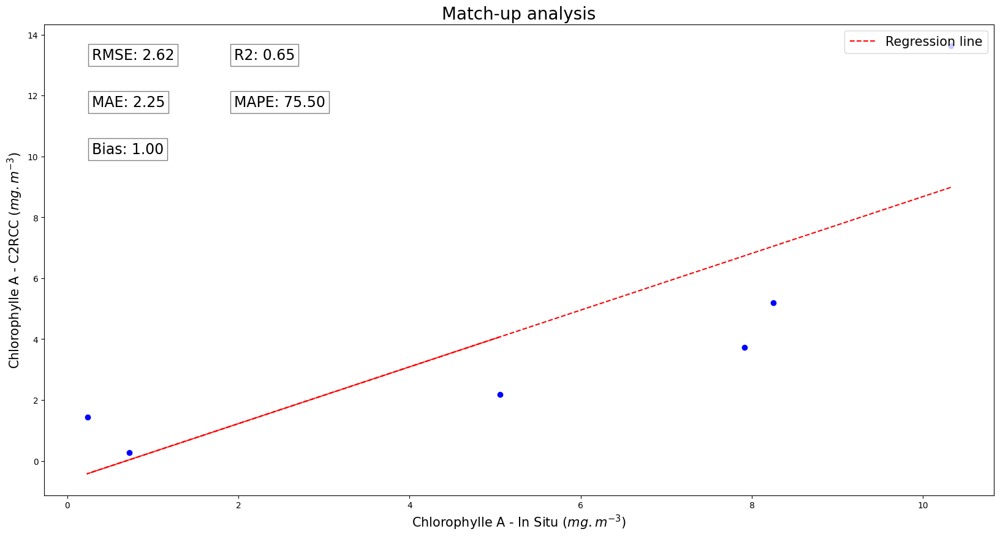

In [ ]:
# Calculate the regression between the two columns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import numpy as np

# Create a new dataframe with the columns chlorophyllle A and conc_chl
df_c2rcc2 = df_c2rcc[['chlorophylle A', 'conc_chl_mean']].dropna()

# Create the linear regression model
model = LinearRegression()
model.fit(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A']])

# Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
df_c2rcc2['log_chlorophylle A'] = np.log10(df_c2rcc2['chlorophylle A'])
df_c2rcc2['log_conc_chl_mean'] = np.log10(df_c2rcc2['conc_chl_mean'])
df_c2rcc2 = df_c2rcc2.dropna()
model2 = LinearRegression()
model2.fit(df_c2rcc2[['log_conc_chl_mean']], df_c2rcc2[['log_chlorophylle A']])

print('Intercept:', model.intercept_)
print('Coefficient:', model.coef_)
print('R2:', model.score(df_c2rcc2[['conc_chl_mean']], df_c2rcc2[['chlorophylle A']]))
print('RMSE:', mean_squared_error(df_c2rcc2[['chlorophylle A']], model.predict(df_c2rcc2[['conc_chl_mean']])) ** 0.5)
print('MAE:', mean_absolute_error(df_c2rcc2[['chlorophylle A']], model.predict(df_c2rcc2[['conc_chl_mean']])))
print('MAPE:', np.mean(np.abs((model.predict(df_c2rcc2[['conc_chl_mean']]) - df_c2rcc2[['chlorophylle A']]) / df_c2rcc2[['chlorophylle A']])) * 100)
print('Bias:', 10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[['log_conc_chl_mean']]).T - df_c2rcc2[['log_chlorophylle A']].values))))


# Plot the regression line
fig, ax = plt.subplots(figsize=(20, 10))
#Plot errors bars
ax.errorbar(df_c2rcc2['conc_chl_mean'], df_c2rcc2['chlorophylle A'], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
ax.plot(df_c2rcc2['conc_chl_mean'], model.predict(df_c2rcc2[['conc_chl_mean']]), ls='--', color='red', label='Regression line')

plt.xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
plt.ylabel('Chlorophylle A - C2RCC ($mg.m^{-3}$)', fontsize=15)
# Text box with each metric value
ax.text(0.05, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[["chlorophylle A"]], model.predict(df_c2rcc2[["conc_chl_mean"]])) ** 0.5:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[["conc_chl_mean"]],df_c2rcc2[["chlorophylle A"]]):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[["chlorophylle A"]], model.predict(df_c2rcc2[["conc_chl_mean"]])):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[["conc_chl_mean"]]) - df_c2rcc2[["chlorophylle A"]]) / df_c2rcc2[["chlorophylle A"]])) * 100:.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
ax.text(0.05, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[["log_conc_chl_mean"]]).T - df_c2rcc2[["log_chlorophylle A"]].values))):.2f}', transform=ax.transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

plt.title('Match-up analysis', fontsize=20)
plt.legend(fontsize=15, loc='upper right')
plt.show()

### Plotting the table for the statistics after adjusting

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Create a DataFrame to store the results
results_df_initial = pd.DataFrame(columns=['Metric'])

# Loop through the columns and perform the analysis
for column in ['conc_chl_mean',
               'conc_chl_mean_windows_3x3',
               'conc_chl_mean_windows_5x5'
               ]:
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    model.fit(df_c2rcc[[column]], df_c2rcc[['chlorophylle A - Adjusted']])
    
    # Create columns with logaritmic in base 10 values of chlorophyllle A and conc_chl
    df_c2rcc['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc['chlorophylle A - Adjusted'])
    df_c2rcc[f'log_metric'] = np.log10(df_c2rcc[column])
    model2 = LinearRegression()
    model2.fit(df_c2rcc[['log_metric']], df_c2rcc[['log_chlorophylle A - Adjusted']])

    # Prevê os valores usando o modelo
    predicted_values = model.predict(df_c2rcc[[column]])

    # Cálculo do R²
    r2 = model.score(df_c2rcc[[column]], df_c2rcc[['chlorophylle A - Adjusted']])

    # Calculation of the Root Mean Square Error (RMSE)
    rmse = mean_squared_error(df_c2rcc[['chlorophylle A - Adjusted']], model.predict(df_c2rcc[[column]])) ** 0.5

    # Calculation of the Mean Absolute Error (MAE)
    mae = mean_absolute_error(df_c2rcc[['chlorophylle A - Adjusted']], model.predict(df_c2rcc[[column]]))
    
    # Calculation of the Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((model.predict(df_c2rcc[[column]]) - df_c2rcc[['chlorophylle A - Adjusted']]) / df_c2rcc[['chlorophylle A - Adjusted']])) * 100

    # Calculation of the Bias
    bias = 10 ** (np.mean(np.sum(model2.predict(df_c2rcc[[f'log_metric']]).T - df_c2rcc[['log_chlorophylle A - Adjusted']].values)))

    # Append the results to the DataFrame
    results_df_initial = pd.concat([results_df_initial, pd.DataFrame([[column, r2, rmse, mae, mape,bias]], columns=['Metric', 'R²', 'RMSE', 'MAE', 'MAPE', 'Bias'])], ignore_index=True)

# Display the results DataFrame
display(results_df_initial)

C:\Users\arthu\AppData\Local\Temp\ipykernel_3500\3487618915.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c2rcc['log_chlorophylle A - Adjusted'] = np.log10(df_c2rcc['chlorophylle A - Adjusted'])
C:\Users\arthu\AppData\Local\Temp\ipykernel_3500\3487618915.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_c2rcc[f'log_metric'] = np.log10(df_c2rcc[column])
C:\Users\arthu\AppData\Local\Temp\ipykernel_3500\3487618915.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice 

,Metric,R²,RMSE,MAE,MAPE,Bias
0,conc_chl_mean,0.869610,1.492136,1.267891,60.262752,1.0
1,conc_chl_mean_windows_3x3,0.650799,2.441878,1.895885,67.344734,1.0
2,conc_chl_mean_windows_5x5,0.914106,1.211068,1.032469,59.973140,1.0


Making heat map for each image for conc_chl_mean

{Timestamp('2023-10-05 10:59:11'): 'validation_images_tif/S2_MSIL1C_20231005T105911_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-10-07 10:48:29'): 'validation_images_tif/S2_MSIL1C_20231007T104829_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-10-17 10:49:39'): 'validation_images_tif/S2_MSIL1C_20231017T104939_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-11-19 11:02:49'): 'validation_images_tif/S2_MSIL1C_20231119T110249_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-12-06 10:53:39'): 'validation_images_tif/S2_MSIL1C_20231206T105339_samp_mask_C2RCC_mathbands.tif', Timestamp('2023-12-16 10:53:49'): 'validation_images_tif/S2_MSIL1C_20231216T105349_samp_mask_C2RCC_mathbands.tif', Timestamp('2024-01-05 10:53:39'): 'validation_images_tif/S2_MSIL1C_20240105T105339_samp_mask_C2RCC_mathbands.tif'}


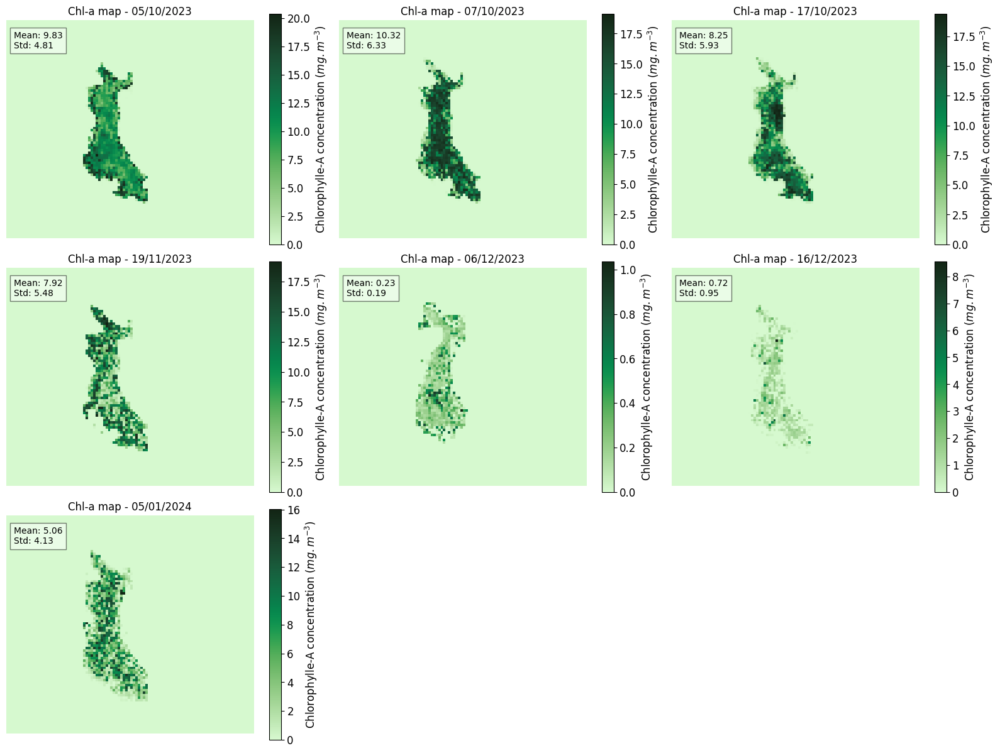

In [ ]:


import os
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cmocean.cm as cmo

directory = 'validation_images_tif/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))
print(arquivos_tif_dict)

# Copy of the dictionary
arquivos_tif_dict_final = arquivos_tif_dict.copy()

# Read the band 50 of each .tif file, if the maximum value is 0, the image is removed from the dictionary
for date, arquivo_tif in arquivos_tif_dict.items():
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        conc_chl = src.read(50)

        if conc_chl.max() == 0:
            del arquivos_tif_dict_final[date]
        elif date in dates_to_remove:
            del arquivos_tif_dict_final[date]
        

# Number of columns in the plot
num_colunas = 3

num_linhas = (len(arquivos_tif_dict_final) + num_colunas-1) // num_colunas

# Configuring subplots
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(20, 5 * num_linhas))
fig.subplots_adjust(wspace=0.075, hspace=0.075,)

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict_final.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        # Reads Bands 4, 3, and 2 into a numpy array
        conc_chl = src.read(50)
        #Calculate mean of conc_chl desconsidering 0 values
        conc_chl_mean = conc_chl_mean = np.mean(conc_chl[conc_chl != 0 & ~np.isnan(conc_chl)])

        if conc_chl.max() == 0:
           continue

        # Position of the subplot
        linha = i // num_colunas
        coluna = i % num_colunas

        # Adding a color bar
        # Reading algae colormap (https://matplotlib.org/cmocean/) and ploting it
        
        algae = cmocean.cm.algae
        cbar = fig.colorbar(axs[linha, coluna].imshow(conc_chl, cmap=algae, interpolation = 'nearest'))
        cbar.ax.tick_params(labelsize=12)
        cbar.ax.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=12)
        axs[linha, coluna].set_title(f'Chl-a map - {date.strftime("%d/%m/%Y")}')
        axs[linha, coluna].text(0.03, 0.95, f'Mean: {conc_chl_mean:.2f}\nStd: {np.std(conc_chl[conc_chl != 0 & ~np.isnan(conc_chl)]):.2f}', transform=axs[linha, coluna].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

        
# Remove all axes from the subplots
for ax in axs.flat:
    ax.axis('off')

# Exibir a figura
plt.show()

## Validation for other bio-optical models

In [ ]:
import os
import rasterio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Diretório contendo os arquivos .tif
directory = 'validation_images_tif/'

# List for storing the paths of the .tif files
arquivos_tif = [os.path.join(directory, arquivo) for arquivo in os.listdir(directory) if arquivo.endswith('.tif')]

arquivos_tif_dict = {}
for arquivo_tif in arquivos_tif:
    # Extract date from the name of the file
    date = arquivo_tif.split('_')[4]
    # Convert the date to datetime format
    date = pd.to_datetime(date, format='%Y%m%dT%H%M%S')
    # Add the file path to the dictionary
    arquivos_tif_dict[date] = arquivo_tif

# Sort the dictionary by its keys (the dates)
arquivos_tif_dict = dict(sorted(arquivos_tif_dict.items()))

# Initialize an empty dataframe
df_c2rcc = pd.DataFrame()
# List of bands for Reflectance TOA
band_indices_new = {'conc_chl': band_indices['conc_chl'], 'unc_chl': band_indices['unc_chl'], 'Chlorophyll index 3-bands': band_indices['3_bands_model_chl_conc'], \
                    'Empirical 2-bands - Equation 1': band_indices['empirical_2_bands_equation1'], 'Empirical 2-bands - Equation 2': band_indices['empirical_2_bands_equation2'], \
                    'Empirical 3-bands - Equation 1': band_indices['empirical_3_bands_equation1'], 'Empirical 3-bands - Equation 3': band_indices['empirical_3_bands_equation3'], \
                    'Rrs_B4': band_indices['rrs_B4'], 'Rrs_B5': band_indices['rrs_B5'], \
                    'Rrs_B6': band_indices['rrs_B6'], 'Rrs_B7': band_indices['rrs_B7'], 'iop_apig': band_indices['iop_apig'], 'unc_apig': band_indices['unc_apig']}

# Iterate over each .tif file
for i, (date, arquivo_tif) in enumerate(arquivos_tif_dict.items()):
    # Open the .tif file
    with rasterio.open(arquivo_tif) as src:
        rrs_values = []
        for band_name, band_index in band_indices_new.items():
            rrs_band = src.read(band_index)
            rrs_band = rrs_band[(rrs_band != 0) & (~np.isnan(rrs_band))]

            # Classsification of the bands with no values
            if rrs_band.size == 0:
                rrs_values.append(np.nan)
                rrs_values.append(np.nan)
                continue
            
            # Testing filtering outliers
            # Filtering outliers quartile 1 and 3
            q1 = np.percentile(rrs_band, 25)
            q3 = np.percentile(rrs_band, 75)
            iqr = q3 - q1
            rrs_band = rrs_band[(rrs_band > q1 - 1.5 * iqr) & (rrs_band < q3 + 1.5 * iqr)]
    
            mean_rrs_band = rrs_band.mean()
            rrs_values.append(mean_rrs_band)
            
            # Testing with median
            #median_rrs_band = np.median(rrs_band)
            #rrs_values.append(median_rrs_band)

            if not band_name in ['conc_chl', 'unc_chl', 'iop_apig', 'unc_apig']:
                error_rrs_band = rrs_band.std()
                rrs_values.append(error_rrs_band)

        # Create a dictionary with the date and mean values of each band
        data = {'Date': date, 'conc_chl': rrs_values[0], 'unc_chl': rrs_values[1], 'Chlorophyll index 3-bands': rrs_values[2], \
                'unc_Chlorophyll index 3-bands':rrs_values[3], \
                'Empirical 2-bands - Equation 1': rrs_values[4], 'unc_Empirical 2-bands - Equation 1': rrs_values[5],\
                'Empirical 2-bands - Equation 2': rrs_values[6], 'unc_Empirical 2-bands - Equation 2': rrs_values[7], \
                'Empirical 3-bands - Equation 1': rrs_values[8], 'unc_Empirical 3-bands - Equation 1': rrs_values[9],\
                'Empirical 3-bands - Equation 3': rrs_values[10], 'unc_Empirical 3-bands - Equation 3': rrs_values[11], \
                'Rrs_B4':  rrs_values[12], 'unc_Rrs_B4':  rrs_values[13], \
                'Rrs_B5':  rrs_values[14], 'unc_Rrs_B5':  rrs_values[15], \
                'Rrs_B6':  rrs_values[16], 'unc_Rrs_B6':  rrs_values[17], \
                'Rrs_B7':  rrs_values[18], 'unc_Rrs_B7':  rrs_values[19], \
                'iop_apig':  rrs_values[20], 'unc_apig':  rrs_values[21]
                }
        
        # Append the dictionary as a new row to the dataframe
        df_c2rcc = pd.concat([df_c2rcc, pd.DataFrame(data, index=[0])], ignore_index=True)

# Remove the images that didn't pass the quality control
df_c2rcc.dropna(inplace=True)

dates_to_remove = ['2023-10-05 10:59:11']
df_c2rcc = df_c2rcc[~df_c2rcc['Date'].isin(dates_to_remove)]


# Indexing the dataframe by date
df_c2rcc.set_index('Date', inplace=True)

df_c2rcc['Empirical 2-bands - Equation 1'] = df_c2rcc['Empirical 2-bands - Equation 1'] + 45

# Display the dataframe
display(df_c2rcc)

,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,unc_Empirical 3-bands - Equation 1,...,Rrs_B4,unc_Rrs_B4,Rrs_B5,unc_Rrs_B5,Rrs_B6,unc_Rrs_B6,Rrs_B7,unc_Rrs_B7,iop_apig,unc_apig
Date,,,,,,,,,,,,,,,,,,,,,
2023-10-07 10:48:29,10.324746,2.572421,8.033365,2.153723,10.454304,2.696042,8.706839,1.065300,8.008698,2.218201,...,0.000290,0.000132,0.000226,0.000116,0.000073,3.986104e-05,0.000077,4.282486e-05,0.732656,0.113849
2023-10-17 10:49:39,8.250731,2.076347,7.425392,2.012004,8.482819,4.029007,8.010365,1.670839,7.438888,2.124954,...,0.000223,0.000106,0.000170,0.000092,0.000055,3.199425e-05,0.000058,3.446477e-05,0.557162,0.087485
2023-11-19 11:02:49,7.915023,2.290471,10.772162,1.535185,14.496250,2.789118,10.017662,0.656551,10.758511,1.430890,...,0.000476,0.000204,0.000400,0.000187,0.000141,7.027115e-05,0.000148,7.333346e-05,0.521021,0.095364
2023-12-06 10:53:39,0.203560,0.052125,4.313193,0.260292,0.400570,0.301441,2.241442,0.156404,3.786624,0.122403,...,0.000048,0.000005,0.000026,0.000003,0.000006,8.916661e-07,0.000006,7.966683e-07,0.003758,0.000593
2023-12-16 10:53:49,0.612736,0.285029,4.416546,0.605408,5.143215,2.582909,5.356285,1.518014,4.731956,0.905939,...,0.000082,0.000027,0.000052,0.000021,0.000015,7.027506e-06,0.000015,7.501451e-06,0.018264,0.006451
2024-01-05 10:53:39,5.056719,1.365964,6.493340,1.830299,8.554516,3.953073,7.242851,1.959193,6.795234,1.976087,...,0.000218,0.000134,0.000161,0.000108,0.000052,3.666350e-05,0.000053,3.783166e-05,0.294015,0.050175


In [ ]:
# Set index for df_loco if not already set
if not df_loco.index.name == 'time':
    df_loco.set_index('time', inplace=True)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
import matplotlib.dates as mdates

# Create a slider widget for selecting the time range
start_date_widget = widgets.DatePicker(description='Start Date', value=pd.to_datetime('2023-10-01'))
end_date_widget = widgets.DatePicker(description='End Date', value=pd.to_datetime('2024-01-10'))
# Define a function to update the plot based on the selected time range
def update_plot(start_date, end_date):
    filtered_df = df_loco.loc[start_date:end_date]
    filtered_df2 = df_c2rcc.loc[start_date:end_date]

    # Resample the data to daily frequency and calculate the mean for each day
    daily_mean1 = filtered_df['chlorophylle A'].resample('D').mean()
    daily_mean2 = filtered_df2['conc_chl'].resample('D').mean()
    daily_mean3 = filtered_df2['Chlorophyll index 3-bands'].resample('D').mean()
    daily_mean4 = filtered_df2['Empirical 2-bands - Equation 1'].resample('D').mean()
    daily_mean5 = filtered_df2['Empirical 2-bands - Equation 2'].resample('D').mean()
    daily_mean6 = filtered_df2['Empirical 3-bands - Equation 1'].resample('D').mean()
    daily_mean7 = filtered_df2['Empirical 3-bands - Equation 3'].resample('D').mean()

    # Resample the errors to daily frequency and calculate the mean for each day
    daily_mean1_unc = filtered_df['chlorophylle A'].resample('D').std()
    daily_mean2_unc = filtered_df2['unc_chl'].resample('D').mean()
    daily_mean3_unc = filtered_df2['unc_Chlorophyll index 3-bands'].resample('D').mean()
    daily_mean4_unc = filtered_df2['unc_Empirical 2-bands - Equation 1'].resample('D').mean()
    daily_mean5_unc = filtered_df2['unc_Empirical 2-bands - Equation 2'].resample('D').mean()
    daily_mean6_unc = filtered_df2['unc_Empirical 3-bands - Equation 1'].resample('D').mean()
    daily_mean7_unc = filtered_df2['unc_Empirical 3-bands - Equation 3'].resample('D').mean()
    # Create a figure with two subplots
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot data and the errors
    ax1.errorbar(daily_mean1.index, daily_mean1, yerr=daily_mean1_unc, marker='o', label='Chlorophylle A - In Situ (Mean)')
    ax1.errorbar(daily_mean2.index, daily_mean2, yerr=daily_mean2_unc, marker='o', label='Chlorophylle A - C2RCC')
    ax1.errorbar(daily_mean3.index, daily_mean3, yerr=daily_mean3_unc, marker='o', label='Chlorophyll index 3-bands')
    ax1.errorbar(daily_mean4.index, daily_mean4, yerr=daily_mean4_unc, marker='o', label='Empirical 2-bands - Equation 1')
    ax1.errorbar(daily_mean5.index, daily_mean5, yerr=daily_mean5_unc, marker='o', label='Empirical 2-bands - Equation 2')
    ax1.errorbar(daily_mean6.index, daily_mean6, yerr=daily_mean6_unc, marker='o', label='Empirical 3-bands - Equation 1')
    ax1.errorbar(daily_mean7.index, daily_mean7, yerr=daily_mean7_unc, marker='o', label='Empirical 3-bands - Equation 3')
    # Set the y-axis label
    ax1.set_ylabel('Chlorophylle-A concentration ($mg.m^{-3}$)', fontsize=17)
    ax1.set_xlabel('Date', fontsize=17)
    # Setting font size for values in axes
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.set_ylim(0)
    ax1.set_title('Time series of C2RCC chlorophylle-A concentration by different methods', fontsize=20)
    ax1.legend(fontsize=14)
    
    # Format x-axis ticks as months (mm/yyyy)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    
    plt.tight_layout()
    plt.show()

# Create an interactive output widget
output = widgets.interactive_output(update_plot, {'start_date': start_date_widget, 'end_date': end_date_widget})

# Display the widgets and the output
display(start_date_widget, end_date_widget, output)



DatePicker(value=Timestamp('2023-10-01 00:00:00'), description='Start Date', step=1)

DatePicker(value=Timestamp('2024-01-10 00:00:00'), description='End Date', step=1)

Output()

Plotting the statistics


In [ ]:
df_c2rcc

,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,...,Rrs_B7,unc_Rrs_B7,iop_apig,unc_apig,chlorophylle A - Adjusted conc_chl,chlorophylle A - Adjusted Chlorophyll index 3-bands,chlorophylle A - Adjusted Empirical 2-bands - Equation 1,chlorophylle A - Adjusted Empirical 2-bands - Equation 2,chlorophylle A - Adjusted Empirical 3-bands - Equation 1,chlorophylle A - Adjusted Empirical 3-bands - Equation 3
1,2023-10-07 10:48:29,10.324746,2.572421,8.033365,2.153723,10.454304,2.696042,8.706839,1.065300,8.008698,...,0.000077,4.282486e-05,0.732656,0.113849,11.58,11.58,11.58,11.58,11.58,11.58
2,2023-10-17 10:49:39,8.250731,2.076347,7.425392,2.012004,8.482819,4.029007,8.010365,1.670839,7.438888,...,0.000058,3.446477e-05,0.557162,0.087485,8.20,7.34,8.20,8.17,7.34,7.61
3,2023-11-19 11:02:49,7.915023,2.290471,10.772162,1.535185,14.496250,2.789118,10.017662,0.656551,10.758511,...,0.000148,7.333346e-05,0.521021,0.095364,6.11,6.11,6.11,6.11,6.11,6.11
4,2023-12-06 10:53:39,0.203560,0.052125,4.313193,0.260292,0.400570,0.301441,2.241442,0.156404,3.786624,...,0.000006,7.966683e-07,0.003758,0.000593,0.82,2.83,0.82,2.24,2.83,2.83
5,2023-12-16 10:53:49,0.612736,0.285029,4.416546,0.605408,5.143215,2.582909,5.356285,1.518014,4.731956,...,0.000015,7.501451e-06,0.018264,0.006451,0.65,1.30,1.30,1.30,1.30,1.30
6,2024-01-05 10:53:39,5.056719,1.365964,6.493340,1.830299,8.554516,3.953073,7.242851,1.959193,6.795234,...,0.000053,3.783166e-05,0.294015,0.050175,2.49,2.49,2.49,2.49,2.49,2.49


In [ ]:
from datetime import timedelta

# Remove column chlorophyllle A from c2rcc but only if exists
if 'chlorophylle A' in df_c2rcc.columns:
    df_c2rcc.drop(columns=['chlorophylle A'], inplace=True)

# Reset the index of c2rcc data if it is not the default index
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)
# Remove the dates that are bad for the analysis

# Dropping the date because of Cirrus_Ambiguos mask:
dates_to_remove = ['2023-10-05 10:59:11']
df_c2rcc = df_c2rcc[~df_c2rcc['Date'].isin(dates_to_remove)]

#Convert the 'time' column to datetime
df_c2rcc['Date'] = pd.to_datetime(df_c2rcc['Date'])

# Reset the index of in situ data if it is not the default index
if df_loco.index.name == 'time':
    df_loco.reset_index(inplace=True)

def encontrar_valor_proximo(x, df, column = 'conc_chl', janela_temporal=1):
    data_alvo = x['Date']
    valor_alvo = x[column]

    janela_superior = data_alvo + timedelta(days=janela_temporal)
    janela_inferior = data_alvo - timedelta(days=janela_temporal)

    dados_no_intervalo = df[(df['time'] >= janela_inferior) & (df['time'] <= janela_superior)]

    if not dados_no_intervalo.empty:
       
        # Calcular a diferença nos valores
        dados_no_intervalo['dif_values'] = abs(dados_no_intervalo['chlorophylle A'] - valor_alvo)
        
        # Encontrar a linha com a menor diferença nos valores
        linha_mais_proxima = dados_no_intervalo.loc[dados_no_intervalo['dif_values'].idxmin()]
        
        return linha_mais_proxima['chlorophylle A']
    else:
        return None


df_c2rcc['chlorophylle A - Adjusted conc_chl'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'conc_chl'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Chlorophyll index 3-bands'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Chlorophyll index 3-bands'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 2-bands - Equation 1'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 2-bands - Equation 1'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 2-bands - Equation 2'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 2-bands - Equation 2'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 3-bands - Equation 1'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 3-bands - Equation 1'), axis=1)
df_c2rcc['chlorophylle A - Adjusted Empirical 3-bands - Equation 3'] = df_c2rcc.apply(lambda x: encontrar_valor_proximo(x,df_loco, column = 'Empirical 3-bands - Equation 3'), axis=1)



In [ ]:
df_c2rcc

,Date,conc_chl,unc_chl,Chlorophyll index 3-bands,unc_Chlorophyll index 3-bands,Empirical 2-bands - Equation 1,unc_Empirical 2-bands - Equation 1,Empirical 2-bands - Equation 2,unc_Empirical 2-bands - Equation 2,Empirical 3-bands - Equation 1,...,Rrs_B7,unc_Rrs_B7,iop_apig,unc_apig,chlorophylle A - Adjusted,chlorophylle A - Adjusted Chlorophyll index 3-bands,chlorophylle A - Adjusted Empirical 2-bands - Equation 1,chlorophylle A - Adjusted Empirical 2-bands - Equation 2,chlorophylle A - Adjusted Empirical 3-bands - Equation 1,chlorophylle A - Adjusted Empirical 3-bands - Equation 3
1,2023-10-07 10:48:29,10.324746,2.572421,9.660132,3.300975,17.546663,4.304941,11.087920,3.036493,13.914097,...,0.000077,4.282486e-05,0.732656,0.113849,10.12,10.00,17.53,11.09,13.95,10.80
2,2023-10-17 10:49:39,8.250731,2.076347,8.728302,3.083764,14.398673,6.433371,8.837431,4.445776,13.378813,...,0.000058,3.446477e-05,0.557162,0.087485,8.25,8.61,8.96,8.91,8.96,8.96
3,2023-11-19 11:02:49,7.915023,2.290471,13.857840,2.352952,24.000704,4.453561,15.081416,2.458813,16.497288,...,0.000148,7.333346e-05,0.521021,0.095364,6.11,6.11,6.11,6.11,6.11,6.11
4,2023-12-06 10:53:39,0.203560,0.052125,3.958289,0.398945,1.493236,0.481330,-0.033163,0.190385,9.947850,...,0.000006,7.966683e-07,0.003758,0.000593,0.69,2.97,1.50,0.69,2.97,2.97
5,2023-12-16 10:53:49,0.612736,0.285029,4.116696,0.927899,9.066113,4.124293,4.486464,2.494907,10.835901,...,0.000015,7.501451e-06,0.018264,0.006451,0.61,1.31,1.31,1.31,1.31,1.31
6,2024-01-05 10:53:39,5.056719,1.365964,7.299761,2.805268,14.513152,6.312122,8.296986,4.002617,12.774159,...,0.000053,3.783166e-05,0.294015,0.050175,2.51,2.51,2.51,2.51,2.51,2.51


0 0
0 1
1 0
1 1
2 0
2 1


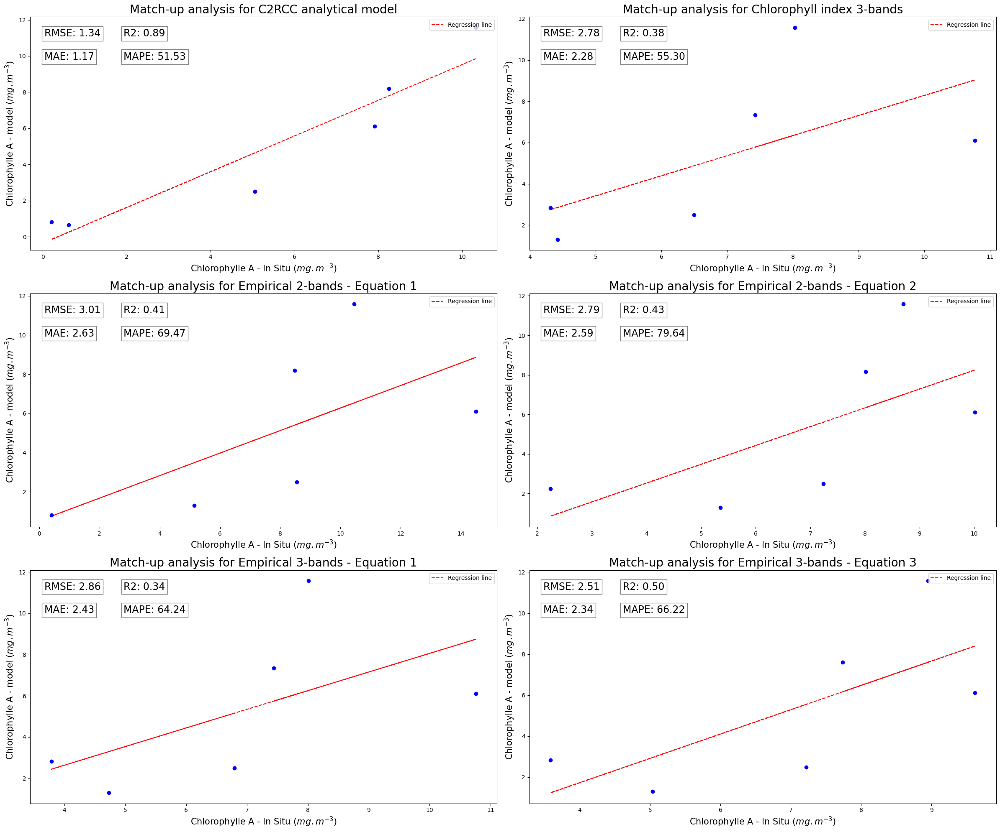

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Transforming the index of df_c2rcc into 'Date' again
if df_c2rcc.index.name == 'Date':
    df_c2rcc.reset_index(inplace=True)

fig, ax = plt.subplots(3, 2, figsize=(24,20))

i, j = 0, 0

# Loop through the columns and perform the analysis
for column in [ 'conc_chl', 'Chlorophyll index 3-bands', 'Empirical 2-bands - Equation 1', 'Empirical 2-bands - Equation 2',
        'Empirical 3-bands - Equation 1', 'Empirical 3-bands - Equation 3']:
    j = j + 1
    if j == 3:
        j = 1
        i = i + 1
    print(i, j-1)
    
    # Cria o modelo de regressão linear
    model = LinearRegression()

    chl_column_adjusted = 'chlorophylle A - Adjusted ' + column

    # Ajusta o modelo usando a coluna 'conc_chl' como variável independente e a coluna atual como variável dependente
    df_c2rcc2 = df_c2rcc[[chl_column_adjusted, column, 'Date']].dropna()
    model.fit(df_c2rcc2[[column]], df_c2rcc2[[chl_column_adjusted]])

    ax[i, j -1].errorbar(df_c2rcc2[column], df_c2rcc2[chl_column_adjusted], fmt='o', color='blue', ecolor='lightgray', elinewidth=3, capsize=0)
    ax[i, j -1].plot(df_c2rcc2[column], model.predict(df_c2rcc2[[column]]), ls='--', color='red', label='Regression line')
    ax[i, j -1].set_xlabel('Chlorophylle A - In Situ ($mg.m^{-3}$)', fontsize=15)
    ax[i, j -1].set_ylabel('Chlorophylle A - model ($mg.m^{-3}$)', fontsize=15)
    ax[i, j -1].text(0.03, 0.95, f'RMSE: {mean_squared_error(df_c2rcc2[[chl_column_adjusted]], model.predict(df_c2rcc2[[column]])) ** 0.5:.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    ax[i, j -1].text(0.20, 0.95, f'R2: {model.score(df_c2rcc2[[column]],df_c2rcc2[[chl_column_adjusted]]):.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    ax[i, j -1].text(0.03, 0.85, f'MAE: {mean_absolute_error(df_c2rcc2[[chl_column_adjusted]], model.predict(df_c2rcc2[[column]])):.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    ax[i, j -1].text(0.20, 0.85, f'MAPE: {np.mean(np.abs((model.predict(df_c2rcc2[[column]]) - df_c2rcc2[[chl_column_adjusted]]) / df_c2rcc2[[chl_column_adjusted]])) * 100:.2f}', transform=ax[i, j -1].transAxes, fontsize=17, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    #ax[i, j -1].text(0.03, 0.75, f'Bias: {10 ** (np.mean(np.sum(model2.predict(df_c2rcc2[[log_column]]).T - df_c2rcc2[[log_chla]].values))):.2f}', transform=ax[i, j -1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
    if column == 'conc_chl':
        ax[i, j -1].set_title('Match-up analysis for C2RCC analytical model', fontsize=20)
    else:
        ax[i, j -1].set_title('Match-up analysis for ' + column.replace(' adjusted final', ''), fontsize=20)
    ax[i, j -1].legend(fontsize=10, loc='upper right')

# hide axis without values
#ax[2, 1].axis('off')

plt.tight_layout()
plt.show()

